In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import re



# Contexte

Vous êtes Data Scientist au sein d'une société financière, nommée "Prêt à dépenser",  qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt.


L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus demandeurs de transparence vis-à-vis des décisions d’octroi de crédit. Cette demande de transparence des clients va tout à fait dans le sens des valeurs que l’entreprise veut incarner.

Prêt à dépenser décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement. 

# Le jeu de données

Le jeu de données est constitué de dix fichiers .csv séparés par une virgule. 

## application_{train|test}.csv

Il s'agit de la table principale, divisée en deux fichiers pour Train (avec TARGET) et Test (sans TARGET).
Données statiques pour toutes les applications. Une ligne représente un prêt dans notre échantillon de données.

### application_train.csv 

In [2]:
data_application_train = pd.read_csv('application_train.csv', sep=',')

In [3]:
data_application_train.shape

(307511, 122)

In [4]:
data_application_train.head(10)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
6,100009,0,Cash loans,F,Y,Y,1,171000.0,1560726.0,41301.0,...,0,0,0,0,0.0,0.0,0.0,1.0,1.0,2.0
7,100010,0,Cash loans,M,Y,Y,0,360000.0,1530000.0,42075.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
8,100011,0,Cash loans,F,N,Y,0,112500.0,1019610.0,33826.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
9,100012,0,Revolving loans,M,N,Y,0,135000.0,405000.0,20250.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
list_colonnes_1 = data_application_train.columns.tolist()

#### Analyse exploratoire

##### La variable Target

1 : client ayant des difficultés de paiement : il/elle a eu un retard de paiement de plus de X jours sur au moins un des Y
premiers versements du prêt dans notre échantillon.

0 : tous les autres cas

Text(0.5, 1.0, 'Target')

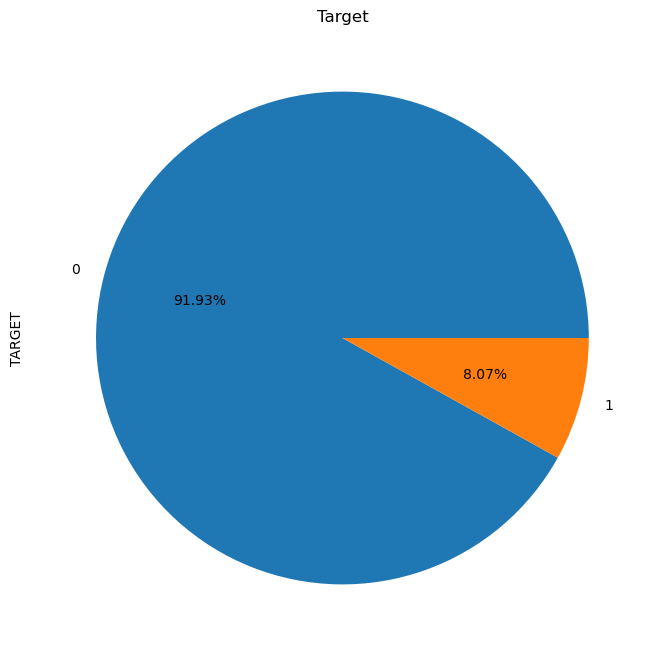

In [6]:
#Diagramme circulaire des targets
df_target_train = data_application_train['TARGET'].value_counts()
ax=df_target_train.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("Target")

##### La variable NAME_CONTRACT_TYPE

Identification si le prêt est cash ou revolving

Text(0.5, 1.0, 'NAME_CONTRACT_TYPE')

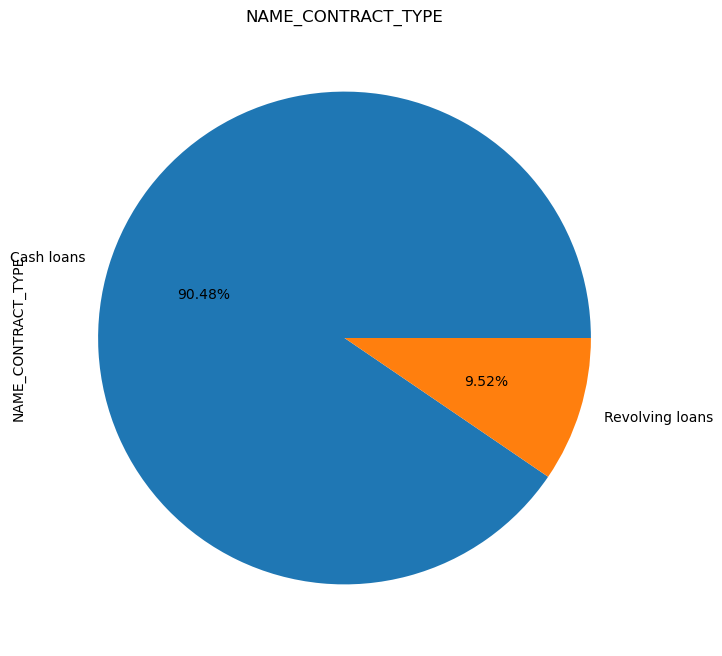

In [7]:
#Diagramme circulaire des  NAME_CONTRACT_TYPE
df_NAME_CONTRACT_TYPE_train = data_application_train['NAME_CONTRACT_TYPE'].value_counts()
ax=df_NAME_CONTRACT_TYPE_train.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("NAME_CONTRACT_TYPE")

#####  La variable CODE_GENDER
Sexe du client

Text(0.5, 1.0, 'CODE_GENDER')

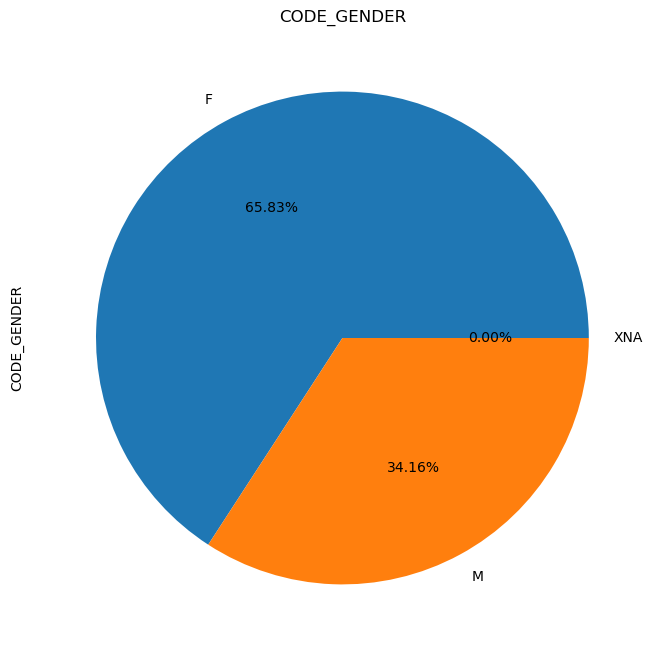

In [8]:
#Diagramme circulaire des  CODE_GENDER
df_CODE_GENDER_train = data_application_train['CODE_GENDER'].value_counts()
ax=df_CODE_GENDER_train.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("CODE_GENDER")

##### La variable  FLAG_OWN_CAR
Drapeau indiquant si le client possède une voiture

Text(0.5, 1.0, 'FLAG_OWN_CAR')

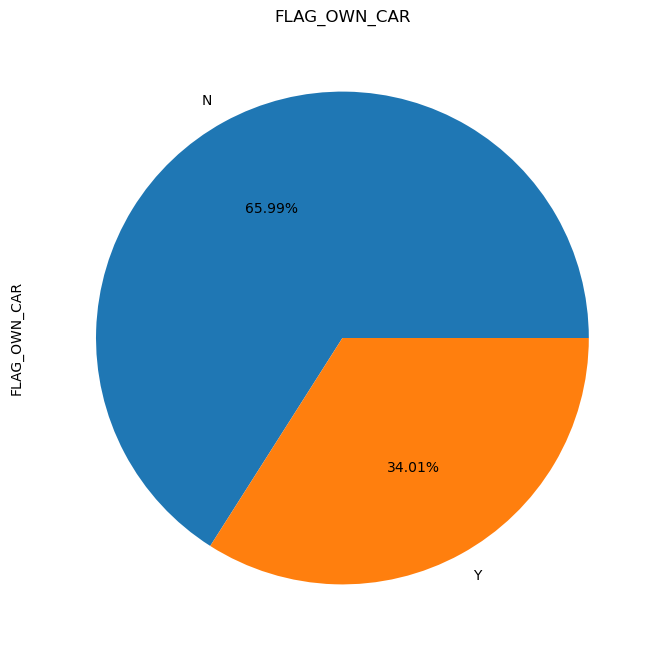

In [9]:
#Diagramme circulaire des  FLAG_OWN_CAR
df_FLAG_OWN_CAR_train = data_application_train['FLAG_OWN_CAR'].value_counts()
ax=df_FLAG_OWN_CAR_train.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("FLAG_OWN_CAR")

### application_test.csv

In [10]:
data_application_test = pd.read_csv('application_test.csv', sep=',')

In [11]:
data_application_test.shape

(48744, 121)

In [12]:
data_application_test.head(10)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
5,100042,Cash loans,F,Y,Y,0,270000.0,959688.0,34600.5,810000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,2.0
6,100057,Cash loans,M,Y,Y,2,180000.0,499221.0,22117.5,373500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
7,100065,Cash loans,M,N,Y,0,166500.0,180000.0,14220.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
8,100066,Cash loans,F,N,Y,0,315000.0,364896.0,28957.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
9,100067,Cash loans,F,Y,Y,1,162000.0,45000.0,5337.0,45000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [13]:
list_colonnes_2 = data_application_test.columns.tolist()

In [14]:
list(set(list_colonnes_1) - set(list_colonnes_2))

['TARGET']

#### Analyse exploratoire

Text(0.5, 1.0, 'NAME_CONTRACT_TYPE')

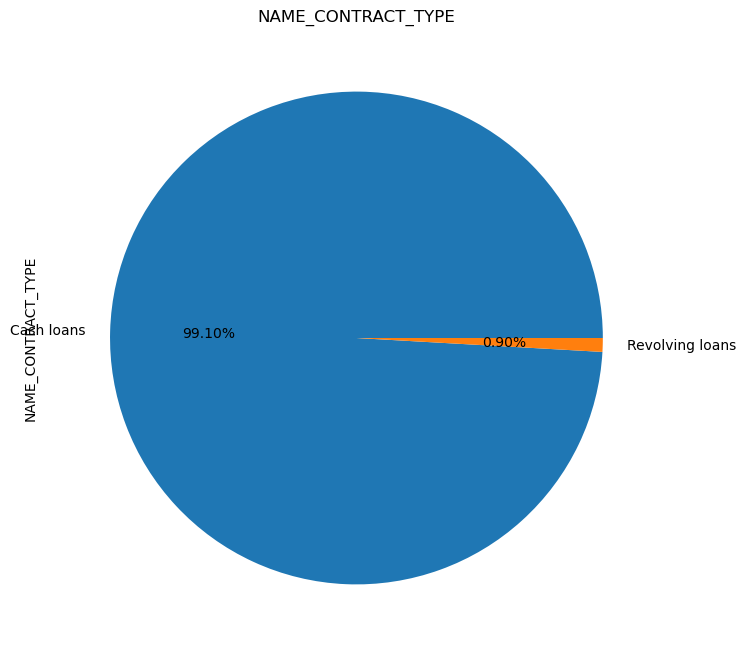

In [15]:
#Diagramme circulaire des  NAME_CONTRACT_TYPE
df_NAME_CONTRACT_TYPE_test = data_application_test['NAME_CONTRACT_TYPE'].value_counts()
ax=df_NAME_CONTRACT_TYPE_test.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("NAME_CONTRACT_TYPE")

Text(0.5, 1.0, 'CODE_GENDER')

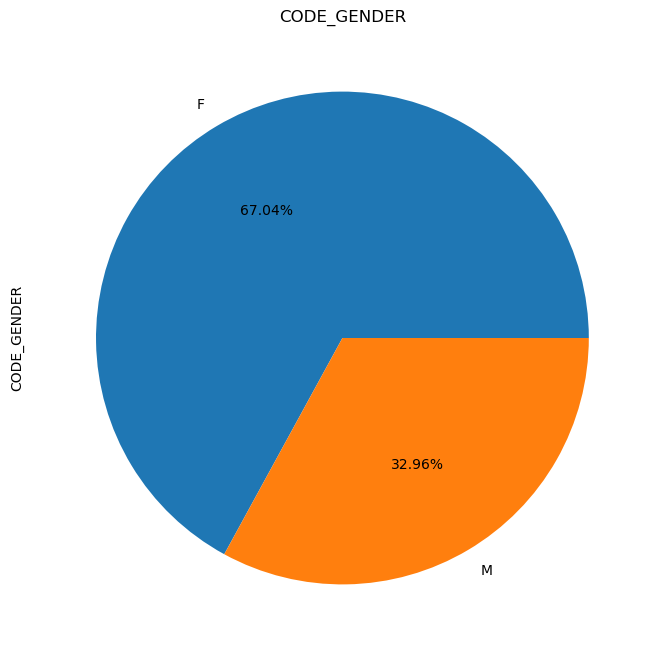

In [16]:
#Diagramme circulaire des  CODE_GENDER
df_CODE_GENDER_test = data_application_test['CODE_GENDER'].value_counts()
ax=df_CODE_GENDER_test.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("CODE_GENDER")

Text(0.5, 1.0, 'FLAG_OWN_CAR')

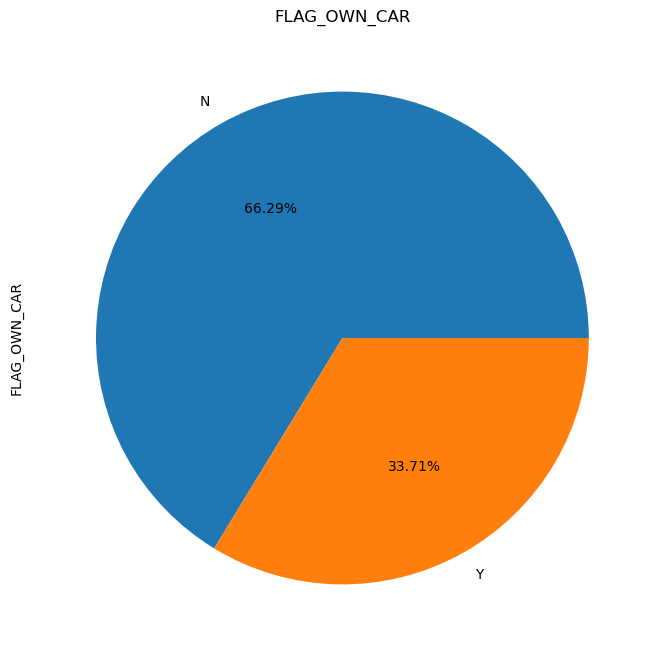

In [17]:
#Diagramme circulaire des  FLAG_OWN_CAR
df_FLAG_OWN_CAR_test = data_application_test['FLAG_OWN_CAR'].value_counts()
ax=df_FLAG_OWN_CAR_test.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("FLAG_OWN_CAR")

## bureau.csv

Tous les crédits antérieurs du client fournis par d'autres institutions financières qui ont été signalés au bureau de crédit (pour les clients qui ont un prêt dans notre échantillon).
Pour chaque prêt de notre échantillon, il y a autant de lignes que le nombre de crédits que le client avait dans le Credit Bureau avant la date de la demande.

In [18]:
data_bureau = pd.read_csv('bureau.csv', sep=',')

In [19]:
data_bureau.shape

(1716428, 17)

In [20]:
data_bureau.head()

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


### Analyse exploratoire

#### La variable CREDIT_ACTIVE
Statut des crédits déclarés au Credit Bureau (CB)

Text(0.5, 1.0, 'CREDIT_ACTIVE')

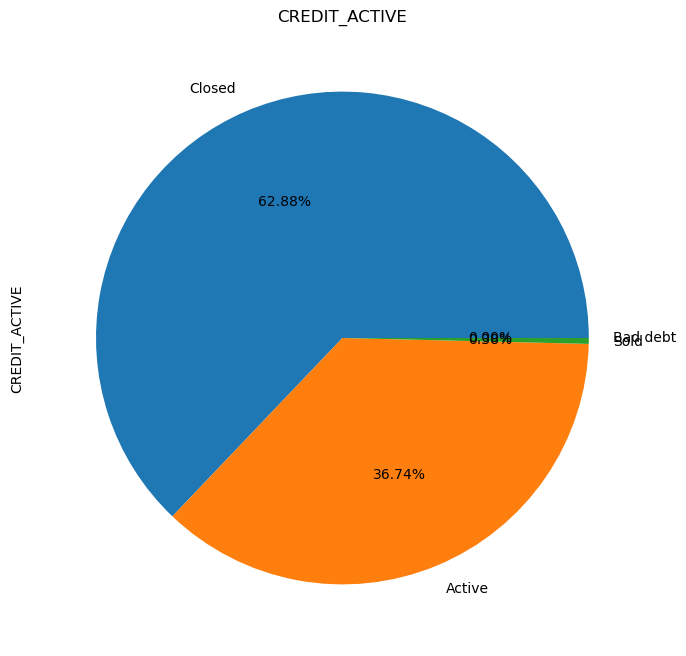

In [21]:
#Diagramme circulaire des  FLAG_OWN_CAR
df_CREDIT_ACTIVE_bureau = data_bureau['CREDIT_ACTIVE'].value_counts()
ax=df_CREDIT_ACTIVE_bureau.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("CREDIT_ACTIVE")

In [22]:
data_bureau['CREDIT_ACTIVE'].unique()

array(['Closed', 'Active', 'Sold', 'Bad debt'], dtype=object)

## bureau_balance.csv

Soldes mensuels des crédits antérieurs au bureau de crédit.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent signalé au bureau de crédit - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois où nous avons un historique observable pour les crédits précédents) lignes .

In [23]:
data_bureau_balance = pd.read_csv('bureau_balance.csv', sep=',')

In [24]:
data_bureau_balance.shape

(27299925, 3)

In [25]:
data_bureau_balance.head(10)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C
5,5715448,-5,C
6,5715448,-6,C
7,5715448,-7,C
8,5715448,-8,C
9,5715448,-9,0


## POS_CASH_balance.csv

Instantanés mensuels du solde des points de vente précédents et des prêts en espèces que le demandeur avait contractés avec Prêt à dépenser.
Ce tableau a une ligne pour chaque mois d'historique de chaque crédit précédent dans Prêt à dépenser (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de crédits précédents relatifs * # de mois dans lequel nous avons un historique observable pour les lignes des crédits précédents).

In [26]:
data_POS_CASH_balance = pd.read_csv('POS_CASH_balance.csv', sep=',')

In [27]:
data_POS_CASH_balance.shape

(10001358, 8)

In [28]:
data_POS_CASH_balance.head(10)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
5,2207092,342166,-32,12.0,12.0,Active,0,0
6,1110516,204376,-38,48.0,43.0,Active,0,0
7,1387235,153211,-35,36.0,36.0,Active,0,0
8,1220500,112740,-31,12.0,12.0,Active,0,0
9,2371489,274851,-32,24.0,16.0,Active,0,0


## credit_card_balance.csv

Aperçus mensuels du solde des cartes de crédit précédentes que le demandeur a avec Prêt à dépenser.
Ce tableau comporte une ligne pour chaque mois d'historique de chaque crédit précédent dans Prêt à dépenser (crédit à la consommation et prêts de trésorerie) lié aux prêts de notre échantillon - c'est-à-dire que le tableau a (#prêts dans l'échantillon * # de cartes de crédit précédentes relatives * # de mois où nous avons un historique observable pour la carte de crédit précédente) lignes.

In [29]:
data_credit_card_balance = pd.read_csv('credit_card_balance.csv', sep=',')

In [30]:
data_credit_card_balance.shape

(3840312, 23)

In [31]:
data_credit_card_balance.head()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


## previous_application.csv

Toutes les demandes précédentes de prêts immobiliers des clients qui ont des prêts dans notre échantillon.
Il y a une ligne pour chaque demande précédente liée aux prêts dans notre échantillon de données.

In [32]:
data_previous_application = pd.read_csv('previous_application.csv', sep=',')

In [33]:
data_previous_application.shape

(1670214, 37)

In [34]:
data_previous_application.head(10)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,...,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,...,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


## installments_payments.csv

Historique de remboursement des crédits précédemment décaissés en Prêt à dépenser liés aux prêts de notre échantillon.
Il y a a) une ligne pour chaque paiement effectué plus b) une ligne pour chaque paiement manqué.
Une ligne équivaut à un versement d'une échéance OU une échéance correspondant à un versement d'un précédent crédit immobilier lié aux prêts de notre échantillon.

In [35]:
data_installments_payments = pd.read_csv('installments_payments.csv', sep=',')

In [36]:
data_installments_payments.shape

(13605401, 8)

In [37]:
data_installments_payments.head(10)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
5,1137312,164489,1.0,12,-1384.0,-1417.0,5970.375,5970.375
6,2234264,184693,4.0,11,-349.0,-352.0,29432.295,29432.295
7,1818599,111420,2.0,4,-968.0,-994.0,17862.165,17862.165
8,2723183,112102,0.0,14,-197.0,-197.0,70.740,70.740
9,1413990,109741,1.0,4,-570.0,-609.0,14308.470,14308.470


## HomeCredit_columns_description.csv

In [38]:
data_HomeCredit_columns_description = pd.read_csv('HomeCredit_columns_description.csv', sep=',', encoding='latin1')

In [39]:
data_HomeCredit_columns_description.head()

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN


## sample_submission

In [40]:
data_sample_submission = pd.read_csv('sample_submission.csv', sep=',')

In [41]:
data_sample_submission.shape

(48744, 2)

In [42]:
data_sample_submission.head(10)

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5
2,100013,0.5
3,100028,0.5
4,100038,0.5
5,100042,0.5
6,100057,0.5
7,100065,0.5
8,100066,0.5
9,100067,0.5


# Feature Engineering

1.  La plupart des fonctionnalités sont créées en appliquant les fonctions min, max, moyenne, somme et var à des tables groupées.
2.  Peu de fonctionnalités sont sélectionnées et le surajustement peut être un problème car de nombreuses fonctionnalités sont liées.
3.  Les idées clés suivantes ont été utilisées :
    Diviser ou soustraire des caractéristiques importantes pour obtenir des taux (comme la rente et le revenu)
4.  Dans Bureau Data : créer des fonctionnalités spécifiques pour les crédits actifs et les crédits fermés
5.  Dans les candidatures précédentes : créer des fonctionnalités spécifiques pour les candidatures approuvées et refusées
6.  Modularité : une fonction pour chaque table (sauf bureau_balance et application_test)
7. Encodage à chaud pour les fonctionnalités catégorielles
8. Toutes les tables sont jointes au DF de l'application à l'aide de la clé SK_ID_CURR (sauf bureau_balance). 
Vous pouvez utiliser LightGBM avec KFold ou Stratified KFold.

[Source : Kaggle]

In [43]:
import gc
import time
from contextlib import contextmanager
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import KFold, StratifiedKFold
#import matplotlib.pyplot as plt
#import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [44]:
@contextmanager
def timer(title):
    t0 = time.time()
    yield # comme la fonction return mais pour un générateur
    print("{} - done in {:.0f}s".format(title, time.time() - t0))

In [45]:
# One-hot encoding for categorical columns with get_dummies
def one_hot_encoder(df, nan_as_category = True):
    original_columns = list(df.columns)
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
    df = pd.get_dummies(df, columns= categorical_columns, dummy_na= nan_as_category)
    new_columns = [c for c in df.columns if c not in original_columns]
    return df, new_columns


In [46]:
# Preprocess application_train.csv and application_test.csv
def application_train_test(num_rows = None, nan_as_category = False):
    # Read data and merge
    df = pd.read_csv('application_train.csv', nrows= num_rows)
    test_df = pd.read_csv('application_test.csv', nrows= num_rows)
    print("Train samples: {}, test samples: {}".format(len(df), len(test_df)))
    df = df.append(test_df).reset_index()
    # Optional: Remove 4 applications with XNA CODE_GENDER (train set)
    df = df[df['CODE_GENDER'] != 'XNA']# CODE_GENDER : code sexes des clients. 
    
    # Categorical features with Binary encode (0 or 1; two categories)
    for bin_feature in ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY']:
        
        #FLAG_OWN_CAR,Drapeau indiquant si le client possède une voiture
        #FLAG_OWN_REALTY,Drapeau si le client possède une maison ou un appartement
        
        df[bin_feature], uniques = pd.factorize(df[bin_feature]) # Encodez l'objet sous la forme d'un type énuméré ou d'une variable catégorielle.
        
    # Categorical features with One-Hot encode
    df, cat_cols = one_hot_encoder(df, nan_as_category)
    
    # NaN values for DAYS_EMPLOYED: 365.243 -> nan
    df['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
    df['DAYS_EMPLOYED_PERC'] = df['DAYS_EMPLOYED'] / df['DAYS_BIRTH']
    df['INCOME_CREDIT_PERC'] = df['AMT_INCOME_TOTAL'] / df['AMT_CREDIT']# AMT_INCOME_TOTAL: Revenu du client/AMT_CREDIT: Montant du crédit de l'emprunt
    df['INCOME_PER_PERSON'] = df['AMT_INCOME_TOTAL'] / df['CNT_FAM_MEMBERS']# CNT_FAM_MEMBERS,Combien de membres de la famille a le client
    df['ANNUITY_INCOME_PERC'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL'] #,AMT_ANNUITY:Annuité du prêt/AMT_INCOME_TOTAL: Revenu du client
    df['PAYMENT_RATE'] = df['AMT_ANNUITY'] / df['AMT_CREDIT']
    del test_df
    gc.collect()
    return df

In [47]:
# Preprocess bureau.csv and bureau_balance.csv
def bureau_and_balance(num_rows = None, nan_as_category = True):
    bureau = pd.read_csv('bureau.csv', nrows = num_rows)
    bb = pd.read_csv('bureau_balance.csv', nrows = num_rows)
    bb, bb_cat = one_hot_encoder(bb, nan_as_category)
    bureau, bureau_cat = one_hot_encoder(bureau, nan_as_category)
    
    # Bureau balance: Perform aggregations and merge with bureau.csv
    bb_aggregations = {'MONTHS_BALANCE': ['min', 'max', 'size']}# MONTHS_BALANCE:Mois du solde par rapport à la date de la demande (-1 signifie la date de solde la plus récente), heure uniquement par rapport à la demande.

    for col in bb_cat:
        bb_aggregations[col] = ['mean']
    bb_agg = bb.groupby('SK_ID_BUREAU').agg(bb_aggregations)# SK_BUREAU_ID,ID recodé du crédit précédent du Credit Bureau lié à notre prêt (codage unique pour chaque demande de prêt),
    bb_agg.columns = pd.Index([e[0] + "_" + e[1].upper() for e in bb_agg.columns.tolist()])
    bureau = bureau.join(bb_agg, how='left', on='SK_ID_BUREAU')
    bureau.drop(['SK_ID_BUREAU'], axis=1, inplace= True)
    del bb, bb_agg
    gc.collect()
    
    # Bureau and bureau_balance numeric features
    num_aggregations = {
        'DAYS_CREDIT': ['min', 'max', 'mean', 'var'],# DAYS_CREDIT : Combien de jours avant la demande actuelle le client a-t-il fait une demande de crédit auprès du Credit Bureau ?
        'DAYS_CREDIT_ENDDATE': ['min', 'max', 'mean'],# DAYS_CREDIT_ENDDATE : Durée restante du crédit CB (en jours) au moment de la demande dans Prêt à dépenser, temps seulement par rapport à la demande
        'DAYS_CREDIT_UPDATE': ['mean'],# DAYS_CREDIT_UPDATE : Combien de jours avant la demande de prêt la dernière information sur le crédit du Credit Bureau est-elle parvenue, temps relatif à lademande uniquement.
        'CREDIT_DAY_OVERDUE': ['max', 'mean'],# CREDIT_DAY_OVERDUE : Nombre de jours de retard sur le crédit CB au moment de la demande de prêt liée à notre échantillon,
        'AMT_CREDIT_MAX_OVERDUE': ['mean'],# AMT_CREDIT_MAX_OVERDUE,Montant maximal en retard sur le crédit CB jusqu'à présent (à la date de demande du prêt dans notre échantillon)
        'AMT_CREDIT_SUM': ['max', 'mean', 'sum'],#AMT_CREDIT_SUM: Montant actuel du crédit du Credit Bureau
        'AMT_CREDIT_SUM_DEBT': ['max', 'mean', 'sum'],# AMT_CREDIT_SUM_DEBT : Dette actuelle du crédit Credit Bureau,
        'AMT_CREDIT_SUM_OVERDUE': ['mean'],# AMT_CREDIT_MAX_OVERDUE: Montant maximal en retard sur le crédit CB jusqu'à présent (à la date de demande du prêt dans notre échantillon),
        'AMT_CREDIT_SUM_LIMIT': ['mean', 'sum'],# v,AMT_CREDIT_SUM_LIMIT,Limite de crédit actuelle de la carte de crédit déclarée dans Credit Bureau
        'AMT_ANNUITY': ['max', 'mean'],# AMT_ANNUITY,Annuité du crédit du Credit Bureau
        'CNT_CREDIT_PROLONG': ['sum'],#CNT_CREDIT_PROLONG,Combien de fois le crédit Credit Bureau a-t-il été prolongé ?
        'MONTHS_BALANCE_MIN': ['min'],# v,MONTHS_BALANCE,Mois du solde par rapport à la date de la demande (-1 signifie la date de solde la plus récente), heure uniquement par rapport à lademande
        'MONTHS_BALANCE_MAX': ['max'],
        'MONTHS_BALANCE_SIZE': ['mean', 'sum']
    }
    # Bureau and bureau_balance categorical features
    cat_aggregations = {}
    for cat in bureau_cat: cat_aggregations[cat] = ['mean']
    for cat in bb_cat: cat_aggregations[cat + "_MEAN"] = ['mean']
    
    bureau_agg = bureau.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})# SK_ID_CURR : ID du prêt dans notre échantillon
    bureau_agg.columns = pd.Index(['BURO_' + e[0] + "_" + e[1].upper() for e in bureau_agg.columns.tolist()])
    # Bureau: Active credits - using only numerical aggregations
    active = bureau[bureau['CREDIT_ACTIVE_Active'] == 1]#CREDIT_ACTIVE: Statut des crédits déclarés au Credit Bureau (CB)
    active_agg = active.groupby('SK_ID_CURR').agg(num_aggregations)
    active_agg.columns = pd.Index(['ACTIVE_' + e[0] + "_" + e[1].upper() for e in active_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(active_agg, how='left', on='SK_ID_CURR')
    del active, active_agg
    gc.collect()
    # Bureau: Closed credits - using only numerical aggregations
    closed = bureau[bureau['CREDIT_ACTIVE_Closed'] == 1]
    closed_agg = closed.groupby('SK_ID_CURR').agg(num_aggregations)
    closed_agg.columns = pd.Index(['CLOSED_' + e[0] + "_" + e[1].upper() for e in closed_agg.columns.tolist()])
    bureau_agg = bureau_agg.join(closed_agg, how='left', on='SK_ID_CURR')
    del closed, closed_agg, bureau
    gc.collect()
    return bureau_agg

In [48]:
# Preprocess previous_applications.csv
def previous_applications(num_rows = None, nan_as_category = True):
    prev = pd.read_csv('previous_application.csv', nrows = num_rows)
    prev, cat_cols = one_hot_encoder(prev, nan_as_category= True)
    # Days 365.243 values -> nan
    prev['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
    prev['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
    prev['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
    prev['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)
    # Add feature: value ask / value received percentage
    prev['APP_CREDIT_PERC'] = prev['AMT_APPLICATION'] / prev['AMT_CREDIT']
    # Previous applications numeric features
    num_aggregations = {
        'AMT_ANNUITY': ['min', 'max', 'mean'],
        'AMT_APPLICATION': ['min', 'max', 'mean'],
        'AMT_CREDIT': ['min', 'max', 'mean'],
        'APP_CREDIT_PERC': ['min', 'max', 'mean', 'var'],
        'AMT_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'AMT_GOODS_PRICE': ['min', 'max', 'mean'],
        'HOUR_APPR_PROCESS_START': ['min', 'max', 'mean'],
        'RATE_DOWN_PAYMENT': ['min', 'max', 'mean'],
        'DAYS_DECISION': ['min', 'max', 'mean'],
        'CNT_PAYMENT': ['mean', 'sum'],
    }
    # Previous applications categorical features
    cat_aggregations = {}
    for cat in cat_cols:
        cat_aggregations[cat] = ['mean']
    
    prev_agg = prev.groupby('SK_ID_CURR').agg({**num_aggregations, **cat_aggregations})
    prev_agg.columns = pd.Index(['PREV_' + e[0] + "_" + e[1].upper() for e in prev_agg.columns.tolist()])
    # Previous Applications: Approved Applications - only numerical features
    approved = prev[prev['NAME_CONTRACT_STATUS_Approved'] == 1]
    approved_agg = approved.groupby('SK_ID_CURR').agg(num_aggregations)
    approved_agg.columns = pd.Index(['APPROVED_' + e[0] + "_" + e[1].upper() for e in approved_agg.columns.tolist()])
    prev_agg = prev_agg.join(approved_agg, how='left', on='SK_ID_CURR')
    # Previous Applications: Refused Applications - only numerical features
    refused = prev[prev['NAME_CONTRACT_STATUS_Refused'] == 1]
    refused_agg = refused.groupby('SK_ID_CURR').agg(num_aggregations)
    refused_agg.columns = pd.Index(['REFUSED_' + e[0] + "_" + e[1].upper() for e in refused_agg.columns.tolist()])
    prev_agg = prev_agg.join(refused_agg, how='left', on='SK_ID_CURR')
    del refused, refused_agg, approved, approved_agg, prev
    gc.collect()
    return prev_agg

In [49]:
# Preprocess POS_CASH_balance.csv
def pos_cash(num_rows = None, nan_as_category = True):
    pos = pd.read_csv('POS_CASH_balance.csv', nrows = num_rows)
    pos, cat_cols = one_hot_encoder(pos, nan_as_category= True)
    # Features
    aggregations = {
        'MONTHS_BALANCE': ['max', 'mean', 'size'],
        'SK_DPD': ['max', 'mean'],
        'SK_DPD_DEF': ['max', 'mean']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    
    pos_agg = pos.groupby('SK_ID_CURR').agg(aggregations)
    pos_agg.columns = pd.Index(['POS_' + e[0] + "_" + e[1].upper() for e in pos_agg.columns.tolist()])
    # Count pos cash accounts
    pos_agg['POS_COUNT'] = pos.groupby('SK_ID_CURR').size()
    del pos
    gc.collect()
    return pos_agg

In [50]:
# Preprocess installments_payments.csv
def installments_payments(num_rows = None, nan_as_category = True):
    ins = pd.read_csv('installments_payments.csv', nrows = num_rows)
    ins, cat_cols = one_hot_encoder(ins, nan_as_category= True)
    # Percentage and difference paid in each installment (amount paid and installment value)
    ins['PAYMENT_PERC'] = ins['AMT_PAYMENT'] / ins['AMT_INSTALMENT']
    ins['PAYMENT_DIFF'] = ins['AMT_INSTALMENT'] - ins['AMT_PAYMENT']
    # Days past due and days before due (no negative values)
    ins['DPD'] = ins['DAYS_ENTRY_PAYMENT'] - ins['DAYS_INSTALMENT']
    ins['DBD'] = ins['DAYS_INSTALMENT'] - ins['DAYS_ENTRY_PAYMENT']
    ins['DPD'] = ins['DPD'].apply(lambda x: x if x > 0 else 0)
    ins['DBD'] = ins['DBD'].apply(lambda x: x if x > 0 else 0)
    # Features: Perform aggregations
    aggregations = {
        'NUM_INSTALMENT_VERSION': ['nunique'],
        'DPD': ['max', 'mean', 'sum'],
        'DBD': ['max', 'mean', 'sum'],
        'PAYMENT_PERC': ['max', 'mean', 'sum', 'var'],
        'PAYMENT_DIFF': ['max', 'mean', 'sum', 'var'],
        'AMT_INSTALMENT': ['max', 'mean', 'sum'],
        'AMT_PAYMENT': ['min', 'max', 'mean', 'sum'],
        'DAYS_ENTRY_PAYMENT': ['max', 'mean', 'sum']
    }
    for cat in cat_cols:
        aggregations[cat] = ['mean']
    ins_agg = ins.groupby('SK_ID_CURR').agg(aggregations)
    ins_agg.columns = pd.Index(['INSTAL_' + e[0] + "_" + e[1].upper() for e in ins_agg.columns.tolist()])
    # Count installments accounts
    ins_agg['INSTAL_COUNT'] = ins.groupby('SK_ID_CURR').size()
    del ins
    gc.collect()
    return ins_agg

In [51]:
# Preprocess credit_card_balance.csv
def credit_card_balance(num_rows = None, nan_as_category = True):
    cc = pd.read_csv('credit_card_balance.csv', nrows = num_rows)
    cc, cat_cols = one_hot_encoder(cc, nan_as_category= True)
    # General aggregations
    cc.drop(['SK_ID_PREV'], axis= 1, inplace = True)
    cc_agg = cc.groupby('SK_ID_CURR').agg(['min', 'max', 'mean', 'sum', 'var'])
    cc_agg.columns = pd.Index(['CC_' + e[0] + "_" + e[1].upper() for e in cc_agg.columns.tolist()])
    # Count credit card lines
    cc_agg['CC_COUNT'] = cc.groupby('SK_ID_CURR').size()
    del cc
    gc.collect()
    return cc_agg

In [52]:
# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm(df, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        #test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    display_importances(feature_importance_df)
    return feature_importance_df

In [53]:
# Display/plot feature importance
def display_importances(feature_importance_df_):
    cols = feature_importance_df_[["feature", "importance"]].groupby("feature").mean().sort_values(by="importance", ascending=False)[:40].index
    best_features = feature_importance_df_.loc[feature_importance_df_.feature.isin(cols)]
    plt.figure(figsize=(8, 10))
    sns.barplot(x="importance", y="feature", data=best_features.sort_values(by="importance", ascending=False))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.savefig('lgbm_importances01.png')

In [54]:
def main(debug = False):
    num_rows = 10000 if debug else None
    df = application_train_test(num_rows)
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()
    with timer("Run LightGBM with kfold"):
        df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
        feat_importance = kfold_lightgbm(df, num_folds= 10, stratified= False, debug= debug)


In [55]:
def main_2(debug = False):
    num_rows = 10000 if debug else None
    df = application_train_test(num_rows)
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()
        
    return   df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [56]:
def data_constructor(debug = False):
    num_rows = 10000 if debug else None
    df = application_train_test(num_rows)
    with timer("Process bureau and bureau_balance"):
        bureau = bureau_and_balance(num_rows)
        print("Bureau df shape:", bureau.shape)
        df = df.join(bureau, how='left', on='SK_ID_CURR')
        del bureau
        gc.collect()
    with timer("Process previous_applications"):
        prev = previous_applications(num_rows)
        print("Previous applications df shape:", prev.shape)
        df = df.join(prev, how='left', on='SK_ID_CURR')
        del prev
        gc.collect()
    with timer("Process POS-CASH balance"):
        pos = pos_cash(num_rows)
        print("Pos-cash balance df shape:", pos.shape)
        df = df.join(pos, how='left', on='SK_ID_CURR')
        del pos
        gc.collect()
    with timer("Process installments payments"):
        ins = installments_payments(num_rows)
        print("Installments payments df shape:", ins.shape)
        df = df.join(ins, how='left', on='SK_ID_CURR')
        del ins
        gc.collect()
    with timer("Process credit card balance"):
        cc = credit_card_balance(num_rows)
        print("Credit card balance df shape:", cc.shape)
        df = df.join(cc, how='left', on='SK_ID_CURR')
        del cc
        gc.collect()
    return df
    

In [57]:
df_LightGBM = main_2()

Train samples: 307511, test samples: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 28s
Previous applications df shape: (338857, 249)
Process previous_applications - done in 36s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 19s
Installments payments df shape: (339587, 26)
Process installments payments - done in 36s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 32s


In [58]:
df_LightGBM.shape

(356251, 798)

In [59]:
df_LightGBM.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Starting LightGBM. Train shape: (307507, 798), test shape: (48744, 798)


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797104	training's binary_logloss: 0.234829	valid_1's auc: 0.776089	valid_1's binary_logloss: 0.246759
[400]	training's auc: 0.819226	training's binary_logloss: 0.22537	valid_1's auc: 0.787159	valid_1's binary_logloss: 0.242511
[600]	training's auc: 0.834155	training's binary_logloss: 0.219277	valid_1's auc: 0.790742	valid_1's binary_logloss: 0.241208
[800]	training's auc: 0.846219	training's binary_logloss: 0.214311	valid_1's auc: 0.792638	valid_1's binary_logloss: 0.240572
[1000]	training's auc: 0.856646	training's binary_logloss: 0.20991	valid_1's auc: 0.793314	valid_1's binary_logloss: 0.240345
[1200]	training's auc: 0.866329	training's binary_logloss: 0.205763	valid_1's auc: 0.794016	valid_1's binary_logloss: 0.240111
[1400]	training's auc: 0.875268	training's binary_logloss: 0.2017	valid_1's auc: 0.794374	valid_1's binary_logloss: 0.240002
[1600]

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796504	training's binary_logloss: 0.235573	valid_1's auc: 0.777058	valid_1's binary_logloss: 0.241702
[400]	training's auc: 0.819063	training's binary_logloss: 0.226043	valid_1's auc: 0.786754	valid_1's binary_logloss: 0.237454
[600]	training's auc: 0.833962	training's binary_logloss: 0.21997	valid_1's auc: 0.788941	valid_1's binary_logloss: 0.236447
[800]	training's auc: 0.846139	training's binary_logloss: 0.214955	valid_1's auc: 0.790289	valid_1's binary_logloss: 0.235906
[1000]	training's auc: 0.856195	training's binary_logloss: 0.210675	valid_1's auc: 0.790743	valid_1's binary_logloss: 0.235667
[1200]	training's auc: 0.865472	training's binary_logloss: 0.206638	valid_1's auc: 0.79094	valid_1's binary_logloss: 0.23555
[1400]	training's auc: 0.874355	training's binary_logloss: 0.202693	valid_1's auc: 0.791202	valid_1's binary_logloss: 0.235424
[1600

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797097	training's binary_logloss: 0.235026	valid_1's auc: 0.76787	valid_1's binary_logloss: 0.246536
[400]	training's auc: 0.819952	training's binary_logloss: 0.225433	valid_1's auc: 0.778311	valid_1's binary_logloss: 0.242546
[600]	training's auc: 0.834998	training's binary_logloss: 0.219239	valid_1's auc: 0.781675	valid_1's binary_logloss: 0.241422
[800]	training's auc: 0.8474	training's binary_logloss: 0.214093	valid_1's auc: 0.783594	valid_1's binary_logloss: 0.240809
[1000]	training's auc: 0.857595	training's binary_logloss: 0.209775	valid_1's auc: 0.784536	valid_1's binary_logloss: 0.240494
[1200]	training's auc: 0.866985	training's binary_logloss: 0.205683	valid_1's auc: 0.785113	valid_1's binary_logloss: 0.240377
[1400]	training's auc: 0.875537	training's binary_logloss: 0.201832	valid_1's auc: 0.785241	valid_1's binary_logloss: 0.240407
Fold 

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796781	training's binary_logloss: 0.23554	valid_1's auc: 0.778094	valid_1's binary_logloss: 0.241263
[400]	training's auc: 0.81928	training's binary_logloss: 0.225978	valid_1's auc: 0.788498	valid_1's binary_logloss: 0.236955
[600]	training's auc: 0.834386	training's binary_logloss: 0.219837	valid_1's auc: 0.792236	valid_1's binary_logloss: 0.235482
[800]	training's auc: 0.846366	training's binary_logloss: 0.214924	valid_1's auc: 0.793725	valid_1's binary_logloss: 0.23491
[1000]	training's auc: 0.857037	training's binary_logloss: 0.210442	valid_1's auc: 0.794901	valid_1's binary_logloss: 0.234455
[1200]	training's auc: 0.8665	training's binary_logloss: 0.206311	valid_1's auc: 0.795161	valid_1's binary_logloss: 0.234325
[1400]	training's auc: 0.875286	training's binary_logloss: 0.202334	valid_1's auc: 0.795642	valid_1's binary_logloss: 0.234145
[1600]	

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796443	training's binary_logloss: 0.236317	valid_1's auc: 0.78032	valid_1's binary_logloss: 0.234124
[400]	training's auc: 0.819068	training's binary_logloss: 0.226741	valid_1's auc: 0.790482	valid_1's binary_logloss: 0.229854
[600]	training's auc: 0.833992	training's binary_logloss: 0.220619	valid_1's auc: 0.793639	valid_1's binary_logloss: 0.228569
[800]	training's auc: 0.846192	training's binary_logloss: 0.215603	valid_1's auc: 0.795317	valid_1's binary_logloss: 0.227936
[1000]	training's auc: 0.856531	training's binary_logloss: 0.211213	valid_1's auc: 0.796348	valid_1's binary_logloss: 0.22756
[1200]	training's auc: 0.866038	training's binary_logloss: 0.207091	valid_1's auc: 0.797078	valid_1's binary_logloss: 0.227334
[1400]	training's auc: 0.874456	training's binary_logloss: 0.203282	valid_1's auc: 0.797234	valid_1's binary_logloss: 0.227263
[160

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797404	training's binary_logloss: 0.235337	valid_1's auc: 0.76717	valid_1's binary_logloss: 0.243343
[400]	training's auc: 0.820012	training's binary_logloss: 0.225758	valid_1's auc: 0.778167	valid_1's binary_logloss: 0.239452
[600]	training's auc: 0.835049	training's binary_logloss: 0.219617	valid_1's auc: 0.782224	valid_1's binary_logloss: 0.238116
[800]	training's auc: 0.847157	training's binary_logloss: 0.214639	valid_1's auc: 0.783885	valid_1's binary_logloss: 0.237496
[1000]	training's auc: 0.857708	training's binary_logloss: 0.210211	valid_1's auc: 0.784889	valid_1's binary_logloss: 0.237139
[1200]	training's auc: 0.867254	training's binary_logloss: 0.205959	valid_1's auc: 0.785179	valid_1's binary_logloss: 0.236995
[1400]	training's auc: 0.876057	training's binary_logloss: 0.201915	valid_1's auc: 0.785234	valid_1's binary_logloss: 0.236983
Fol

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797268	training's binary_logloss: 0.235527	valid_1's auc: 0.774539	valid_1's binary_logloss: 0.240657
[400]	training's auc: 0.819627	training's binary_logloss: 0.225979	valid_1's auc: 0.784495	valid_1's binary_logloss: 0.236476
[600]	training's auc: 0.83472	training's binary_logloss: 0.219851	valid_1's auc: 0.787703	valid_1's binary_logloss: 0.235247
[800]	training's auc: 0.847018	training's binary_logloss: 0.21483	valid_1's auc: 0.78932	valid_1's binary_logloss: 0.234726
[1000]	training's auc: 0.85732	training's binary_logloss: 0.210487	valid_1's auc: 0.78994	valid_1's binary_logloss: 0.234503
[1200]	training's auc: 0.866926	training's binary_logloss: 0.206324	valid_1's auc: 0.790406	valid_1's binary_logloss: 0.234408
[1400]	training's auc: 0.875563	training's binary_logloss: 0.20244	valid_1's auc: 0.790384	valid_1's binary_logloss: 0.234439
Fold  7 

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.797384	training's binary_logloss: 0.235077	valid_1's auc: 0.770478	valid_1's binary_logloss: 0.245343
[400]	training's auc: 0.819664	training's binary_logloss: 0.225542	valid_1's auc: 0.781776	valid_1's binary_logloss: 0.240982
[600]	training's auc: 0.834599	training's binary_logloss: 0.219451	valid_1's auc: 0.785968	valid_1's binary_logloss: 0.239525
[800]	training's auc: 0.846348	training's binary_logloss: 0.214629	valid_1's auc: 0.787951	valid_1's binary_logloss: 0.238904
[1000]	training's auc: 0.856847	training's binary_logloss: 0.210207	valid_1's auc: 0.788733	valid_1's binary_logloss: 0.238634
[1200]	training's auc: 0.866335	training's binary_logloss: 0.206035	valid_1's auc: 0.789318	valid_1's binary_logloss: 0.238496
[1400]	training's auc: 0.875156	training's binary_logloss: 0.202086	valid_1's auc: 0.789737	valid_1's binary_logloss: 0.238361
[1

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796262	training's binary_logloss: 0.235491	valid_1's auc: 0.780614	valid_1's binary_logloss: 0.242519
[400]	training's auc: 0.819304	training's binary_logloss: 0.225829	valid_1's auc: 0.7906	valid_1's binary_logloss: 0.238067
[600]	training's auc: 0.834369	training's binary_logloss: 0.219696	valid_1's auc: 0.794411	valid_1's binary_logloss: 0.236568
[800]	training's auc: 0.846365	training's binary_logloss: 0.214734	valid_1's auc: 0.795589	valid_1's binary_logloss: 0.235997
[1000]	training's auc: 0.857347	training's binary_logloss: 0.21016	valid_1's auc: 0.795693	valid_1's binary_logloss: 0.235837
[1200]	training's auc: 0.866959	training's binary_logloss: 0.20599	valid_1's auc: 0.796198	valid_1's binary_logloss: 0.235632
[1400]	training's auc: 0.876094	training's binary_logloss: 0.201939	valid_1's auc: 0.796356	valid_1's binary_logloss: 0.235572
[1600]

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.796896	training's binary_logloss: 0.235586	valid_1's auc: 0.771623	valid_1's binary_logloss: 0.240838
[400]	training's auc: 0.819574	training's binary_logloss: 0.226061	valid_1's auc: 0.782718	valid_1's binary_logloss: 0.236567
[600]	training's auc: 0.834468	training's binary_logloss: 0.21995	valid_1's auc: 0.786322	valid_1's binary_logloss: 0.235229
[800]	training's auc: 0.846691	training's binary_logloss: 0.214993	valid_1's auc: 0.788052	valid_1's binary_logloss: 0.234624
[1000]	training's auc: 0.857452	training's binary_logloss: 0.210465	valid_1's auc: 0.789127	valid_1's binary_logloss: 0.234272
[1200]	training's auc: 0.867238	training's binary_logloss: 0.206246	valid_1's auc: 0.789493	valid_1's binary_logloss: 0.23412
[1400]	training's auc: 0.876043	training's binary_logloss: 0.202265	valid_1's auc: 0.789718	valid_1's binary_logloss: 0.23401
[1600

C:\Users\laeti\Anaconda3\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


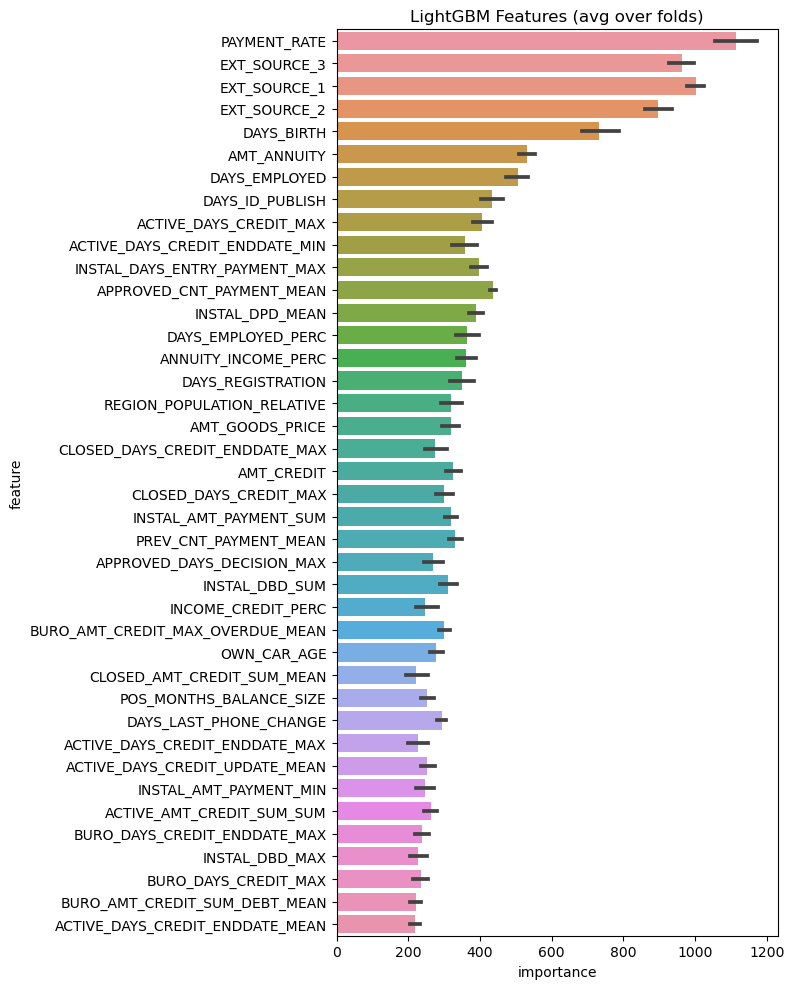

In [60]:
feat_importance = kfold_lightgbm(df_LightGBM, num_folds= 10, stratified= False, debug= False)

## Les features importances dans l'ordre décroissant

In [61]:
feat_importance.sort_values(by='importance', ascending=False, inplace = True)

On prend les 100 premières features les plus importantes

In [62]:
df_LightGBM[feat_importance.at[244,'feature']]

,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE,PAYMENT_RATE
0,0.060749,0.060749,0.060749,0.060749,0.060749,0.060749,0.060749,0.060749,0.060749,0.060749
1,0.027598,0.027598,0.027598,0.027598,0.027598,0.027598,0.027598,0.027598,0.027598,0.027598
2,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000
3,0.094941,0.094941,0.094941,0.094941,0.094941,0.094941,0.094941,0.094941,0.094941,0.094941
4,0.042623,0.042623,0.042623,0.042623,0.042623,0.042623,0.042623,0.042623,0.042623,0.042623
...,...,...,...,...,...,...,...,...,...,...
356250,0.042354,0.042354,0.042354,0.042354,0.042354,0.042354,0.042354,0.042354,0.042354,0.042354
356251,0.051267,0.051267,0.051267,0.051267,0.051267,0.051267,0.051267,0.051267,0.051267,0.051267
356252,0.105414,0.105414,0.105414,0.105414,0.105414,0.105414,0.105414,0.105414,0.105414,0.105414
356253,0.055840,0.055840,0.055840,0.055840,0.055840,0.055840,0.055840,0.055840,0.055840,0.055840


In [63]:
feat_importance['feature'][244]

244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
244    PAYMENT_RATE
Name: feature, dtype: object

In [64]:
feat_importance.iat[6,0]

'EXT_SOURCE_3'

In [65]:
feat_importance['feature'].index[0]

244

In [66]:
liste_features = feat_importance['feature'].unique()

In [67]:
cent_premiers_features = liste_features[0:100]
     

In [68]:
liste_features= np.append(cent_premiers_features, 'TARGET')

In [69]:
data_meilleurs_features = df_LightGBM[liste_features]

In [70]:
data_meilleurs_features.head()

,PAYMENT_RATE,EXT_SOURCE_3,EXT_SOURCE_1,EXT_SOURCE_2,DAYS_BIRTH,AMT_ANNUITY,DAYS_EMPLOYED,DAYS_ID_PUBLISH,ACTIVE_DAYS_CREDIT_MAX,ACTIVE_DAYS_CREDIT_ENDDATE_MIN,...,AMT_INCOME_TOTAL,PREV_NAME_TYPE_SUITE_nan_MEAN,PREV_NAME_YIELD_GROUP_high_MEAN,CODE_GENDER,ACTIVE_AMT_CREDIT_SUM_LIMIT_MEAN,INSTAL_PAYMENT_PERC_VAR,CC_CNT_DRAWINGS_ATM_CURRENT_MEAN,PREV_AMT_ANNUITY_MIN,APPROVED_APP_CREDIT_PERC_MIN,TARGET
0,0.060749,0.139376,0.083037,0.262949,-9461,24700.5,-637.0,-2120,-103.0,780.0,...,202500.0,1.000000,0.000000,0,15994.2825,0.000000,NaN,9251.775,1.000000,1.0
1,0.027598,NaN,0.311267,0.622246,-16765,35698.5,-1188.0,-291,-606.0,1216.0,...,270000.0,0.000000,0.000000,1,810000.0000,0.000000,NaN,6737.310,0.868825,0.0
2,0.050000,0.729567,NaN,0.555912,-19046,6750.0,-225.0,-2531,NaN,NaN,...,67500.0,0.000000,0.000000,0,NaN,0.000000,NaN,5357.250,1.207699,0.0
3,0.094941,NaN,NaN,0.650442,-19005,29686.5,-3039.0,-2437,NaN,NaN,...,135000.0,0.555556,0.222222,1,NaN,0.000000,NaN,2482.920,0.943934,0.0
4,0.042623,NaN,NaN,0.322738,-19932,21865.5,-3038.0,-3458,NaN,NaN,...,121500.0,0.333333,0.500000,0,NaN,0.043995,NaN,1834.290,0.791139,0.0


On entraine le modèle avec les 100 meilleurs features

In [71]:
# LightGBM GBDT with KFold or Stratified KFold
# Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
def kfold_lightgbm_2(df,feat_importance, num_folds, stratified = False, debug= False):
    # Divide in training/validation and test data
    train_df = df[df['TARGET'].notnull()]
    test_df = df[df['TARGET'].isnull()]
    print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
    del df
    gc.collect()
    # Cross validation model
    if stratified:
        folds = StratifiedKFold(n_splits= num_folds, shuffle=True, random_state=1001)
    else:
        folds = KFold(n_splits= num_folds, shuffle=True, random_state=1001)
    # Create arrays and dataframes to store results
    oof_preds = np.zeros(train_df.shape[0])
    sub_preds = np.zeros(test_df.shape[0])
    feature_importance_df = pd.DataFrame()
    feats = [f for f in train_df.columns if f not in ['TARGET','SK_ID_CURR','SK_ID_BUREAU','SK_ID_PREV','index']]
    
    for n_fold, (train_idx, valid_idx) in enumerate(folds.split(train_df[feats], train_df['TARGET'])):
        train_x, train_y = train_df[feats].iloc[train_idx], train_df['TARGET'].iloc[train_idx]
        valid_x, valid_y = train_df[feats].iloc[valid_idx], train_df['TARGET'].iloc[valid_idx]

        # LightGBM parameters found by Bayesian optimization
        clf = LGBMClassifier(
            nthread=4,
            n_estimators=10000,
            learning_rate=0.02,
            num_leaves=34,
            colsample_bytree=0.9497036,
            subsample=0.8715623,
            max_depth=8,
            reg_alpha=0.041545473,
            reg_lambda=0.0735294,
            min_split_gain=0.0222415,
            min_child_weight=39.3259775,
            silent=-1,
            verbose=-1, )

        clf.fit(train_x, train_y, eval_set=[(train_x, train_y), (valid_x, valid_y)], 
            eval_metric= 'auc', verbose= 200, early_stopping_rounds= 200)

        oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
        sub_preds += clf.predict_proba(test_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits

        '''fold_importance_df = pd.DataFrame()
        fold_importance_df["feature"] = feats
        fold_importance_df["importance"] = clf.feature_importances_
        fold_importance_df["fold"] = n_fold + 1
        feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
        print('Fold %2d AUC : %.6f' % (n_fold + 1, roc_auc_score(valid_y, oof_preds[valid_idx])))
        del clf, train_x, train_y, valid_x, valid_y
        gc.collect()'''

    print('Full AUC score %.6f' % roc_auc_score(train_df['TARGET'], oof_preds))
    # Write submission file and plot feature importance
    if not debug:
        test_df['TARGET'] = sub_preds
        #test_df[['SK_ID_CURR', 'TARGET']].to_csv(submission_file_name, index= False)
    display_importances(feat_importance)
    #return feature_importance_df

Starting LightGBM. Train shape: (307507, 101), test shape: (48744, 101)


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792585	training's binary_logloss: 0.236257	valid_1's auc: 0.773334	valid_1's binary_logloss: 0.247527
[400]	training's auc: 0.813318	training's binary_logloss: 0.227673	valid_1's auc: 0.783157	valid_1's binary_logloss: 0.24386
[600]	training's auc: 0.82793	training's binary_logloss: 0.221966	valid_1's auc: 0.78643	valid_1's binary_logloss: 0.242764
[800]	training's auc: 0.839867	training's binary_logloss: 0.217313	valid_1's auc: 0.788289	valid_1's binary_logloss: 0.24218
[1000]	training's auc: 0.850264	training's binary_logloss: 0.213121	valid_1's auc: 0.78881	valid_1's binary_logloss: 0.241943
[1200]	training's auc: 0.859297	training's binary_logloss: 0.209368	valid_1's auc: 0.789144	valid_1's binary_logloss: 0.24188
[1400]	training's auc: 0.867733	training's binary_logloss: 0.205749	valid_1's auc: 0.789386	valid_1's binary_logloss: 0.241739
[1600]	t

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792551	training's binary_logloss: 0.236836	valid_1's auc: 0.775254	valid_1's binary_logloss: 0.242329
[400]	training's auc: 0.813397	training's binary_logloss: 0.228249	valid_1's auc: 0.783714	valid_1's binary_logloss: 0.238774
[600]	training's auc: 0.827965	training's binary_logloss: 0.222602	valid_1's auc: 0.786418	valid_1's binary_logloss: 0.237718
[800]	training's auc: 0.839842	training's binary_logloss: 0.218002	valid_1's auc: 0.787763	valid_1's binary_logloss: 0.237292
[1000]	training's auc: 0.850621	training's binary_logloss: 0.213711	valid_1's auc: 0.788642	valid_1's binary_logloss: 0.237023
[1200]	training's auc: 0.860145	training's binary_logloss: 0.209805	valid_1's auc: 0.788949	valid_1's binary_logloss: 0.236914
[1400]	training's auc: 0.868752	training's binary_logloss: 0.206116	valid_1's auc: 0.788616	valid_1's binary_logloss: 0.237004


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792914	training's binary_logloss: 0.23641	valid_1's auc: 0.764605	valid_1's binary_logloss: 0.247374
[400]	training's auc: 0.813814	training's binary_logloss: 0.227813	valid_1's auc: 0.774023	valid_1's binary_logloss: 0.243892
[600]	training's auc: 0.828226	training's binary_logloss: 0.222151	valid_1's auc: 0.777183	valid_1's binary_logloss: 0.242887
[800]	training's auc: 0.840258	training's binary_logloss: 0.217453	valid_1's auc: 0.778861	valid_1's binary_logloss: 0.242431
[1000]	training's auc: 0.850631	training's binary_logloss: 0.213239	valid_1's auc: 0.780077	valid_1's binary_logloss: 0.242085
[1200]	training's auc: 0.859938	training's binary_logloss: 0.209363	valid_1's auc: 0.780576	valid_1's binary_logloss: 0.241961


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792651	training's binary_logloss: 0.236807	valid_1's auc: 0.775749	valid_1's binary_logloss: 0.242075
[400]	training's auc: 0.813524	training's binary_logloss: 0.228201	valid_1's auc: 0.784397	valid_1's binary_logloss: 0.2384
[600]	training's auc: 0.827908	training's binary_logloss: 0.222553	valid_1's auc: 0.788059	valid_1's binary_logloss: 0.236986
[800]	training's auc: 0.839961	training's binary_logloss: 0.217864	valid_1's auc: 0.78904	valid_1's binary_logloss: 0.236518
[1000]	training's auc: 0.850661	training's binary_logloss: 0.213618	valid_1's auc: 0.7898	valid_1's binary_logloss: 0.236235
[1200]	training's auc: 0.860035	training's binary_logloss: 0.209747	valid_1's auc: 0.79026	valid_1's binary_logloss: 0.236012
[1400]	training's auc: 0.868148	training's binary_logloss: 0.20627	valid_1's auc: 0.790405	valid_1's binary_logloss: 0.235918


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792029	training's binary_logloss: 0.237684	valid_1's auc: 0.777143	valid_1's binary_logloss: 0.234894
[400]	training's auc: 0.813263	training's binary_logloss: 0.229013	valid_1's auc: 0.786874	valid_1's binary_logloss: 0.230982
[600]	training's auc: 0.827774	training's binary_logloss: 0.223382	valid_1's auc: 0.790178	valid_1's binary_logloss: 0.229672
[800]	training's auc: 0.839969	training's binary_logloss: 0.218623	valid_1's auc: 0.791446	valid_1's binary_logloss: 0.229184
[1000]	training's auc: 0.850307	training's binary_logloss: 0.214401	valid_1's auc: 0.792024	valid_1's binary_logloss: 0.228955
[1200]	training's auc: 0.859726	training's binary_logloss: 0.21045	valid_1's auc: 0.79257	valid_1's binary_logloss: 0.228776
[1400]	training's auc: 0.868224	training's binary_logloss: 0.20674	valid_1's auc: 0.792722	valid_1's binary_logloss: 0.228712


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.79291	training's binary_logloss: 0.23674	valid_1's auc: 0.76662	valid_1's binary_logloss: 0.243564
[400]	training's auc: 0.813942	training's binary_logloss: 0.228117	valid_1's auc: 0.776617	valid_1's binary_logloss: 0.239889
[600]	training's auc: 0.828515	training's binary_logloss: 0.222429	valid_1's auc: 0.77997	valid_1's binary_logloss: 0.238768
[800]	training's auc: 0.840496	training's binary_logloss: 0.217704	valid_1's auc: 0.781313	valid_1's binary_logloss: 0.238209
[1000]	training's auc: 0.850816	training's binary_logloss: 0.213487	valid_1's auc: 0.781548	valid_1's binary_logloss: 0.238093
[1200]	training's auc: 0.860161	training's binary_logloss: 0.209558	valid_1's auc: 0.781791	valid_1's binary_logloss: 0.238079


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792964	training's binary_logloss: 0.236856	valid_1's auc: 0.770234	valid_1's binary_logloss: 0.241607
[400]	training's auc: 0.813726	training's binary_logloss: 0.228241	valid_1's auc: 0.779121	valid_1's binary_logloss: 0.237945
[600]	training's auc: 0.828432	training's binary_logloss: 0.222543	valid_1's auc: 0.782618	valid_1's binary_logloss: 0.236716
[800]	training's auc: 0.840411	training's binary_logloss: 0.217869	valid_1's auc: 0.783946	valid_1's binary_logloss: 0.236224
[1000]	training's auc: 0.850922	training's binary_logloss: 0.213594	valid_1's auc: 0.784602	valid_1's binary_logloss: 0.235967
[1200]	training's auc: 0.860644	training's binary_logloss: 0.209582	valid_1's auc: 0.784618	valid_1's binary_logloss: 0.235988


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.793005	training's binary_logloss: 0.236429	valid_1's auc: 0.769867	valid_1's binary_logloss: 0.245635
[400]	training's auc: 0.813545	training's binary_logloss: 0.227933	valid_1's auc: 0.779985	valid_1's binary_logloss: 0.241684
[600]	training's auc: 0.827823	training's binary_logloss: 0.222427	valid_1's auc: 0.783246	valid_1's binary_logloss: 0.240494
[800]	training's auc: 0.839811	training's binary_logloss: 0.217763	valid_1's auc: 0.784445	valid_1's binary_logloss: 0.24002
[1000]	training's auc: 0.850118	training's binary_logloss: 0.213601	valid_1's auc: 0.785437	valid_1's binary_logloss: 0.239672
[1200]	training's auc: 0.859248	training's binary_logloss: 0.209805	valid_1's auc: 0.785917	valid_1's binary_logloss: 0.239496
[1400]	training's auc: 0.868037	training's binary_logloss: 0.205993	valid_1's auc: 0.786209	valid_1's binary_logloss: 0.239478


C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.791915	training's binary_logloss: 0.23682	valid_1's auc: 0.779719	valid_1's binary_logloss: 0.242734
[400]	training's auc: 0.813285	training's binary_logloss: 0.228142	valid_1's auc: 0.788822	valid_1's binary_logloss: 0.238789
[600]	training's auc: 0.827677	training's binary_logloss: 0.222515	valid_1's auc: 0.791363	valid_1's binary_logloss: 0.237634
[800]	training's auc: 0.839548	training's binary_logloss: 0.217843	valid_1's auc: 0.792911	valid_1's binary_logloss: 0.236983
[1000]	training's auc: 0.849733	training's binary_logloss: 0.213711	valid_1's auc: 0.793176	valid_1's binary_logloss: 0.236867
[1200]	training's auc: 0.859538	training's binary_logloss: 0.209683	valid_1's auc: 0.793503	valid_1's binary_logloss: 0.236737
[1400]	training's auc: 0.868126	training's binary_logloss: 0.205985	valid_1's auc: 0.794096	valid_1's binary_logloss: 0.236578
[16

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:598: UserWarning: 'silent' argument is deprecated and will be removed in a future release of LightGBM. Pass 'verbose' parameter via keyword arguments instead.
  _log_warning("'silent' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a f

[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.792679	training's binary_logloss: 0.236931	valid_1's auc: 0.76842	valid_1's binary_logloss: 0.241868
[400]	training's auc: 0.813744	training's binary_logloss: 0.228276	valid_1's auc: 0.778725	valid_1's binary_logloss: 0.23811
[600]	training's auc: 0.828322	training's binary_logloss: 0.22257	valid_1's auc: 0.782133	valid_1's binary_logloss: 0.236961
[800]	training's auc: 0.840318	training's binary_logloss: 0.217931	valid_1's auc: 0.78365	valid_1's binary_logloss: 0.236447
[1000]	training's auc: 0.850767	training's binary_logloss: 0.213713	valid_1's auc: 0.783959	valid_1's binary_logloss: 0.236339
[1200]	training's auc: 0.860013	training's binary_logloss: 0.209887	valid_1's auc: 0.784312	valid_1's binary_logloss: 0.236212
[1400]	training's auc: 0.868422	training's binary_logloss: 0.206269	valid_1's auc: 0.784568	valid_1's binary_logloss: 0.23615
Full AU

C:\Users\laeti\Anaconda3\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


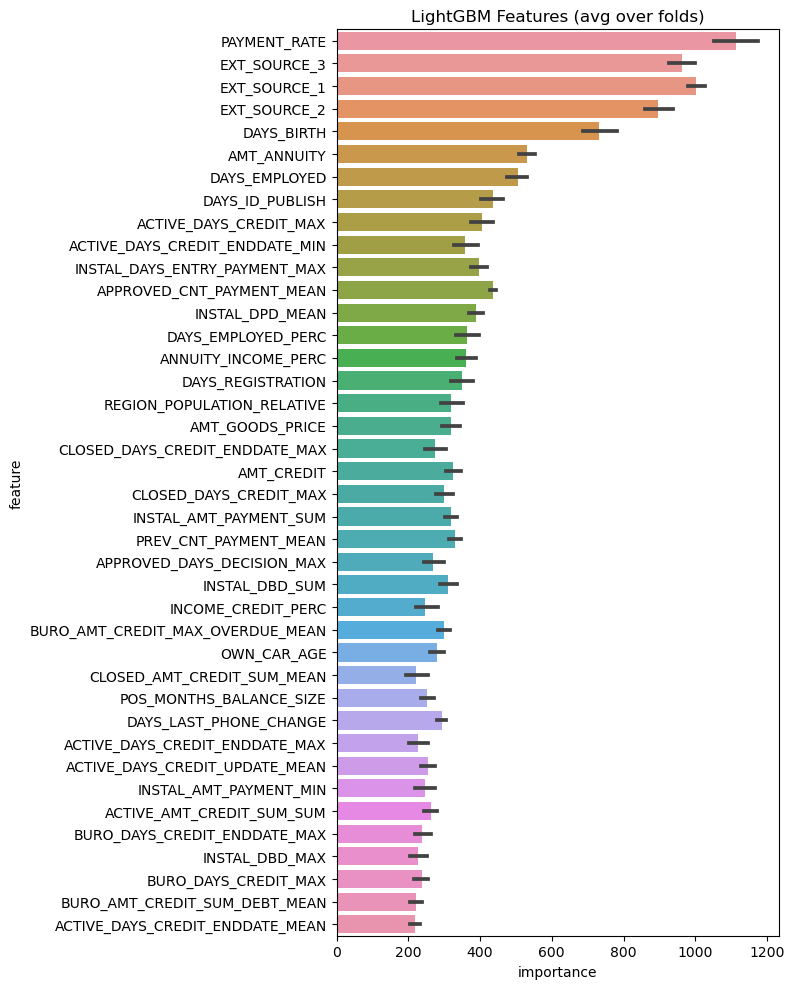

In [72]:
kfold_lightgbm_2(data_meilleurs_features,feat_importance, num_folds=10, stratified = False, debug= False)

In [73]:
df = data_constructor()

Train samples: 307511, test samples: 48744
Bureau df shape: (305811, 116)
Process bureau and bureau_balance - done in 32s
Previous applications df shape: (338857, 249)
Process previous_applications - done in 40s
Pos-cash balance df shape: (337252, 18)
Process POS-CASH balance - done in 20s
Installments payments df shape: (339587, 26)
Process installments payments - done in 42s
Credit card balance df shape: (103558, 141)
Process credit card balance - done in 37s


In [74]:
df.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,CC_NAME_CONTRACT_STATUS_Signed_MAX,CC_NAME_CONTRACT_STATUS_Signed_MEAN,CC_NAME_CONTRACT_STATUS_Signed_SUM,CC_NAME_CONTRACT_STATUS_Signed_VAR,CC_NAME_CONTRACT_STATUS_nan_MIN,CC_NAME_CONTRACT_STATUS_nan_MAX,CC_NAME_CONTRACT_STATUS_nan_MEAN,CC_NAME_CONTRACT_STATUS_nan_SUM,CC_NAME_CONTRACT_STATUS_nan_VAR,CC_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [75]:
df.shape

(356251, 798)

In [76]:
df_target = df['TARGET'].value_counts()

In [77]:
df_target

0.0    282682
1.0     24825
Name: TARGET, dtype: int64

Il y a 282682 clients avec la target à 0 et 24825 avec la target à 1

Text(0.5, 1.0, 'Target')

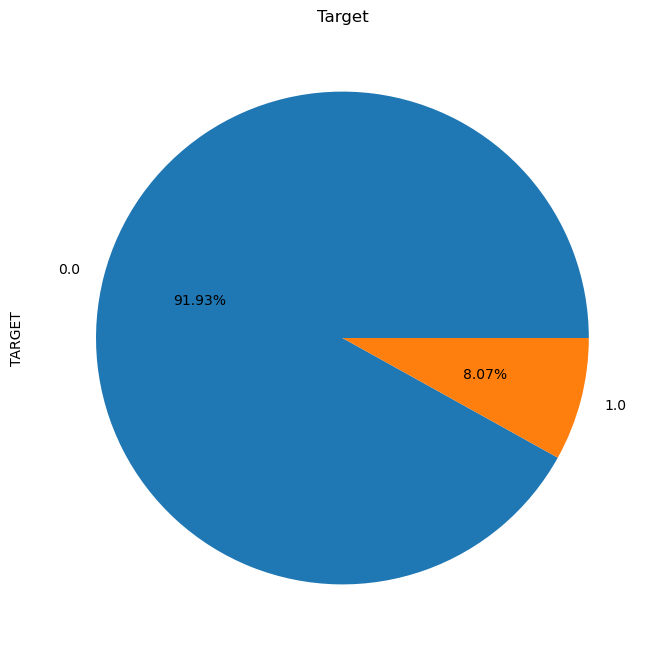

In [78]:
#Diagramme circulaire des targets
ax=df_target.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("Target")

Text(0.5, 1.0, 'CODE_GENDER')

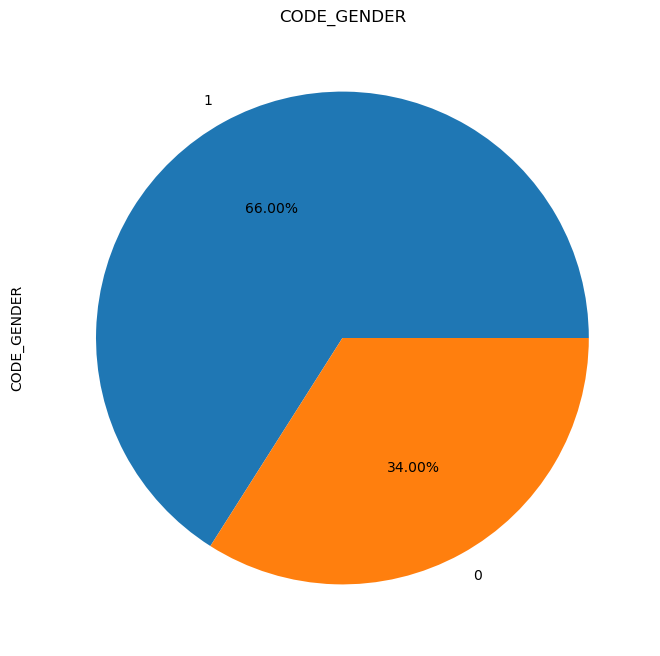

In [79]:
#Diagramme circulaire des 'CODE_GENDER'
df_NAME_CONTRACT_TYPE = df['CODE_GENDER'].value_counts()
ax=df_NAME_CONTRACT_TYPE.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("CODE_GENDER")

In [80]:
df_target_1 = df[df['TARGET']==1]

In [81]:
df_target_0 = df[df['TARGET']==0]

Text(0.5, 1.0, 'CODE_GENDER TARGET = 1')

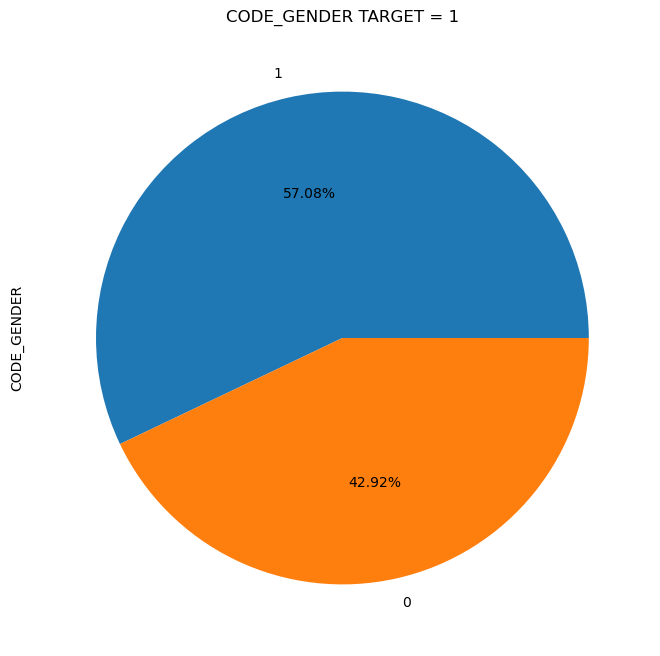

In [82]:
#Diagramme circulaire des 'CODE_GENDER' pour target = 1
df_NAME_CONTRACT_TYPE_target_1 = df_target_1['CODE_GENDER'].value_counts()
ax=df_NAME_CONTRACT_TYPE_target_1.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("CODE_GENDER TARGET = 1")

Text(0.5, 1.0, 'CODE_GENDER TARGET = 0')

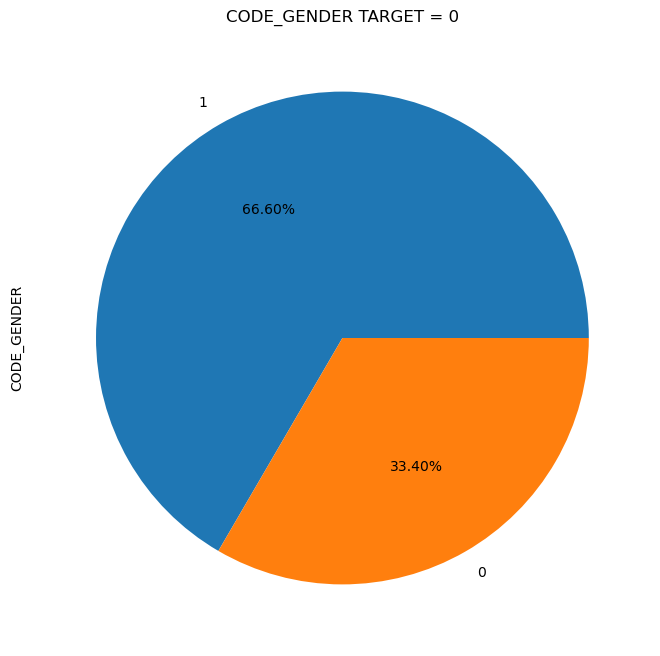

In [83]:
#Diagramme circulaire des 'CODE_GENDER' pour target = 0
df_NAME_CONTRACT_TYPE_target_0 = df_target_0['CODE_GENDER'].value_counts()
ax=df_NAME_CONTRACT_TYPE_target_0.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("CODE_GENDER TARGET = 0")

Text(0.5, 1.0, 'FLAG_OWN_CAR df')

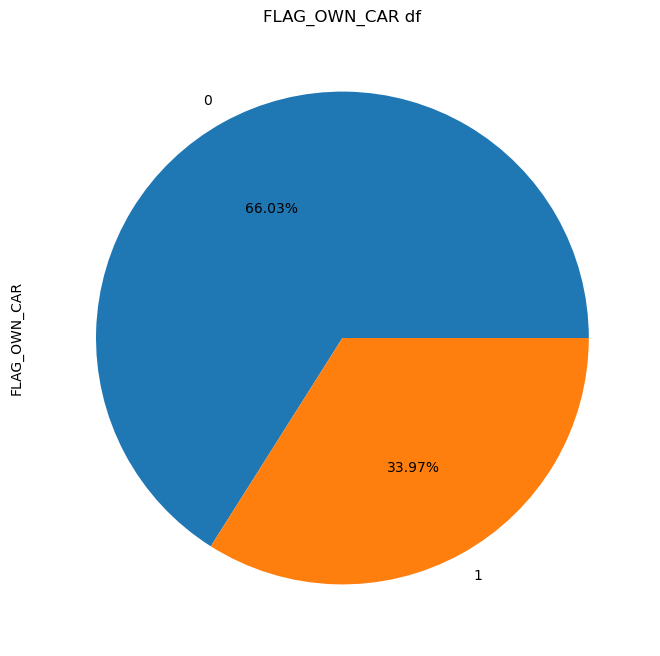

In [84]:
#Diagramme circulaire des 'FLAG_OWN_CAR' pour df
df_FLAG_OWN_CAR = df['FLAG_OWN_CAR'].value_counts()
ax=df_FLAG_OWN_CAR.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("FLAG_OWN_CAR df")

Text(0.5, 1.0, 'FLAG_OWN_CAR TARGET = 1')

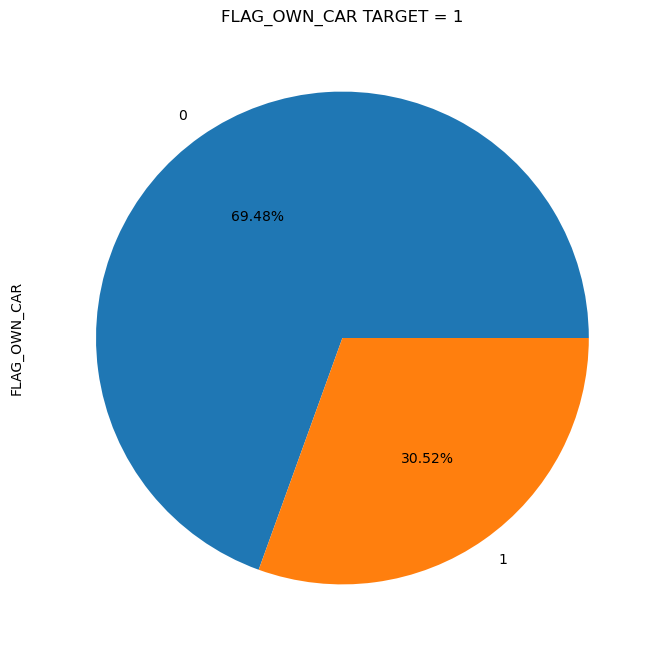

In [85]:
#Diagramme circulaire des 'FLAG_OWN_CAR' pour target = 1
df_FLAG_OWN_CAR_target_1 = df_target_1['FLAG_OWN_CAR'].value_counts()
ax=df_FLAG_OWN_CAR_target_1.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("FLAG_OWN_CAR TARGET = 1")

Text(0.5, 1.0, 'FLAG_OWN_CAR TARGET = 0')

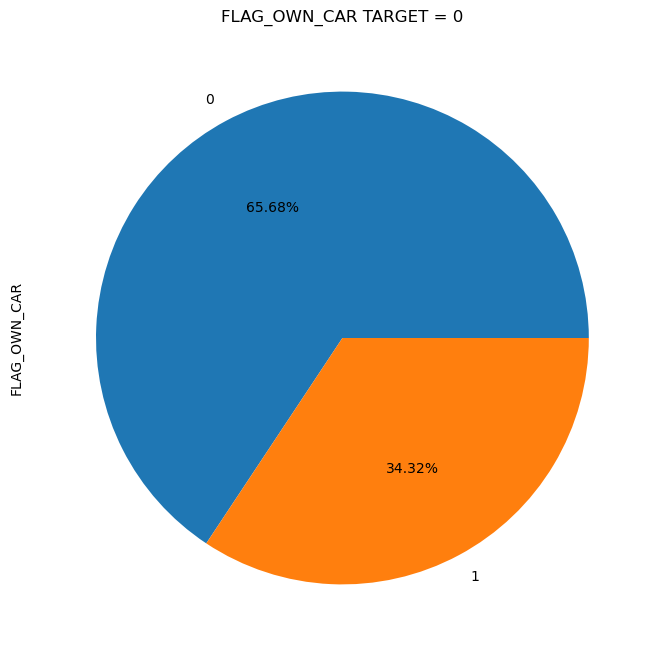

In [86]:
#Diagramme circulaire des 'FLAG_OWN_CAR' pour target = 0
df_FLAG_OWN_CAR_target_0 = df_target_0['FLAG_OWN_CAR'].value_counts()
ax=df_FLAG_OWN_CAR_target_0.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("FLAG_OWN_CAR TARGET = 0")

# Supprimer certaines colonnes

In [87]:
col_filter = [col for col in df.columns if df[col].isnull().sum()*100.0/df.shape[0] > 30]
col_filter

['OWN_CAR_AGE',
 'EXT_SOURCE_1',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'TOTALAREA_MODE',
 'BURO_AMT_CREDIT_MAX_OVERDUE_MEAN',
 

In [88]:
df.drop(col_filter,1, inplace=True)# 1 colonne

In [89]:
df.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19.0
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25.0
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3.0
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,-12.0,-271.625000,-4346.0,16.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,-14.0,-1032.242424,-68128.0,66.0


# Les valeurs manquantes

In [90]:
col_numerics = list(df.select_dtypes(include = ['int64', 'float64']).columns)
col_categories = list(df.select_dtypes(exclude = ['int64', 'float64']).columns)

In [91]:
df[col_categories].nunique()

NAME_CONTRACT_TYPE_Cash loans         2
NAME_CONTRACT_TYPE_Revolving loans    2
NAME_TYPE_SUITE_Children              2
NAME_TYPE_SUITE_Family                2
NAME_TYPE_SUITE_Group of people       2
                                     ..
WALLSMATERIAL_MODE_Panel              2
WALLSMATERIAL_MODE_Stone, brick       2
WALLSMATERIAL_MODE_Wooden             2
EMERGENCYSTATE_MODE_No                2
EMERGENCYSTATE_MODE_Yes               2
Length: 133, dtype: int64

In [92]:
df[col_numerics].isnull().sum().sum()

11107968

In [93]:
df = df.fillna(df.median())

In [94]:
df.isnull().sum().sum()

0

# Traitement des outliers

In [95]:
import copy
def suppresion_outliers(new_data):# prend les données sans valeurs manquantes
    my_columns = new_data.columns.tolist()
    new_data_3 = new_data[my_columns]
    df_new = copy.deepcopy(new_data_3)
    for i in range(len(my_columns)):
        Q1 = np.percentile(df_new[my_columns[i]], 25, interpolation = 'midpoint') 
        Q3 = np.percentile(df_new[my_columns[i]], 75, interpolation = 'midpoint')
        IQR = Q3 - Q1
        # Au dessus de la limite supérieure
        upper = df_new[my_columns[i]] >= (Q3+1.5*IQR) 
        #print("Limite supérieure:",upper)
        #print(np.where(upper))
        df_interquartile = df_new[df_new[my_columns[i]] <= (Q3+1.5*IQR)]
        #sns.boxplot(df_interquartile[my_columns[i]])
        #plt.show()
   

In [96]:
suppresion_outliers(df)

C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\1983121402.py:7: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q1 = np.percentile(df_new[my_columns[i]], 25, interpolation = 'midpoint')
C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\1983121402.py:8: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q3 = np.percentile(df_new[my_columns[i]], 75, interpolation = 'midpoint')


In [97]:
df.head()

,index,SK_ID_CURR,TARGET,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,0,100002,1.0,0,0,0,0,202500.0,406597.5,24700.5,...,11559.247105,219625.695,9251.775,53093.745,11559.247105,219625.695,-49.0,-315.421053,-5993.0,19.0
1,1,100003,0.0,1,0,1,0,270000.0,1293502.5,35698.5,...,64754.586000,1618864.650,6662.970,560835.360,64754.586000,1618864.650,-544.0,-1385.320000,-34633.0,25.0
2,2,100004,0.0,0,1,0,0,67500.0,135000.0,6750.0,...,7096.155000,21288.465,5357.250,10573.965,7096.155000,21288.465,-727.0,-761.666667,-2285.0,3.0
3,3,100006,0.0,1,0,0,0,135000.0,312682.5,29686.5,...,62947.088438,1007153.415,2482.920,691786.890,62947.088438,1007153.415,-12.0,-271.625000,-4346.0,16.0
4,4,100007,0.0,0,0,0,0,121500.0,513000.0,21865.5,...,12666.444545,835985.340,0.180,22678.785,12214.060227,806127.975,-14.0,-1032.242424,-68128.0,66.0


In [98]:
df.isnull().sum().sum()

0

# Enlever les valeurs infinies

In [99]:
#clean_dataset(df)

In [100]:
# checking for infinity
print()
print("checking for infinity")
  
ds = df.isin([np.inf, -np.inf])
print(ds)
  
# printing the count of infinity values
print()
print("printing the count of infinity values")
  
count = np.isinf(df).values.sum()
print("It contains " + str(count) + " infinite values")
  

# printing column name where infinity is present
print()
print("printing column name where infinity is present")
col_name = df.columns.to_series()[np.isinf(df).any()]
print(col_name)
  
# printing row index with infinity
print()
print("printing row index with infinity ")
  
r = df.index[np.isinf(df).any(1)]
print(r)


checking for infinity
        index  SK_ID_CURR  TARGET  CODE_GENDER  FLAG_OWN_CAR  FLAG_OWN_REALTY  \
0       False       False   False        False         False            False   
1       False       False   False        False         False            False   
2       False       False   False        False         False            False   
3       False       False   False        False         False            False   
4       False       False   False        False         False            False   
...       ...         ...     ...          ...           ...              ...   
356250  False       False   False        False         False            False   
356251  False       False   False        False         False            False   
356252  False       False   False        False         False            False   
356253  False       False   False        False         False            False   
356254  False       False   False        False         False            False   

    

In [101]:
df['PREV_APP_CREDIT_PERC_MAX'].replace([np.inf, -np.inf], np.nan, inplace=True)    

In [102]:
df.isnull().sum().sum()

1

In [103]:
maximum = df['PREV_APP_CREDIT_PERC_MAX'].max()
maximum

20.0

In [104]:
df['PREV_APP_CREDIT_PERC_MAX'].replace([np.nan], maximum, inplace=True) 

In [105]:
df.isnull().sum().sum()

0

In [106]:
df['INSTAL_PAYMENT_PERC_MAX'].replace([np.inf, -np.inf], np.nan, inplace=True) 

In [107]:
df['INSTAL_PAYMENT_PERC_MAX'].replace([np.nan], df['INSTAL_PAYMENT_PERC_MAX'].max(), inplace=True) 

In [108]:
df.isnull().sum().sum()

0

In [109]:
df['PREV_APP_CREDIT_PERC_MAX'].replace([np.inf, -np.inf], np.nan, inplace=True) 

In [110]:
df['PREV_APP_CREDIT_PERC_MAX'].replace([np.nan], df['PREV_APP_CREDIT_PERC_MAX'].max(), inplace=True) 

In [111]:
df['INSTAL_PAYMENT_PERC_MAX'].replace([np.inf, -np.inf], np.nan, inplace=True)

In [112]:
df['INSTAL_PAYMENT_PERC_MAX'].replace([np.nan], df['INSTAL_PAYMENT_PERC_MAX'].max(), inplace=True)

In [113]:
count = np.isinf(df).values.sum()
print("It contains " + str(count) + " infinite values")

It contains 0 infinite values


# Echantillonnage de la DataFrame

In [114]:
import copy 

data_new = copy.deepcopy(df)

In [115]:
# Echantillonnage

df = df.sample(n=50000, random_state=1)

In [116]:
df.shape

(50000, 545)

Text(0.5, 1.0, 'Target')

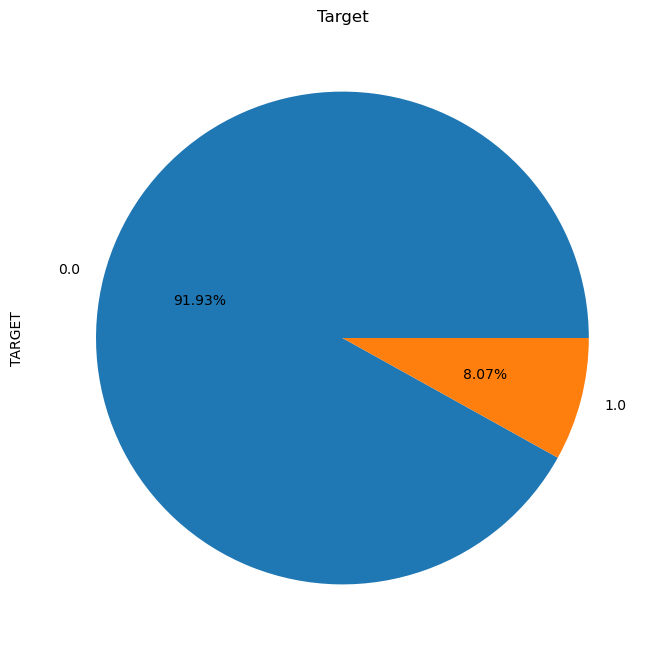

In [117]:
#Diagramme circulaire des targets
ax=df_target.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("Target")

# Séparer le jeu de données

In [118]:
y = df['TARGET']

In [119]:
df.drop(['TARGET'], axis = 1, inplace = True)

In [120]:
X = df

In [121]:
from sklearn.model_selection import train_test_split

xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state = 1, stratify = y)

In [122]:
xtest.head()

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
318877,11366,182486,1,1,0,0,315000.0,1438731.0,61087.5,1242000.0,...,49961.932683,2048439.240,22500.000,297000.0000,79172.215244,3246060.825,-27.0,-594.317073,-24367.0,41.0
236226,236226,373620,0,1,1,2,225000.0,225000.0,26703.0,225000.0,...,11226.972857,157177.620,7.830,26125.2900,10593.736071,148312.305,-2366.0,-2536.500000,-35511.0,14.0
263553,263553,405153,0,1,0,0,202500.0,490495.5,30006.0,454500.0,...,14190.516818,156095.685,13068.675,25408.9350,14190.516818,156095.685,-811.0,-967.818182,-10646.0,11.0
142303,142303,264998,0,1,0,0,112500.0,254700.0,25834.5,225000.0,...,12726.201316,334393.200,2323.575,37035.4725,12404.115000,324801.225,-65.0,-806.565775,-21233.0,25.0
170492,170492,297598,1,0,0,0,157500.0,343800.0,12478.5,225000.0,...,12507.856071,700439.940,0.450,67500.0000,12507.856071,700439.940,-8.0,-568.392857,-31830.0,56.0


In [123]:
xtrain.head()

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
318909,11398,182800,1,1,0,0,540000.0,1800000.0,56002.5,1800000.0,...,33545.445000,201272.670,33540.345,33546.4650,33545.445000,201272.670,-504.0,-580.666667,-3484.0,6.0
186300,186300,315973,1,0,0,0,90000.0,117162.0,11542.5,103500.0,...,11241.412826,258552.495,5421.555,43920.0000,13150.978043,302472.495,-78.0,-699.652174,-16092.0,23.0
245497,245497,384110,0,0,0,0,166500.0,450000.0,21109.5,450000.0,...,9323.715000,27971.145,9262.035,9354.5550,9323.715000,27971.145,-2834.0,-2871.000000,-8613.0,3.0
302074,302074,449969,1,0,0,0,67500.0,460858.5,21613.5,324000.0,...,12627.457500,75764.745,7725.870,37135.3950,12627.457500,75764.745,-2455.0,-2537.000000,-15222.0,6.0
106241,106241,223265,0,0,1,1,292500.0,973710.0,26905.5,697500.0,...,12726.201316,334393.200,2323.575,37035.4725,12404.115000,324801.225,-65.0,-806.565775,-21233.0,25.0


In [124]:
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(35000, 544)
(15000, 544)
(35000,)
(15000,)


In [125]:
ytrain.unique()

array([0., 1.])

In [126]:
ytrain.value_counts()

0.0    32548
1.0     2452
Name: TARGET, dtype: int64

In [127]:
ytest.unique()

array([0., 1.])

In [128]:
ytest.value_counts()

0.0    13949
1.0     1051
Name: TARGET, dtype: int64

# Meilleurs features

In [129]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

selector = SelectKBest(score_func=f_classif , k=80)
selector.fit(xtrain, ytrain)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [ 15  38  46  48  73  90 227 232 238 240 241 244 248 316 324 327 347 353
 358 363 373 386 388 401 415 421 425 434 446 452 515 516] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


SelectKBest(k=80)

In [130]:
select_features_kbest = selector.get_support()
features = xtrain.columns[select_features_kbest]

# SMOTE
SMOTE (pour Synthetic Minority Over-sampling Technique). Comme son nom l’indique, SMOTE est une méthode de sur-échantillonnage

In [131]:
#from unbalanced_dataset import SMOTE
from imblearn.over_sampling import SMOTE

smo = SMOTE()
X_sm_train, y_sm_train = smo.fit_resample(xtrain[features], ytrain)

In [132]:
X_sm_train.shape

(65096, 80)

# Regression logistique

##  Standardisation des données

In [134]:
col_numerics_xtrain = list(xtrain.select_dtypes(include = ['int64', 'float64']).columns)

In [135]:
col_numerics_X_sm_train = list(X_sm_train.select_dtypes(include = ['int64', 'float64']).columns)

In [136]:
from sklearn import preprocessing

xtrain[col_numerics_xtrain] = preprocessing.StandardScaler().fit_transform(xtrain[col_numerics_xtrain])

X_sm_train[col_numerics_X_sm_train] = preprocessing.StandardScaler().fit_transform(X_sm_train[col_numerics_X_sm_train])

## Avec xtrain

### Implémentation du modèle

In [137]:
from sklearn.linear_model import LogisticRegression

modele_logit_1 = LogisticRegression(penalty='none',solver='newton-cg')
modele_logit_1.fit(xtrain[features], ytrain)

LogisticRegression(penalty='none', solver='newton-cg')

In [138]:
ytrain_pred_reglog_1 = modele_logit_1.predict(xtrain[features])

ytest_pred_reglog_1 = modele_logit_1.predict(xtest[features])

### Mesure de la performance

In [139]:
from sklearn.metrics  import confusion_matrix, ConfusionMatrixDisplay

matrice_confusion_reglog_1 = confusion_matrix(ytest,ytest_pred_reglog_1)
print(matrice_confusion_reglog_1)

[[6302 7647]
 [ 380  671]]


In [140]:
def visualisation_matrice_confusion (cf_matrix_reglog): 
    group_names = ['True Neg','False Neg','False Pos','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                cf_matrix_reglog.flatten()]
    #group_percentages = ["{0:.2%}".format(value) for value in
                     #cf_matrix_reglog.flatten()/np.sum(cf_matrix_reglog)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_names,group_counts)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cf_matrix_reglog, annot=labels, fmt='', cmap='viridis')
    plt.show()

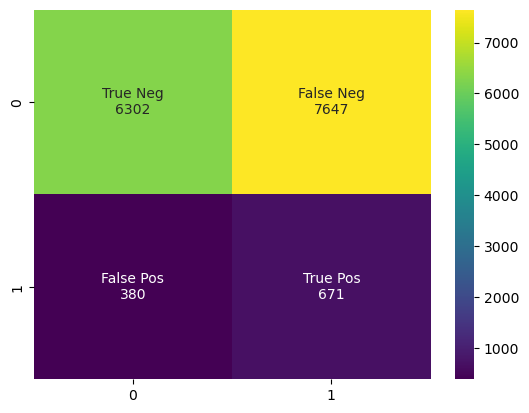

In [141]:
visualisation_matrice_confusion (matrice_confusion_reglog_1)

In [142]:
from sklearn.metrics  import accuracy_score
from sklearn.metrics  import precision_score,recall_score 
from sklearn.metrics  import f1_score,fbeta_score, roc_auc_score, roc_curve

In [143]:
def generate_model_report(y_actual, y_predicted):
    print("Accuracy = ", accuracy_score(y_actual, y_predicted))
    print("Precision = ", precision_score(y_actual, y_predicted, average = 'macro'))
    print("Recall = " ,recall_score(y_actual, y_predicted, average = 'macro'))
    print("F1_Score = " ,f1_score(y_actual, y_predicted))
    pass

In [144]:
generate_model_report(ytest, ytest_pred_reglog_1 )

Accuracy =  0.46486666666666665
Precision =  0.5118996145364819
Recall =  0.5451141200181523
F1_Score =  0.14323833920375706


In [145]:
def generate_model_report_beta(y_actual, y_predicted, beta):
    print("Accuracy = ", accuracy_score(y_actual, y_predicted))
    print("Precision = ", precision_score(y_actual, y_predicted, average = 'macro'))
    print("Recall = " ,recall_score(y_actual, y_predicted, average = 'macro'))
    print("Fbeta_Score = " ,fbeta_score(y_actual, y_predicted, average='binary', beta=beta))
    pass

Une valeur bêta par défaut est 1,0, ce qui est identique à la mesure F. Une valeur bêta plus petite, telle que 0,5, donne plus de poids à la précision et moins au rappel, tandis qu'une valeur bêta plus grande, telle que 2,0, donne moins de poids à la précision et plus de poids au rappel dans le calcul du score.

Score F2 (bêta = 2) : un tel bêta rend une valeur de rappel plus importante qu'une valeur de précision. En d'autres termes, il se concentre sur la minimisation des faux négatifs plutôt que sur la minimisation des faux positifs.

In [146]:
generate_model_report_beta(ytest, ytest_pred_reglog_1, 10 )

Accuracy =  0.46486666666666665
Precision =  0.5118996145364819
Recall =  0.5451141200181523
Fbeta_Score =  0.5975330194501755


In [147]:
generate_model_report_beta(ytest, ytest_pred_reglog_1, 5 )

Accuracy =  0.46486666666666665
Precision =  0.5118996145364819
Recall =  0.5451141200181523
Fbeta_Score =  0.5043216835776023


In [148]:
def generate_auc_roc_curve(clf, xtest):
    ypred_proba = clf.predict_proba(xtest[features])[:, 1]
    fpr, tpr, thresholds = roc_curve(ytest, ypred_proba)
    auc = roc_auc_score(ytest, ypred_proba)
    plt.plot(fpr, tpr, label = "AUC curve avec aire sous la courbe = " +str(auc))
    plt.legend(loc=4)
    plt.show()
    pass

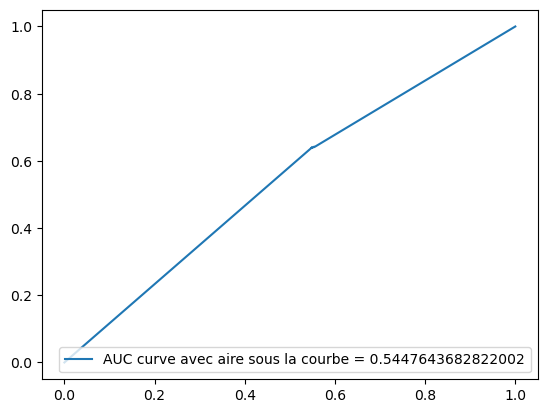

In [149]:
generate_auc_roc_curve(modele_logit_1, xtest) #generate_auc_roc_curve(modele_logit_1, xtest[features])

In [150]:
def mesure_performance_modele(ytest, ytest_pred):
    matrice_confusion = confusion_matrix(ytest,ytest_pred)
    print('\033[91m'+'******Matrice de confusion********')
    print( matrice_confusion)    
    visualisation_matrice_confusion (matrice_confusion)
    print('************************************')
    print('\033[94m'+'******Mesures de performance avec f1_score********')
    generate_model_report(ytest, ytest_pred)
    print('\033[92m'+'******Mesures de performance avec beta = 10********')
    generate_model_report_beta(ytest, ytest_pred, 10 )
    print('\033[95m'+'******Mesures de performance avec beta = 5********')
    generate_model_report_beta(ytest, ytest_pred, 5 )
       

******Matrice de confusion********
[[6302 7647]
 [ 380  671]]


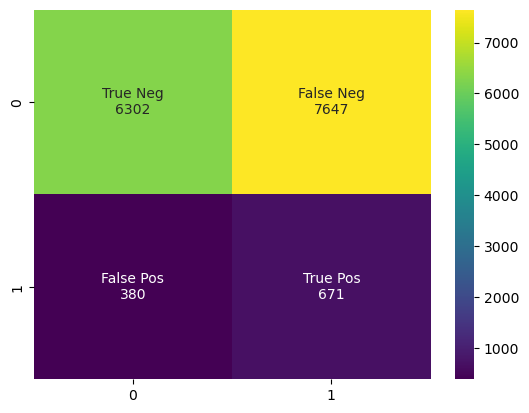

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.46486666666666665
Precision =  0.5118996145364819
Recall =  0.5451141200181523
F1_Score =  0.14323833920375706
******Mesures de performance avec beta = 10********
Accuracy =  0.46486666666666665
Precision =  0.5118996145364819
Recall =  0.5451141200181523
Fbeta_Score =  0.5975330194501755
******Mesures de performance avec beta = 5********
Accuracy =  0.46486666666666665
Precision =  0.5118996145364819
Recall =  0.5451141200181523
Fbeta_Score =  0.5043216835776023


In [151]:
mesure_performance_modele(ytest, ytest_pred_reglog_1)

### Amélioration du modèle

In [152]:
weights = np.linspace(0.05, 0.95, 20)
param_grid={
        'class_weight': [{0: x, 1: 1.0-x} for x in weights]
    }

#### Avec Auc

In [153]:
from sklearn.model_selection import RandomizedSearchCV
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rl = LogisticRegression()
# Random search of parameters, using 3 fold cross validation, 
# search across 10 different combinations, and use all available cores
rl_random = RandomizedSearchCV(estimator = rl, param_distributions = param_grid, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rl_random.fit(xtrain[features], ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'class_weight': [{0: 0.05, 1: 0.95},
                                                         {0: 0.09736842105263158,
                                                          1: 0.9026315789473685},
                                                         {0: 0.14473684210526316,
                                                          1: 0.8552631578947368},
                                                         {0: 0.19210526315789472,
                                                          1: 0.8078947368421052},
                                                         {0: 0.23947368421052628,
                                                          1: 0.7605263157894737},
                                                         {0: 0.28684210526315784,
                                                          1: 0.7131578947368422},
                                   

In [154]:
rl_random.best_params_

{'class_weight': {0: 0.9026315789473683, 1: 0.09736842105263166}}

In [155]:
modele_logit_1_auc = LogisticRegression(**rl_random.best_params_)
modele_logit_1_auc.fit(xtrain[features], ytrain)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight={0: 0.9026315789473683, 1: 0.09736842105263166})

In [156]:
ytrain_pred_reglog_1_auc = modele_logit_1_auc.predict(xtrain[features])
ytest_pred_reglog_1_auc = modele_logit_1_auc.predict(xtest[features])

******Matrice de confusion********
[[5944 8005]
 [ 354  697]]


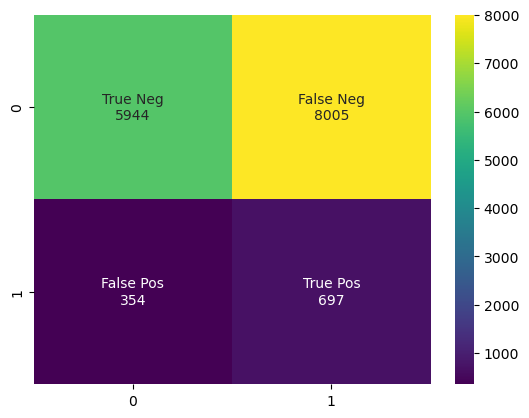

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.4427333333333333
Precision =  0.5119441047159105
Recall =  0.5446508311267654
F1_Score =  0.14293038039577566
******Mesures de performance avec beta = 10********
Accuracy =  0.4427333333333333
Precision =  0.5119441047159105
Recall =  0.5446508311267654
Fbeta_Score =  0.6185919403876909
******Mesures de performance avec beta = 5********
Accuracy =  0.4427333333333333
Precision =  0.5119441047159105
Recall =  0.5446508311267654
Fbeta_Score =  0.5181119021070989


In [157]:
mesure_performance_modele(ytest, ytest_pred_reglog_1_auc)

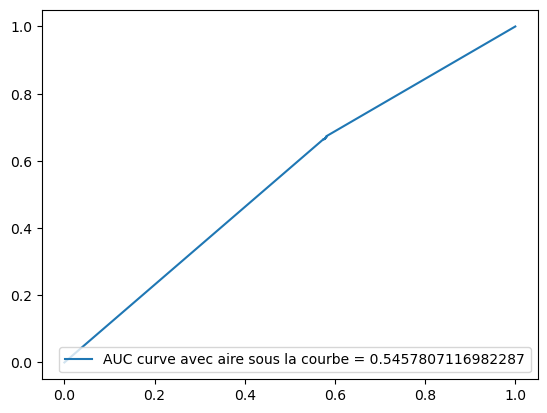

In [158]:
generate_auc_roc_curve(modele_logit_1_auc, xtest)

### Fonction coût et fonction gain métier
[Source https://github.com/JM-JO] 

On va utiliser les hypothèses suivantes pour chaque candidat au crédit :

1. frais généraux pour chaque client : coût = 1.
2. gain par client qui rembourse le crédit = 10 (les "True Negative")(octroi de crédit à un client solvable).
3. coût par client qui fait défaut = 100 (les "False Negative)(octroi de crédit à un client non-solvable).
4. absence de coûts additionnels pour les "True Positive" (refus de crédit à un client non-solvable).
5. absence de coûts additionnels pour les "False Positive" (refus de crédit à un client solvable).

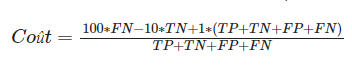

Plutôt qu'utiliser une fonction coût, on va aussi travailler avec une fonction gain construite ainsi :

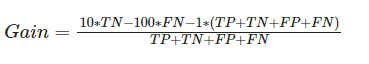 

Cette fonction de gain est bornée entre -101 (l'algo ne génère que des FP) et 9 (l'algo est parfait et ne génère que des TN).


In [159]:
def gain_metier(TP, TN, FP, FN, gain_TN=10, cout_FN=100):
    return (gain_TN * TN - cout_FN * FN - (TP + TN + FP + FN)) / (TP + TN + FP + FN)

In [160]:
ytest_pred_reglog_1_auc_proba = rl_random.predict_proba(xtest[features])

train_set_pred_reglog_1_auc_proba = pd.DataFrame({
    'SK_ID_CURR':
    xtest.index,
    'pred_proba':
    ytest_pred_reglog_1_auc_proba[:, 1],
    'TARGET_True':
    ytest.astype(int)
})

In [161]:
train_set_pred_reglog_1_auc_proba['pred_proba'].value_counts()

1.000000e+00     8695
0.000000e+00     6183
9.486420e-87        1
8.296261e-258       1
3.660682e-270       1
                 ... 
1.704899e-185       1
4.534992e-193       1
2.631283e-210       1
4.047435e-277       1
2.979778e-222       1
Name: pred_proba, Length: 124, dtype: int64

In [162]:
def gain_modelise(seuil,train_set_pred_reglog_1_auc_proba, verbose=False):
    "Retourne le gain métier en fonction du seuil."
    ser_TARGET_pred = (train_set_pred_reglog_1_auc_proba['pred_proba'] > seuil).astype(int)
    TP = ((train_set_pred_reglog_1_auc_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 1)).sum()
    TN = ((train_set_pred_reglog_1_auc_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 0)).sum()
    FP = ((train_set_pred_reglog_1_auc_proba['TARGET_True'] == 0)
          & (ser_TARGET_pred == 1)).sum()
    FN = ((train_set_pred_reglog_1_auc_proba['TARGET_True'] == 1)
          & (ser_TARGET_pred == 0)).sum()
    if verbose:
        return TP, TN, FP, FN, gain_metier(TP, TN, FP, FN)
    else:
        return gain_metier(TP, TN, FP, FN)

In [163]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil, train_set_pred_reglog_1_auc_proba) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


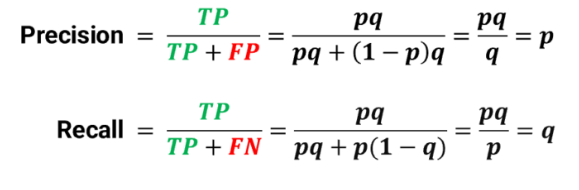

In [164]:
liste = []# ('Ridge', r2 )
data_scores = pd.DataFrame(liste, columns = ['Modèle' , 'Score'])

In [165]:
data_scores

,Modèle,Score


In [166]:
def affichage_gain_maximum(rl_random, data_scores, Modele):
    ytest_pred_proba = rl_random.predict_proba(xtest[features])

    train_set_pred_reglog_1_auc_proba = pd.DataFrame({
        'SK_ID_CURR':
        xtest.index,
        'pred_proba':
        ytest_pred_proba[:, 1],
        'TARGET_True':
        ytest.astype(int)
    })
    seuils = np.linspace(0, 1, 1001)
    gains_modelises = [gain_modelise(seuil, train_set_pred_reglog_1_auc_proba) for seuil in seuils]

    # Quelle est la valeur de seuil qui conduit au max ?
    max_value_train = max(gains_modelises)
    max_index = gains_modelises.index(max_value_train)
    max_seuil = seuils[max_index]
    print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
    print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))
    
    liste = [(Modele, round(max_value_train, 2))]# ('Ridge', r2 )
    data_scores_new = pd.DataFrame(liste, columns = ['Modèle' , 'Score'])
    data_scores = data_scores.append(data_scores_new,ignore_index=True)
    data_scores.head()
    
    TP, TN, FP, FN,_ = gain_modelise(max_seuil, train_set_pred_reglog_1_auc_proba, True)
    display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))
    
    print ('TP : ', TP)
    print ('TN : ', TN)
    print ('FP : ', FP)
    print ('FN : ', FN)
    
    precision = TP/(TP + FP)
    recall = TP/(TP + FN)
    
    print("**********************************************************")
    print("Precision :", precision)
    print("recall :", recall)
    
    plt.figure(edgecolor='black', linewidth=4)
    plt.plot(seuils, gains_modelises)
    plt.xlabel('Seuil')
    plt.ylabel('Gain métier')
    plt.title('Tracé de la fonction gain métier')
    plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
    plt.show()
    
    return data_scores
   
    

In [167]:
gain_modelise(0.5, train_set_pred_reglog_1_auc_proba, verbose = True)

(697, 5944, 8005, 354, 0.6026666666666667)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


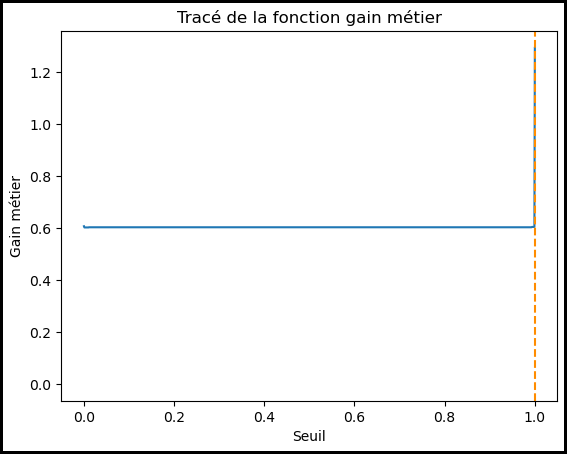

In [168]:
data_scores = affichage_gain_maximum(rl_random, data_scores, 'Regression logistique xtrain avec AUC')

In [169]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29


#### Avec f1

In [170]:
rl_1_f1 = LogisticRegression()
rl_1_f1_random = RandomizedSearchCV(estimator = rl_1_f1, param_distributions = param_grid, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rl_1_f1_random.fit(xtrain[features], ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'class_weight': [{0: 0.05, 1: 0.95},
                                                         {0: 0.09736842105263158,
                                                          1: 0.9026315789473685},
                                                         {0: 0.14473684210526316,
                                                          1: 0.8552631578947368},
                                                         {0: 0.19210526315789472,
                                                          1: 0.8078947368421052},
                                                         {0: 0.23947368421052628,
                                                          1: 0.7605263157894737},
                                                         {0: 0.28684210526315784,
                                                          1: 0.7131578947368422},
                                   

In [171]:
modele_logit_1_f1 = LogisticRegression(**rl_1_f1_random.best_params_)
modele_logit_1_f1.fit(xtrain[features], ytrain)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight={0: 0.09736842105263158, 1: 0.9026315789473685})

In [172]:
ytrain_pred_reglog_1_f1 = modele_logit_1_f1.predict(xtrain[features])
ytest_pred_reglog_1_f1 = modele_logit_1_f1.predict(xtest[features])

******Matrice de confusion********
[[6406 7543]
 [ 380  671]]


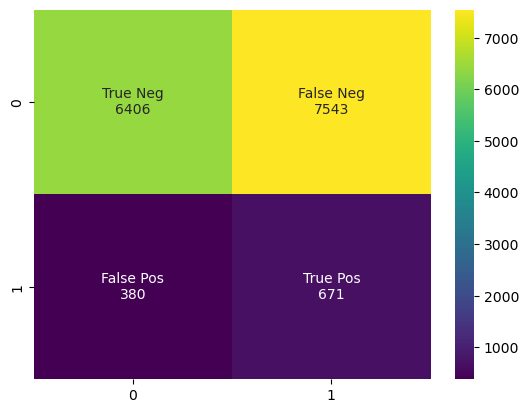

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.4718
Precision =  0.5128460778507377
Recall =  0.5488419858149837
F1_Score =  0.1448461953588775
******Mesures de performance avec beta = 10********
Accuracy =  0.4718
Precision =  0.5128460778507377
Recall =  0.5488419858149837
Fbeta_Score =  0.5980814374216779
******Mesures de performance avec beta = 5********
Accuracy =  0.4718
Precision =  0.5128460778507377
Recall =  0.5488419858149837
Fbeta_Score =  0.5058424425179042


In [173]:
mesure_performance_modele(ytest, ytest_pred_reglog_1_f1)

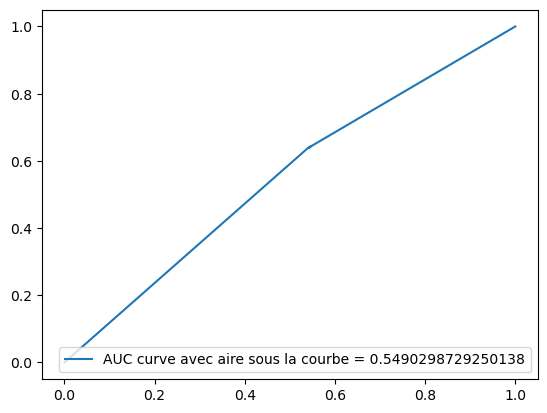

In [174]:
generate_auc_roc_curve(modele_logit_1_f1, xtest)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


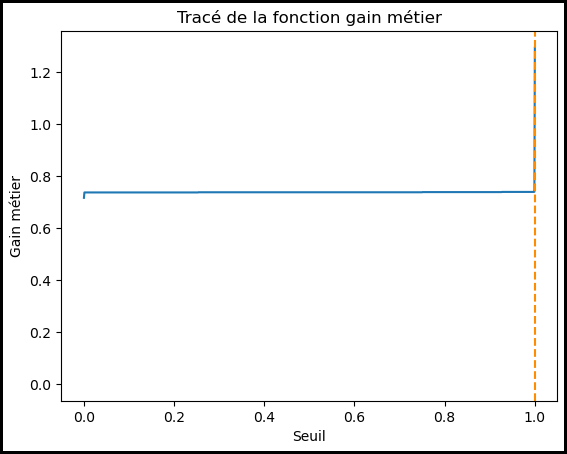

In [175]:
data_scores = affichage_gain_maximum(rl_1_f1_random, data_scores, 'Regression logistique xtrain avec f1')

In [176]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29


## Avec xtrain et balanced

In [177]:
modele_logit_balanced = LogisticRegression(penalty='none',solver='newton-cg', class_weight='balanced')
modele_logit_balanced.fit(xtrain[features], ytrain)

LogisticRegression(class_weight='balanced', penalty='none', solver='newton-cg')

In [178]:
ytrain_pred_reglog_balanced = modele_logit_balanced.predict(xtrain[features])

ytest_pred_reglog_balanced = modele_logit_balanced.predict(xtest[features])

******Matrice de confusion********
[[6452 7497]
 [ 381  670]]


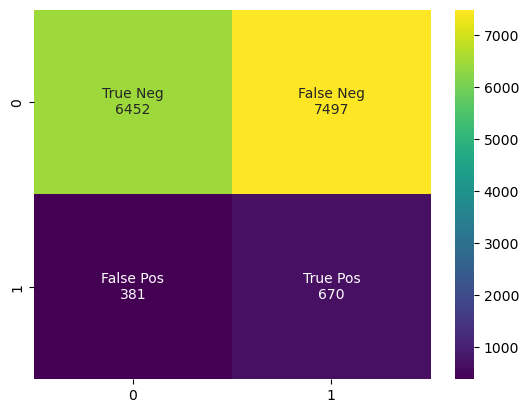

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.4748
Precision =  0.513139325177581
Recall =  0.5500151121398538
F1_Score =  0.14536775873291385
******Mesures de performance avec beta = 10********
Accuracy =  0.4748
Precision =  0.513139325177581
Recall =  0.5500151121398538
Fbeta_Score =  0.5974379121897818
******Mesures de performance avec beta = 5********
Accuracy =  0.4748
Precision =  0.513139325177581
Recall =  0.5500151121398538
Fbeta_Score =  0.5057778293943441


In [179]:
mesure_performance_modele(ytest, ytest_pred_reglog_balanced)

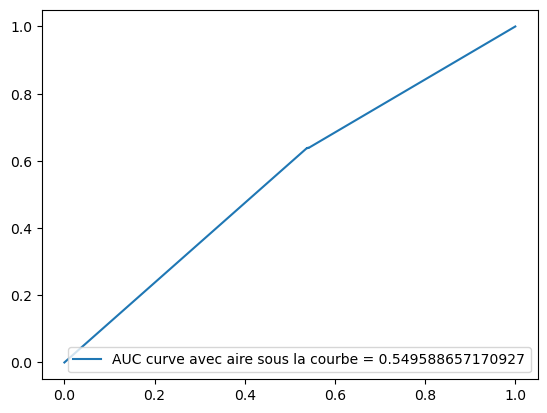

In [180]:
generate_auc_roc_curve(modele_logit_balanced, xtest)

### Amélioration du modèle

#### Avec Auc

## Avec le Smote

### Implémentation du modèle

In [181]:
modele_logit = LogisticRegression(penalty='none',solver='newton-cg', class_weight='balanced')
modele_logit.fit(X_sm_train, y_sm_train)

LogisticRegression(class_weight='balanced', penalty='none', solver='newton-cg')

In [182]:
ytrain_pred_reglog = modele_logit.predict(X_sm_train)
ytest_pred_reglog = modele_logit.predict(xtest[features])

### Mesures des performances du modèle

******Matrice de confusion********
[[5344 8605]
 [ 308  743]]


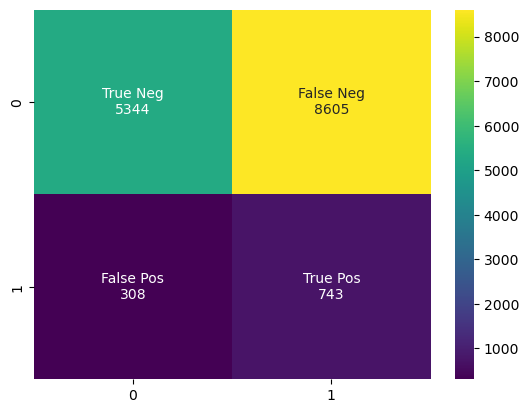

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.4058
Precision =  0.5124941288802763
Recall =  0.5450278331442412
F1_Score =  0.14289835561111644
******Mesures de performance avec beta = 10********
Accuracy =  0.4058
Precision =  0.5124941288802763
Recall =  0.5450278331442412
Fbeta_Score =  0.6556951628687265
******Mesures de performance avec beta = 5********
Accuracy =  0.4058
Precision =  0.5124941288802763
Recall =  0.5450278331442412
Fbeta_Score =  0.5422900934789322


In [183]:
mesure_performance_modele(ytest, ytest_pred_reglog)

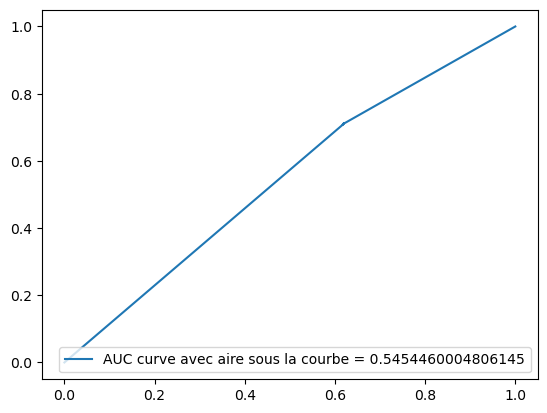

In [184]:
generate_auc_roc_curve(modele_logit, xtest)

### Amélioration du modèle

#### Avec le score AUC

In [185]:
rl_smote_auc = LogisticRegression()
rl_smote_auc_random = RandomizedSearchCV(estimator = rl_smote_auc, param_distributions = param_grid, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rl_smote_auc_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'class_weight': [{0: 0.05, 1: 0.95},
                                                         {0: 0.09736842105263158,
                                                          1: 0.9026315789473685},
                                                         {0: 0.14473684210526316,
                                                          1: 0.8552631578947368},
                                                         {0: 0.19210526315789472,
                                                          1: 0.8078947368421052},
                                                         {0: 0.23947368421052628,
                                                          1: 0.7605263157894737},
                                                         {0: 0.28684210526315784,
                                                          1: 0.7131578947368422},
                                   

In [186]:
modele_logit_smote_auc = LogisticRegression(**rl_smote_auc_random.best_params_)
modele_logit_smote_auc.fit(X_sm_train, y_sm_train)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight={0: 0.7605263157894736, 1: 0.2394736842105264})

In [187]:
ytrain_pred_reglog_smote_auc = modele_logit_smote_auc.predict(X_sm_train)
ytest_pred_reglog_smote_auc = modele_logit_smote_auc.predict(xtest[features])

##### Mesure des performance du modèle

******Matrice de confusion********
[[6744 7205]
 [ 413  638]]


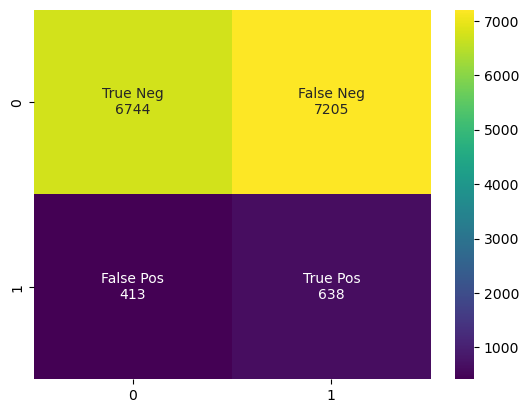

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.4921333333333333
Precision =  0.5118203404664095
Recall =  0.5452582156870356
F1_Score =  0.14346750618394424
******Mesures de performance avec beta = 10********
Accuracy =  0.4921333333333333
Precision =  0.5118203404664095
Recall =  0.5452582156870356
Fbeta_Score =  0.570535579894283
******Mesures de performance avec beta = 5********
Accuracy =  0.4921333333333333
Precision =  0.5118203404664095
Recall =  0.5452582156870356
Fbeta_Score =  0.486194970396858


In [188]:
mesure_performance_modele(ytest, ytest_pred_reglog_smote_auc) 

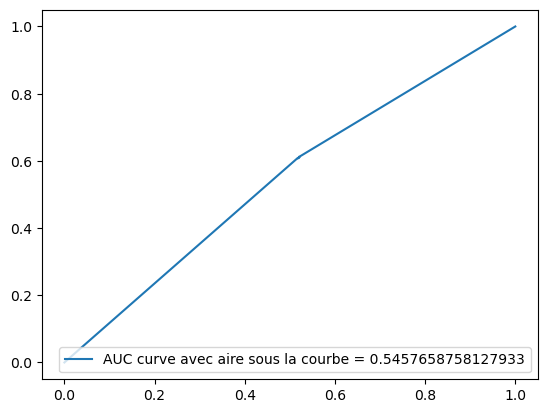

In [189]:
generate_auc_roc_curve(modele_logit_smote_auc, xtest)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


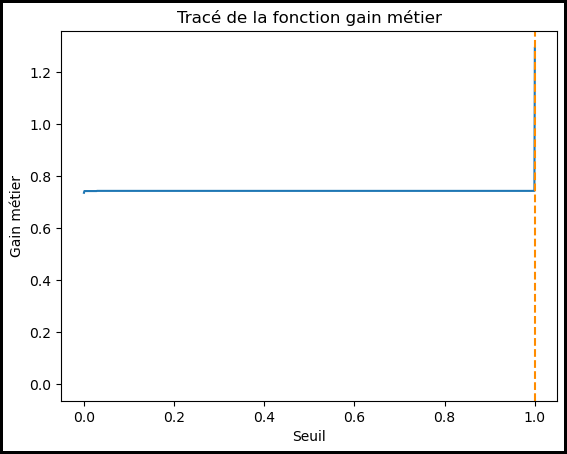

In [190]:
data_scores = affichage_gain_maximum(rl_smote_auc_random, data_scores, 'Regression logistique Smote avec AUC')

In [191]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29


#### Avec le score f1_score

In [192]:
rl_smote_f1 = LogisticRegression()
rl_smote_f1_random = RandomizedSearchCV(estimator = rl_smote_f1, param_distributions = param_grid, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rl_smote_f1_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'class_weight': [{0: 0.05, 1: 0.95},
                                                         {0: 0.09736842105263158,
                                                          1: 0.9026315789473685},
                                                         {0: 0.14473684210526316,
                                                          1: 0.8552631578947368},
                                                         {0: 0.19210526315789472,
                                                          1: 0.8078947368421052},
                                                         {0: 0.23947368421052628,
                                                          1: 0.7605263157894737},
                                                         {0: 0.28684210526315784,
                                                          1: 0.7131578947368422},
                                   

In [193]:
modele_logit_smote_f1 = LogisticRegression(**rl_smote_f1_random.best_params_)
modele_logit_smote_f1.fit(X_sm_train, y_sm_train)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight={0: 0.4289473684210526, 1: 0.5710526315789475})

In [194]:
ytrain_pred_reglog_smote_f1 = modele_logit_smote_f1.predict(X_sm_train)
ytest_pred_reglog_smote_f1 = modele_logit_smote_f1.predict(xtest[features])

##### Mesure des performances du modèle

******Matrice de confusion********
[[5050 8899]
 [ 288  763]]


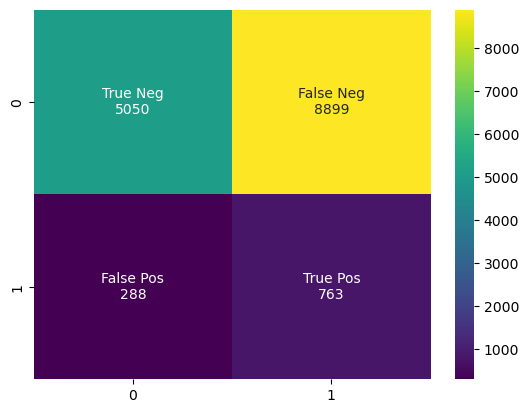

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.38753333333333334
Precision =  0.5125081831083581
Recall =  0.5440041911546882
F1_Score =  0.1424437599178568
******Mesures de performance avec beta = 10********
Accuracy =  0.38753333333333334
Precision =  0.5125081831083581
Recall =  0.5440041911546882
Fbeta_Score =  0.6715027622383717
******Mesures de performance avec beta = 5********
Accuracy =  0.38753333333333334
Precision =  0.5125081831083581
Recall =  0.5440041911546882
Fbeta_Score =  0.5520215933439073


In [195]:
mesure_performance_modele(ytest, ytest_pred_reglog_smote_f1) 

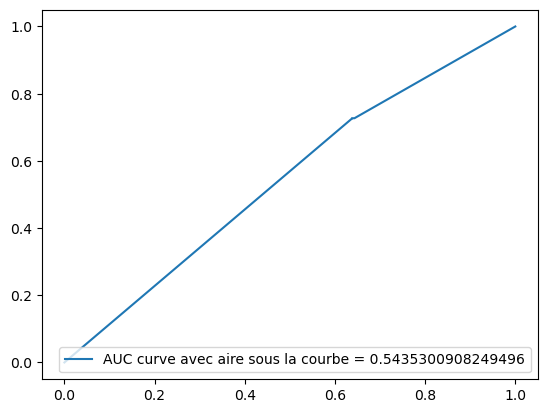

In [196]:
generate_auc_roc_curve(modele_logit_smote_f1, xtest)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


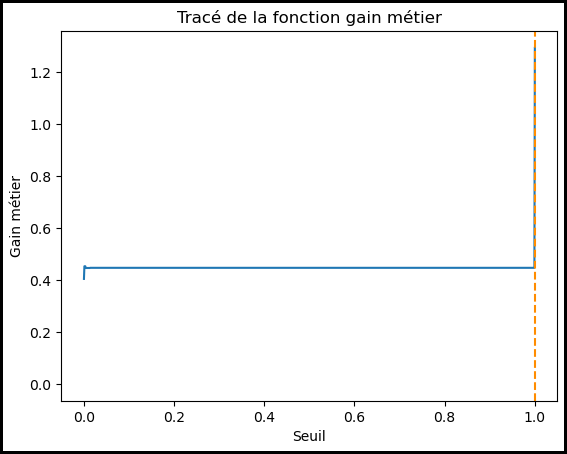

In [197]:
data_scores = affichage_gain_maximum(rl_smote_f1_random, data_scores, 'Regression logistique Smote avec f1')

In [198]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29


#### Avec le score fbeta_score

In [199]:
from sklearn.metrics import fbeta_score, make_scorer

rl_smote_fbeta = LogisticRegression()
rl_smote_fbeta_random = RandomizedSearchCV(estimator = rl_smote_fbeta, param_distributions = param_grid, scoring = make_scorer(fbeta_score, beta=10), n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rl_smote_fbeta_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


RandomizedSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
                   param_distributions={'class_weight': [{0: 0.05, 1: 0.95},
                                                         {0: 0.09736842105263158,
                                                          1: 0.9026315789473685},
                                                         {0: 0.14473684210526316,
                                                          1: 0.8552631578947368},
                                                         {0: 0.19210526315789472,
                                                          1: 0.8078947368421052},
                                                         {0: 0.23947368421052628,
                                                          1: 0.7605263157894737},
                                                         {0: 0.28684210526315784,
                                                          1: 0.7131578947368422},
                                   

In [200]:
modele_logit_smote_fbeta = LogisticRegression(**rl_smote_fbeta_random.best_params_)
modele_logit_smote_fbeta.fit(X_sm_train, y_sm_train)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(class_weight={0: 0.05, 1: 0.95})

In [201]:
ytrain_pred_reglog_smote_fbeta = modele_logit_smote_fbeta.predict(X_sm_train)
ytest_pred_reglog_smote_fbeta = modele_logit_smote_fbeta.predict(xtest[features])

##### Mesures de la performance du modèle

******Matrice de confusion********
[[ 3398 10551]
 [  180   871]]


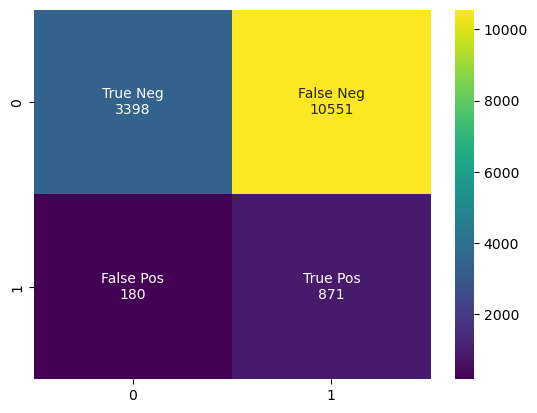

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.2846
Precision =  0.5129744565394526
Recall =  0.5361681152061414
F1_Score =  0.13966166920548384
******Mesures de performance avec beta = 10********
Accuracy =  0.2846
Precision =  0.5129744565394526
Recall =  0.5361681152061414
Fbeta_Score =  0.7549733097612467
******Mesures de performance avec beta = 5********
Accuracy =  0.2846
Precision =  0.5129744565394526
Recall =  0.5361681152061414
Fbeta_Score =  0.600737459214261


In [202]:
mesure_performance_modele(ytest, ytest_pred_reglog_smote_fbeta) 

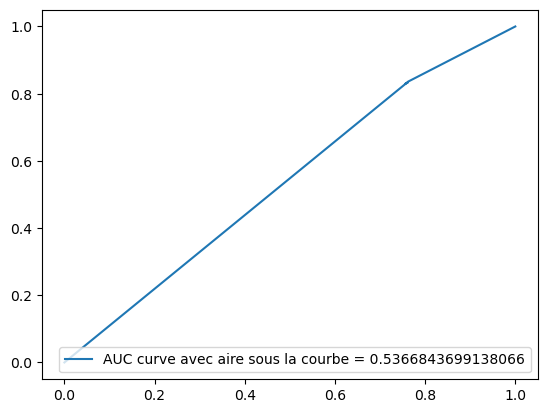

In [203]:
generate_auc_roc_curve(modele_logit_smote_fbeta, xtest)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


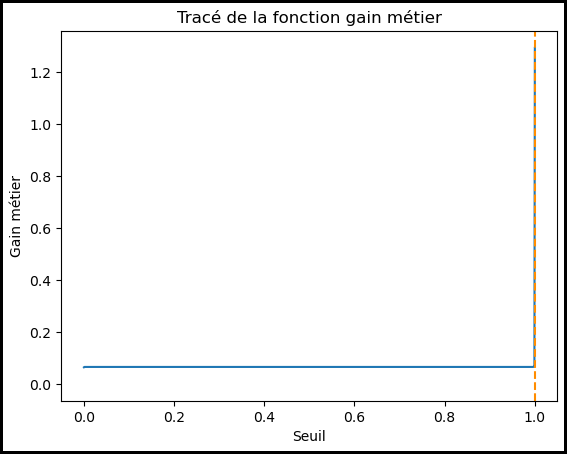

In [204]:
data_scores = affichage_gain_maximum(rl_smote_fbeta_random, data_scores, 'Regression logistique Smote avec fBeta')

In [205]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29


# Random Forest

## Avec xtrain

In [206]:
from sklearn.ensemble import RandomForestClassifier
regr_baseline_xtrain = RandomForestClassifier(n_estimators=200, min_samples_split=5, min_samples_leaf=2, max_features='auto', random_state=0)
regr_baseline_xtrain = regr_baseline_xtrain.fit(xtrain[features], ytrain)

In [207]:
ytest_pred_rand_xtrain = regr_baseline_xtrain.predict(xtest[features])

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


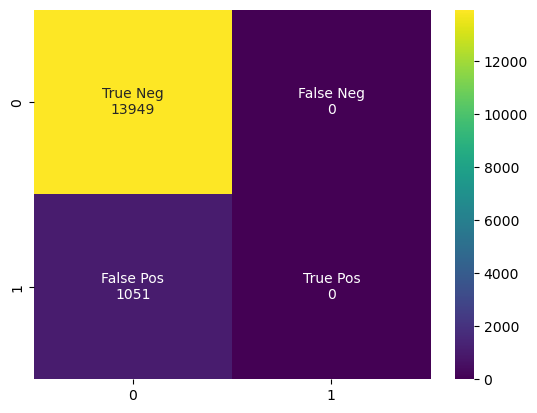

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [208]:
mesure_performance_modele(ytest, ytest_pred_rand_xtrain)

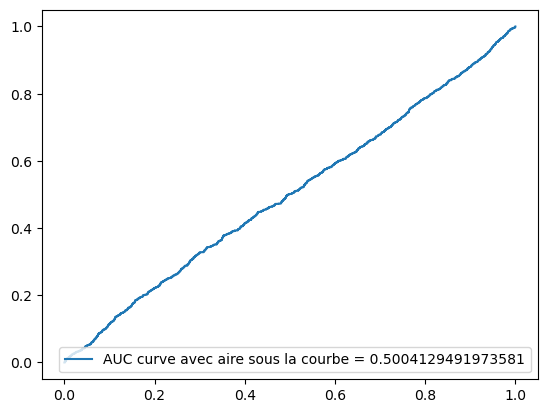

In [209]:
generate_auc_roc_curve(regr_baseline_xtrain , xtest)

### Amélioration avec Auc

In [210]:
# Number of trees in random forest
n_estimators = [50,100, 200, 300, 400, 500, 1000]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [5, 7, 9, 10, 14, None]
#max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
#bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               }

In [211]:
rf_auc = RandomForestClassifier()
rf_auc_random = RandomizedSearchCV(estimator = rf_auc, param_distributions = random_grid, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rf_auc_random.fit(xtrain[features], ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 7, 9, 10, 14, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [212]:
modele_rf_auc = RandomForestClassifier(**rf_auc_random.best_params_)
modele_rf_auc.fit(xtrain[features], ytrain)

RandomForestClassifier(max_depth=10, min_samples_leaf=4, n_estimators=400)

In [213]:
ytest_pred_rf_auc = modele_rf_auc.predict(xtest[features])

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


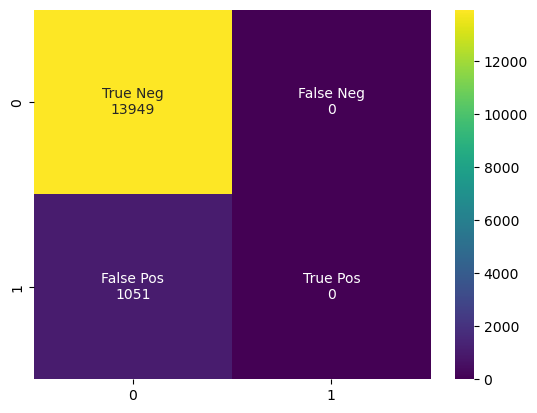

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [214]:
mesure_performance_modele(ytest, ytest_pred_rf_auc) 

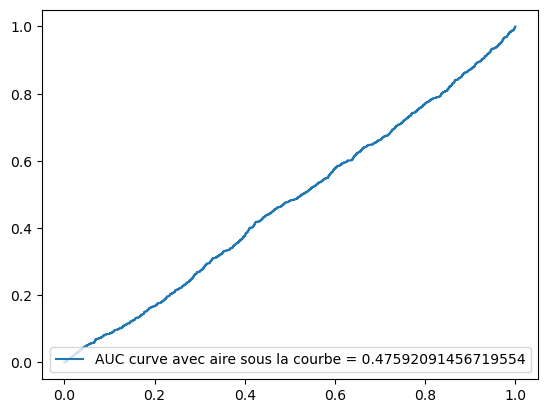

In [215]:
generate_auc_roc_curve(rf_auc_random , xtest)

Seuil qui conduit au maximum de la fonction gain métier : 0.226
Valeur maximum de la fonction gain métier : 1.3


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1050,1


TP :  1
TN :  13949
FP :  0
FN :  1050
**********************************************************
Precision : 1.0
recall : 0.0009514747859181732


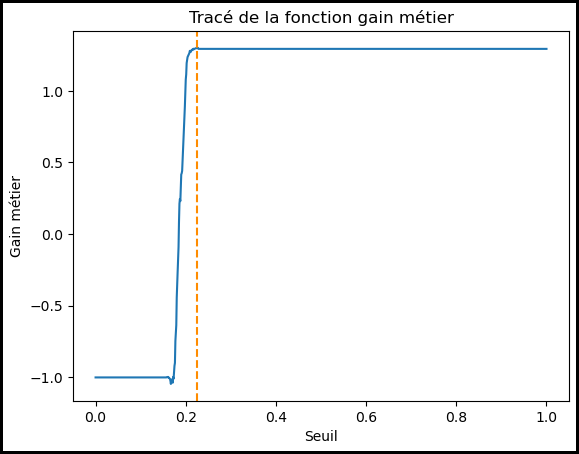

In [216]:
data_scores = affichage_gain_maximum(rf_auc_random, data_scores, 'Random Forest Xtrain avec AUC' )

In [217]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30


### Amélioration avec f1

In [218]:
rf_f1 = RandomForestClassifier()
rf_f1_random = RandomizedSearchCV(estimator = rf_f1, param_distributions = random_grid, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rf_f1_random.fit(xtrain[features], ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 7, 9, 10, 14, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, scoring='f1', verbose=2)

In [219]:
modele_rf_f1 = RandomForestClassifier(**rf_f1_random.best_params_)
modele_rf_f1.fit(xtrain[features], ytrain)

RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200)

In [220]:
ytest_pred_rf_f1 = modele_rf_f1.predict(xtest[features])

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


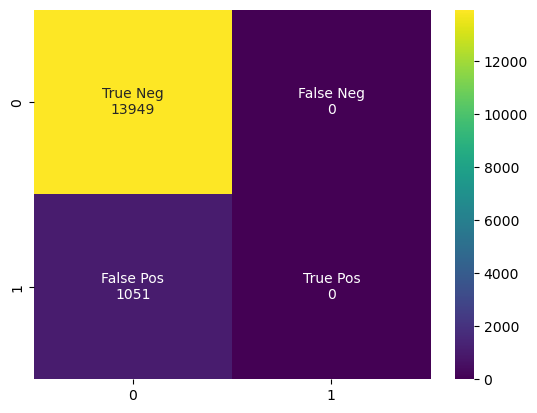

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [221]:
mesure_performance_modele(ytest, ytest_pred_rf_f1) 

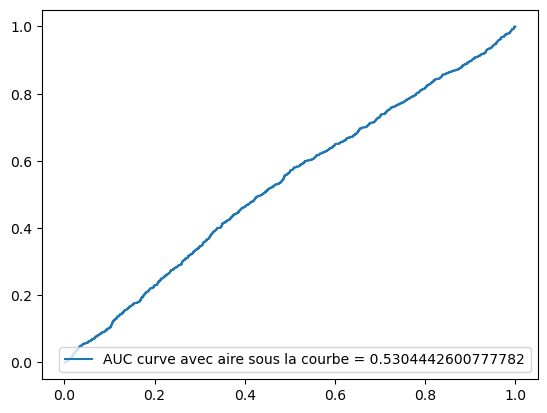

In [222]:
generate_auc_roc_curve(rf_f1_random , xtest)

Seuil qui conduit au maximum de la fonction gain métier : 0.338
Valeur maximum de la fonction gain métier : 1.31


,Predicted 0,Predicted 1
Actual 0,13481,468
Actual 1,1002,49


TP :  49
TN :  13481
FP :  468
FN :  1002
**********************************************************
Precision : 0.09477756286266925
recall : 0.046622264509990484


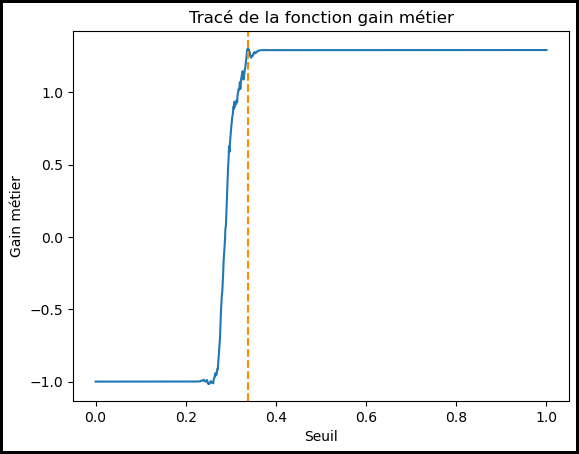

In [223]:
data_scores = affichage_gain_maximum(rf_f1_random, data_scores, 'Random Forest Xtrain avec f1'  )

In [224]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31


## Avec smote

In [225]:
#from sklearn.ensemble import RandomForestClassifier
regr_baseline_1 = RandomForestClassifier(n_estimators=200, min_samples_split=5, min_samples_leaf=2, max_features='auto', random_state=0)
regr_baseline_1 = regr_baseline_1.fit(X_sm_train, y_sm_train)

In [226]:
#ytrain_pred_rand = regr_baseline_1.predict(X_sm_train)
ytest_pred_rand = regr_baseline_1.predict(xtest[features])

### Mesures de la performance du modèle

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


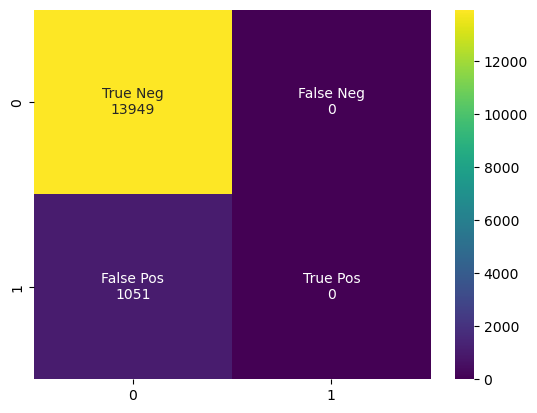

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [227]:
mesure_performance_modele(ytest, ytest_pred_rand) 

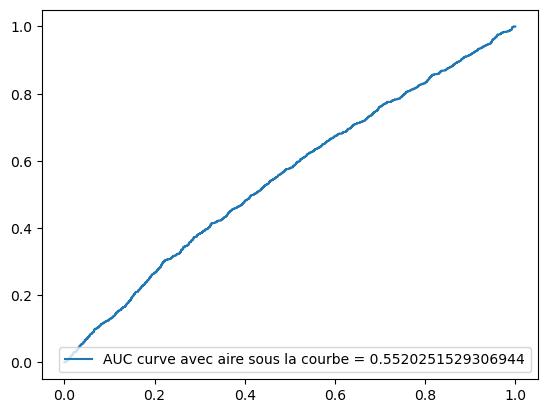

In [228]:
generate_auc_roc_curve(regr_baseline_1, xtest[features])

In [229]:
np.unique(ytest_pred_rand)

array([0.])

### Amélioration du modèle

RandomTreeClassifier hyperparameter tuning by RandomizedSearchCV

[Source : https://www.kaggle.com/code/mohitsital/random-forest-hyperparameter-tuning/notebook]

In [230]:
'''from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in range(200,600,100)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 3)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)'''

"from sklearn.model_selection import RandomizedSearchCV\n\n# Number of trees in random forest\nn_estimators = [int(x) for x in range(200,600,100)]\n# Number of features to consider at every split\nmax_features = ['auto', 'sqrt']\n# Maximum number of levels in tree\nmax_depth = [int(x) for x in np.linspace(10, 110, num = 3)]\nmax_depth.append(None)\n# Minimum number of samples required to split a node\nmin_samples_split = [2, 5, 10]\n# Minimum number of samples required at each leaf node\nmin_samples_leaf = [1, 2, 4]\n# Method of selecting samples for training each tree\nbootstrap = [True, False]\n# Create the random grid\nrandom_grid = {'n_estimators': n_estimators,\n               'max_features': max_features,\n               'max_depth': max_depth,\n               'min_samples_split': min_samples_split,\n               'min_samples_leaf': min_samples_leaf,\n               'bootstrap': bootstrap}\nprint(random_grid)"

Training parameter grid by RandomizedSearchCV

Les arguments les plus importants dans RandomizedSearchCV sont n_iter, qui contrôle le nombre de combinaisons différentes à essayer, et cv qui est le nombre de plis à utiliser pour la validation croisée (nous utilisons respectivement 10 et 3). Plus d'itérations couvriront un espace de recherche plus large et plus de plis cv réduisent les risques de surajustement, mais augmenter chacun augmentera le temps d'exécution. L'apprentissage automatique est un domaine de compromis, et la performance par rapport au temps est l'un des plus fondamentaux.

### Avec AUC

In [231]:
rf = RandomForestClassifier()
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rf_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 7, 9, 10, 14, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, scoring='roc_auc', verbose=2)

Best parameters

In [232]:
rf_random.best_params_

{'n_estimators': 300,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 14}

In [233]:
regr_baseline_2 = RandomForestClassifier(**rf_random.best_params_)#n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features='sqrt', max_depth=60, bootstrap= False,random_state=0)
regr_baseline_2 = regr_baseline_2.fit(X_sm_train, y_sm_train)

In [234]:
#ytrain_pred_rand_2 = regr_baseline_2.predict(X_sm_train)
ytest_pred_rand_2 = regr_baseline_2.predict(xtest[features])

#### Mesures de la performance du modèle

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


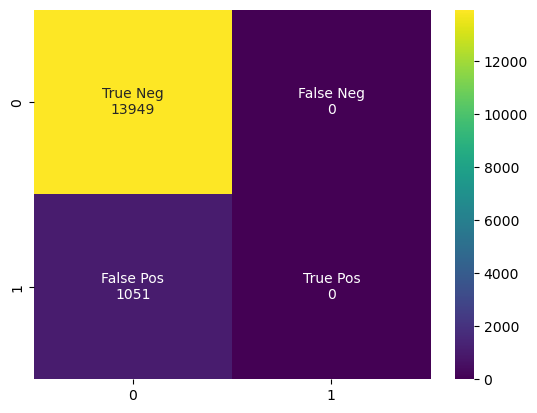

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [235]:
mesure_performance_modele(ytest, ytest_pred_rand_2)

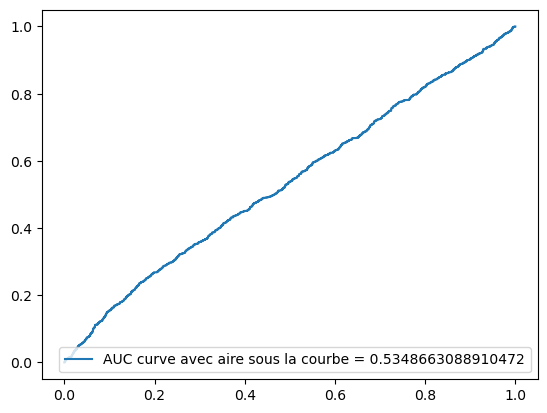

In [236]:
generate_auc_roc_curve(regr_baseline_2, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.47200000000000003
Valeur maximum de la fonction gain métier : 1.3


,Predicted 0,Predicted 1
Actual 0,13944,5
Actual 1,1050,1


TP :  1
TN :  13944
FP :  5
FN :  1050
**********************************************************
Precision : 0.16666666666666666
recall : 0.0009514747859181732


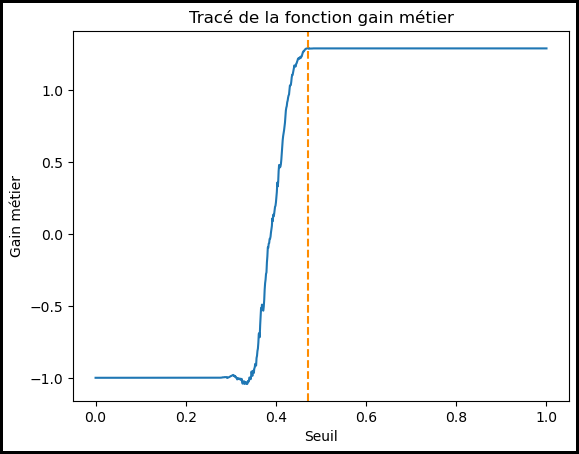

In [237]:
data_scores = affichage_gain_maximum(rf_random, data_scores, 'Random Forest Smote avec AUC')

In [238]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30


### Avec f1_score

In [239]:
rf_f1_2 = RandomForestClassifier()
rf_f1_2_random = RandomizedSearchCV(estimator = rf_f1_2, param_distributions = random_grid, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rf_f1_2_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 7, 9, 10, 14, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, scoring='f1', verbose=2)

In [240]:
rf_f1_2_random.best_params_

{'n_estimators': 300,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 14}

In [241]:
regr_baseline_3 = RandomForestClassifier(**rf_f1_2_random.best_params_)
regr_baseline_3 = regr_baseline_3.fit(X_sm_train, y_sm_train)

In [242]:
ytest_pred_rand_3 = regr_baseline_3.predict(xtest[features])

#### Mesures de la performance du modèle

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


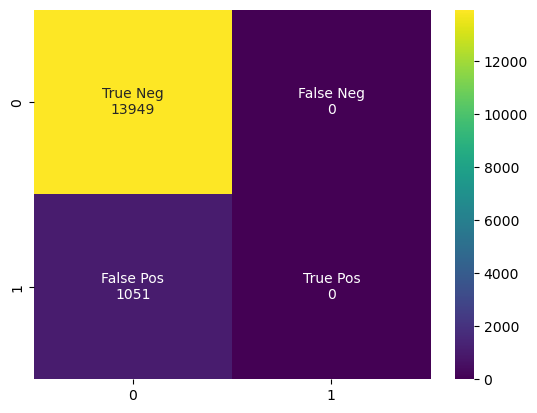

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [243]:
mesure_performance_modele(ytest, ytest_pred_rand_3)

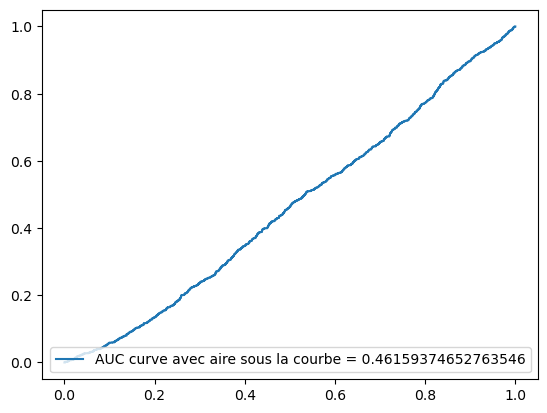

In [244]:
generate_auc_roc_curve(regr_baseline_3, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.465
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


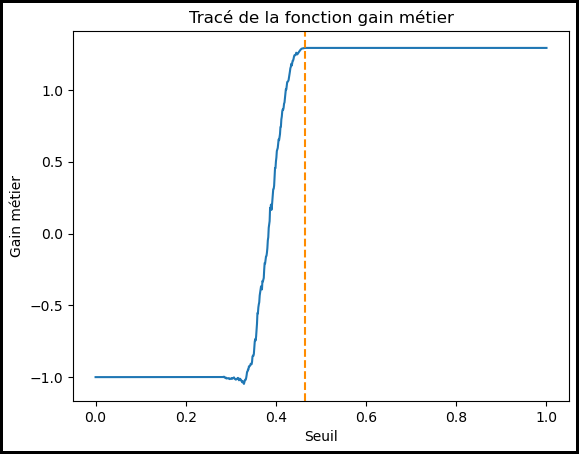

In [245]:
data_scores = affichage_gain_maximum(rf_f1_2_random, data_scores, 'Random Forest Smote avec f1')

In [246]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29


### Avec fbeta_score

In [247]:
rf_fbeta = RandomForestClassifier()
rf_fbeta_random = RandomizedSearchCV(estimator = rf_fbeta, param_distributions = random_grid, scoring = make_scorer(fbeta_score, beta=10), n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rf_fbeta_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 7, 9, 10, 14, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 200, 300, 400,
                                                         500, 1000]},
                   random_state=42, scoring=make_scorer(fbeta_score, beta=10),
                   verbose=2)

In [248]:
rf_fbeta_random.best_params_

{'n_estimators': 300,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 14}

In [249]:
regr_baseline_4 = RandomForestClassifier(**rf_fbeta_random.best_params_)
regr_baseline_4 = regr_baseline_4.fit(X_sm_train, y_sm_train)

In [250]:
ytest_pred_rand_4 = regr_baseline_4.predict(xtest[features])

#### Mesure de la performance

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


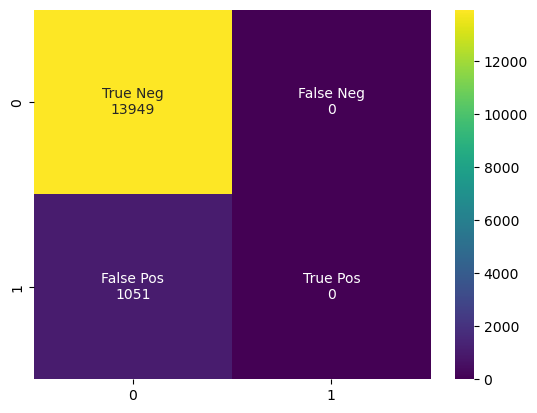

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [251]:
mesure_performance_modele(ytest, ytest_pred_rand_4)

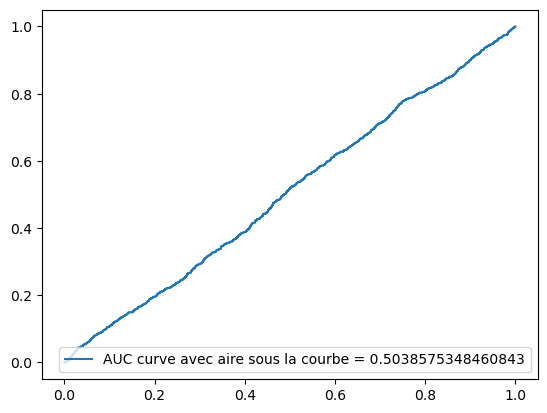

In [252]:
generate_auc_roc_curve(regr_baseline_4, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.443
Valeur maximum de la fonction gain métier : 1.31


,Predicted 0,Predicted 1
Actual 0,13837,112
Actual 1,1037,14


TP :  14
TN :  13837
FP :  112
FN :  1037
**********************************************************
Precision : 0.1111111111111111
recall : 0.013320647002854425


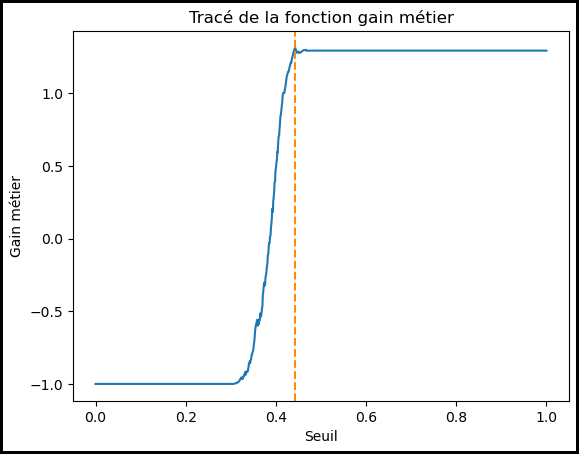

In [253]:
data_scores = affichage_gain_maximum(rf_fbeta_random, data_scores, 'Random Forest Smote avec AUC' )

In [254]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


# SVC

Nous avons choisi de ne pas entraîner ce modèle car il prenait beaucoup trop de temps à être exécuté. 

# Gradient boosting Classifier

## Avec xtrain 

In [255]:
from sklearn import ensemble
from sklearn.ensemble import GradientBoostingClassifier

reg_grad_boost_xtrain = GradientBoostingClassifier(n_estimators=10, learning_rate=1.0, max_depth=10, random_state=0)
reg_grad_boost_xtrain= reg_grad_boost_xtrain.fit(xtrain[features], ytrain)

In [256]:
ytest_pred_grad_xtrain = reg_grad_boost_xtrain.predict(xtest[features])

### Mesure de la performance du modèle

******Matrice de confusion********
[[ 1369 12580]
 [   83   968]]


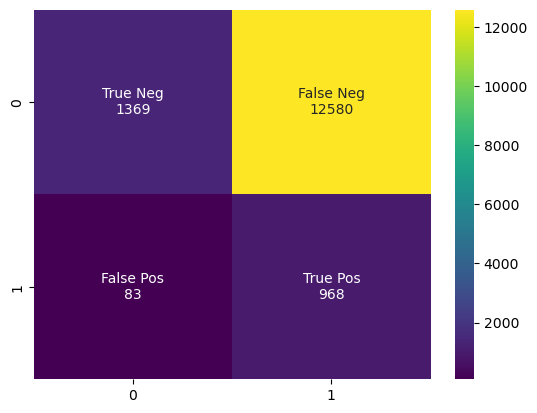

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.1558
Precision =  0.5071435630156139
Recall =  0.509585414421531
F1_Score =  0.13261182272758407
******Mesures de performance avec beta = 10********
Accuracy =  0.1558
Precision =  0.5071435630156139
Recall =  0.509585414421531
Fbeta_Score =  0.8240172611422021
******Mesures de performance avec beta = 5********
Accuracy =  0.1558
Precision =  0.5071435630156139
Recall =  0.509585414421531
Fbeta_Score =  0.63199658488813


In [257]:
mesure_performance_modele(ytest, ytest_pred_grad_xtrain)

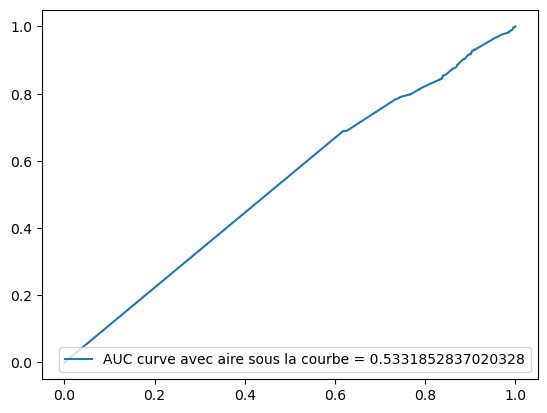

In [258]:
generate_auc_roc_curve(reg_grad_boost_xtrain , xtest)

In [259]:
params_2 = { "random_state":[0, 1, 3, 5],
             "max_depth": [ 5,7,9, 10, 14],
             "min_samples_split": [5,10, 30],
            "learning_rate":[0.1,  0.01, 1],
            "n_estimators": [100, 200, 400]
           }

### Amélioration du modèle avec auc

In [260]:
rgb_auc = GradientBoostingClassifier()
rgb_auc_random = RandomizedSearchCV(estimator = rgb_auc, param_distributions = params_2, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rgb_auc_random.fit(xtrain[features], ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.01, 1],
                                        'max_depth': [5, 7, 9, 10, 14],
                                        'min_samples_split': [5, 10, 30],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [0, 1, 3, 5]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [261]:
rgb_auc_random.best_params_

{'random_state': 1,
 'n_estimators': 400,
 'min_samples_split': 5,
 'max_depth': 10,
 'learning_rate': 0.01}

In [262]:
modele_rgb_auc = RandomForestClassifier(random_state = 1, n_estimators = 400,  min_samples_split = 5, max_depth = 10)#modele_rgb_auc = RandomForestClassifier(**rgb_auc_random.best_params_)
modele_rgb_auc.fit(xtrain[features], ytrain)

RandomForestClassifier(max_depth=10, min_samples_split=5, n_estimators=400,
                       random_state=1)

In [263]:
ytest_pred_rgb_auc = modele_rgb_auc.predict(xtest[features])

#### Mesures de performance du modèle

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


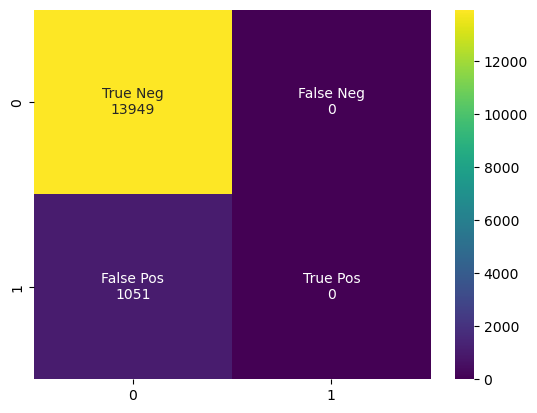

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [264]:
mesure_performance_modele(ytest, ytest_pred_rgb_auc)

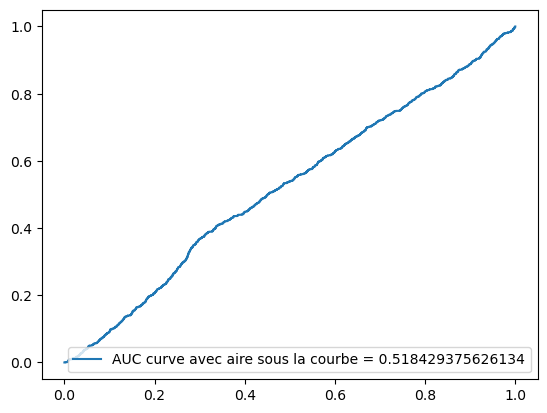

In [265]:
generate_auc_roc_curve(modele_rgb_auc , xtest)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


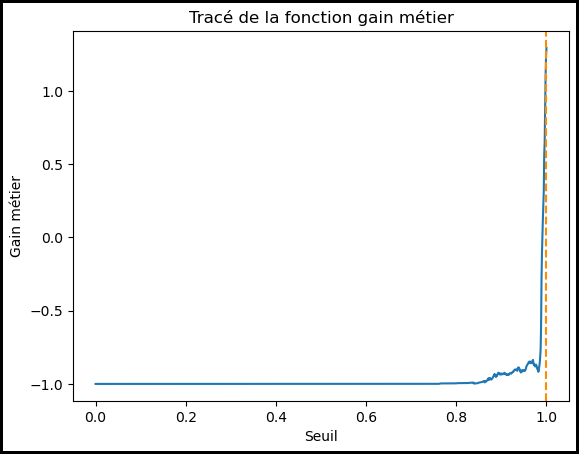

In [266]:
data_scores = affichage_gain_maximum(rgb_auc_random, data_scores, 'Gradient Boosting Classifier Xtrain avec AUC')

In [267]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### Amélioration du modèle avec f1

In [268]:
rgb_f1 = GradientBoostingClassifier()
rgb_f1_random = RandomizedSearchCV(estimator = rgb_f1, param_distributions = params_2, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rgb_f1_random.fit(xtrain[features], ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.01, 1],
                                        'max_depth': [5, 7, 9, 10, 14],
                                        'min_samples_split': [5, 10, 30],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [0, 1, 3, 5]},
                   random_state=42, scoring='f1', verbose=2)

In [269]:
rgb_f1_random.best_params_

{'random_state': 3,
 'n_estimators': 400,
 'min_samples_split': 10,
 'max_depth': 7,
 'learning_rate': 1}

In [270]:
modele_rgb_f1 =  RandomForestClassifier(random_state = 3, n_estimators = 400,  min_samples_split = 10, max_depth = 7)
modele_rgb_f1.fit(xtrain[features], ytrain)

RandomForestClassifier(max_depth=7, min_samples_split=10, n_estimators=400,
                       random_state=3)

In [271]:
ytest_pred_rgb_f1 = modele_rgb_f1.predict(xtest[features])

#### Mesures de la performance du modèle

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


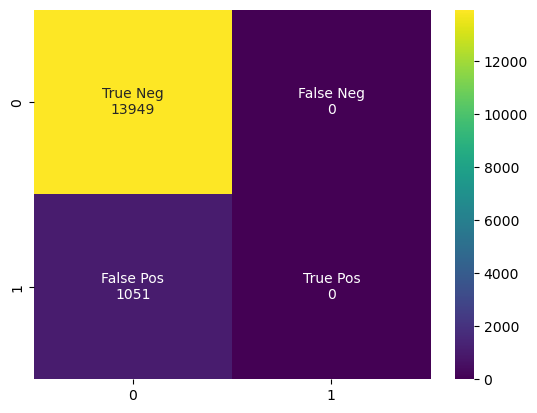

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [272]:
mesure_performance_modele(ytest, ytest_pred_rgb_f1)

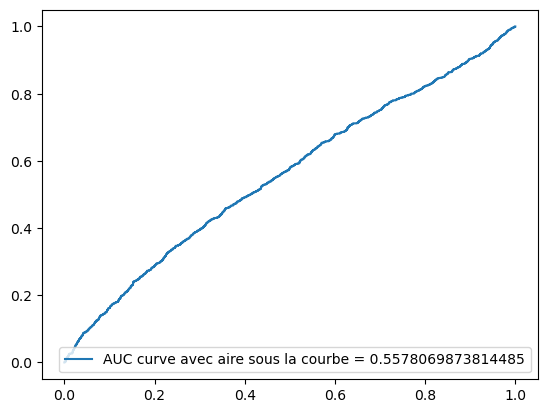

In [273]:
generate_auc_roc_curve(modele_rgb_f1 , xtest)

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


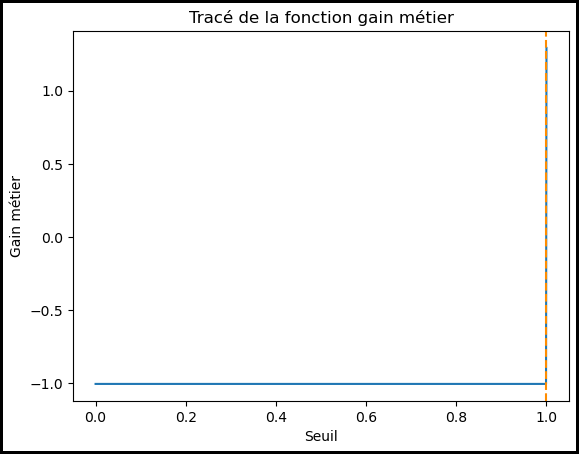

In [274]:
data_scores = affichage_gain_maximum(rgb_f1_random , data_scores, 'Gradient Boosting Classifier Xtrain avec f1')

In [275]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


## Avec smote

In [276]:
reg_grad_boost = GradientBoostingClassifier(n_estimators=10, learning_rate=1.0, max_depth=1, random_state=0)
reg_grad_boost= reg_grad_boost.fit(X_sm_train, y_sm_train)

In [277]:
ytest_pred_grad = reg_grad_boost.predict(xtest[features])

******Matrice de confusion********
[[10824  3125]
 [  785   266]]


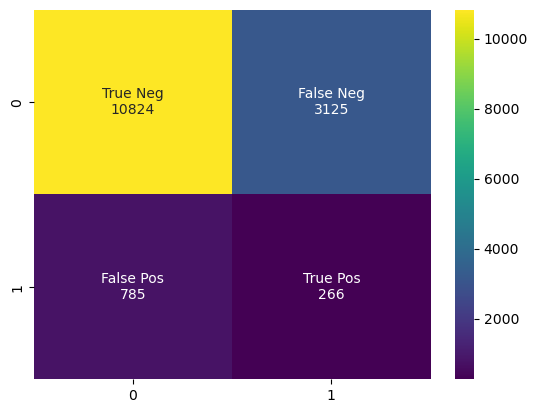

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.7393333333333333
Precision =  0.5054114935739538
Recall =  0.5145309483050222
F1_Score =  0.11976587122917605
******Mesures de performance avec beta = 10********
Accuracy =  0.7393333333333333
Precision =  0.5054114935739538
Recall =  0.5145309483050222
Fbeta_Score =  0.24763344424883174
******Mesures de performance avec beta = 5********
Accuracy =  0.7393333333333333
Precision =  0.5054114935739538
Recall =  0.5145309483050222
Fbeta_Score =  0.23312883435582826


In [278]:
mesure_performance_modele(ytest, ytest_pred_grad)

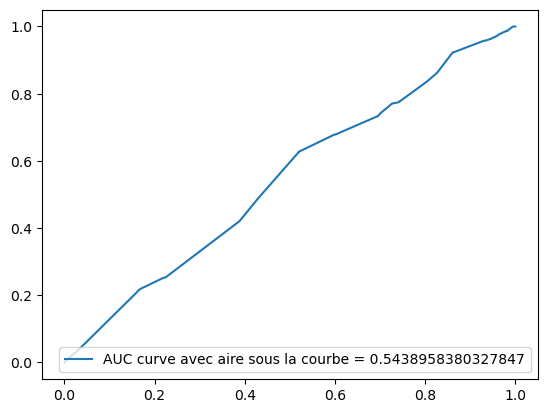

In [279]:
generate_auc_roc_curve(reg_grad_boost, xtest[features])

### Amélioration du modèle

#### Score AUC

In [280]:
rgb_auc_smote = GradientBoostingClassifier()
rgb_auc_smote_random = RandomizedSearchCV(estimator = rgb_auc_smote, param_distributions = params_2, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
rgb_auc_smote_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.01, 1],
                                        'max_depth': [5, 7, 9, 10, 14],
                                        'min_samples_split': [5, 10, 30],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [0, 1, 3, 5]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [281]:
# print best parameter after tuning
rgb_auc_smote_random.best_params_

{'random_state': 1,
 'n_estimators': 200,
 'min_samples_split': 10,
 'max_depth': 14,
 'learning_rate': 1}

In [282]:
reg_grad_boost_2 = GradientBoostingClassifier(n_estimators=200, min_samples_split= 10, learning_rate=1, max_depth=14, random_state=1)
reg_grad_boost_2= reg_grad_boost_2.fit(X_sm_train, y_sm_train)

les meilleurs hyperparamètres

In [283]:
ytest_pred_reg_grad_boost_2 = reg_grad_boost_2.predict(xtest[features])

******Matrice de confusion********
[[    0 13949]
 [    0  1051]]


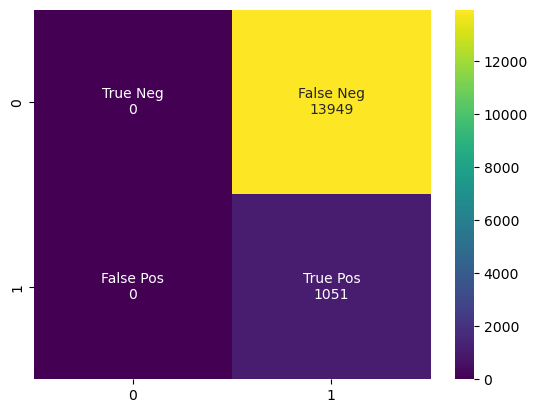

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
F1_Score =  0.13095757273690112
******Mesures de performance avec beta = 10********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.8838551207327227
******Mesures de performance avec beta = 5********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.6620472440944881


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [284]:
mesure_performance_modele(ytest, ytest_pred_reg_grad_boost_2)

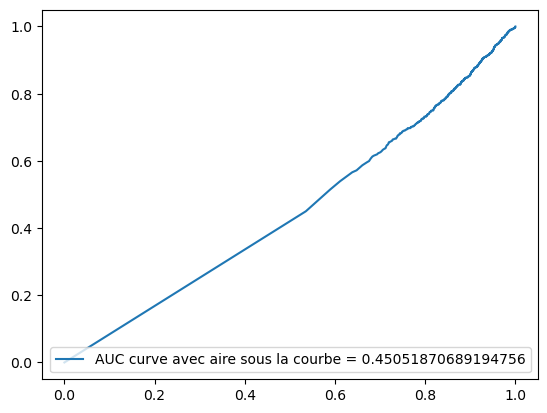

In [285]:
generate_auc_roc_curve(reg_grad_boost_2, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


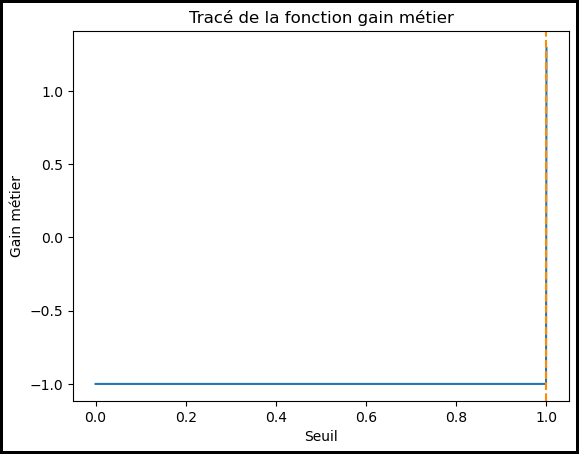

In [286]:
data_scores = affichage_gain_maximum(rgb_auc_smote_random, data_scores, 'Gradient Boosting Classifier Smote avec AUC')

In [287]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### f1 score

In [288]:
gbc =  GradientBoostingClassifier()
gbc_random = RandomizedSearchCV(estimator = gbc, param_distributions = params_2, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
gbc_random.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.01, 1],
                                        'max_depth': [5, 7, 9, 10, 14],
                                        'min_samples_split': [5, 10, 30],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [0, 1, 3, 5]},
                   random_state=42, scoring='f1', verbose=2)

In [289]:
gbc_random.best_params_

{'random_state': 1,
 'n_estimators': 200,
 'min_samples_split': 10,
 'max_depth': 14,
 'learning_rate': 1}

In [543]:
reg_grad_boost_3 = GradientBoostingClassifier(n_estimators=200, min_samples_split= 10, learning_rate=1, max_depth=14, random_state=1)
reg_grad_boost_3= reg_grad_boost_3.fit(X_sm_train, y_sm_train)

In [544]:
ytest_pred_reg_grad_boost_3 = reg_grad_boost_3.predict(xtest[features])

******Matrice de confusion********
[[    0 13949]
 [    0  1051]]


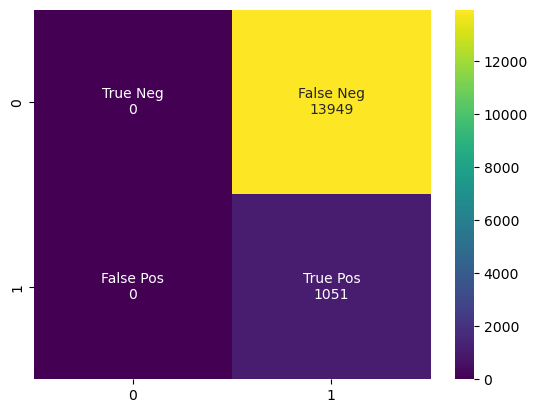

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
F1_Score =  0.13095757273690112
******Mesures de performance avec beta = 10********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.8838551207327227
******Mesures de performance avec beta = 5********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.6620472440944881


In [545]:
mesure_performance_modele(ytest, ytest_pred_reg_grad_boost_3)

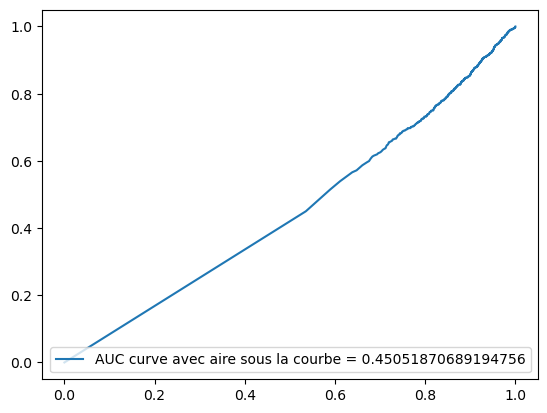

In [546]:
generate_auc_roc_curve(reg_grad_boost_3, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


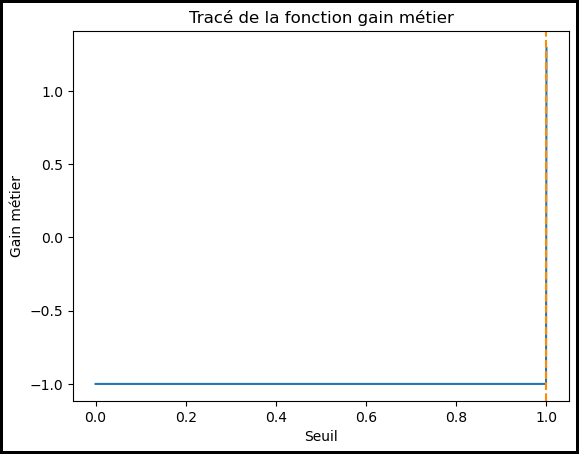

In [547]:
data_scores = affichage_gain_maximum(gbc_random, data_scores, 'Gradient Boosting Classifier Smote avec f1')

In [295]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### fbeta score

In [296]:
gbc_2 =  GradientBoostingClassifier()
gbc_random_2 = RandomizedSearchCV(estimator = gbc_2, param_distributions = params_2, scoring = make_scorer(fbeta_score, beta=10), n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
gbc_random_2.fit(X_sm_train, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.01, 1],
                                        'max_depth': [5, 7, 9, 10, 14],
                                        'min_samples_split': [5, 10, 30],
                                        'n_estimators': [100, 200, 400],
                                        'random_state': [0, 1, 3, 5]},
                   random_state=42, scoring=make_scorer(fbeta_score, beta=10),
                   verbose=2)

In [297]:
gbc_random_2.best_params_

{'random_state': 1,
 'n_estimators': 200,
 'min_samples_split': 10,
 'max_depth': 14,
 'learning_rate': 1}

In [298]:
modele_gbc_fbeta = GradientBoostingClassifier(**gbc_random_2.best_params_)
modele_gbc_fbeta.fit(X_sm_train, y_sm_train) 

GradientBoostingClassifier(learning_rate=1, max_depth=14, min_samples_split=10,
                           n_estimators=200, random_state=1)

In [299]:
ytest_pred_reg_grad_boost_4 = modele_gbc_fbeta.predict(xtest[features])

******Matrice de confusion********
[[    0 13949]
 [    0  1051]]


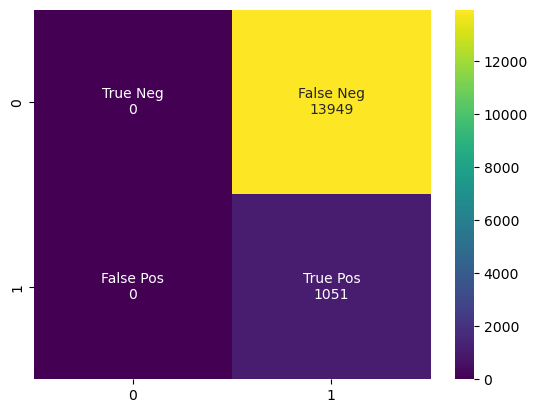

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
F1_Score =  0.13095757273690112
******Mesures de performance avec beta = 10********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.8838551207327227
******Mesures de performance avec beta = 5********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.6620472440944881


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [300]:
mesure_performance_modele(ytest, ytest_pred_reg_grad_boost_4 )

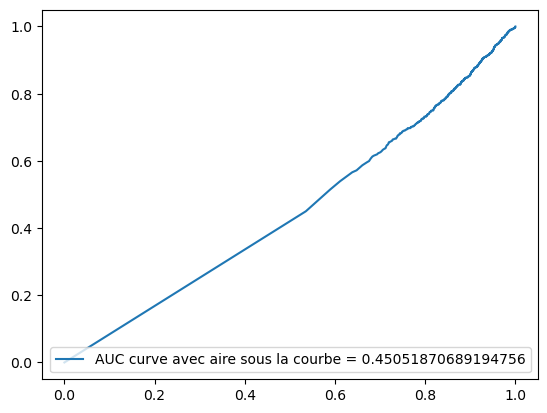

In [301]:
generate_auc_roc_curve(modele_gbc_fbeta, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 1.0
Valeur maximum de la fonction gain métier : 1.29


,Predicted 0,Predicted 1
Actual 0,13949,0
Actual 1,1051,0


TP :  0
TN :  13949
FP :  0
FN :  1051
**********************************************************
Precision : nan
recall : 0.0


C:\Users\laeti\AppData\Local\Temp\ipykernel_25804\2525112703.py:38: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = TP/(TP + FP)


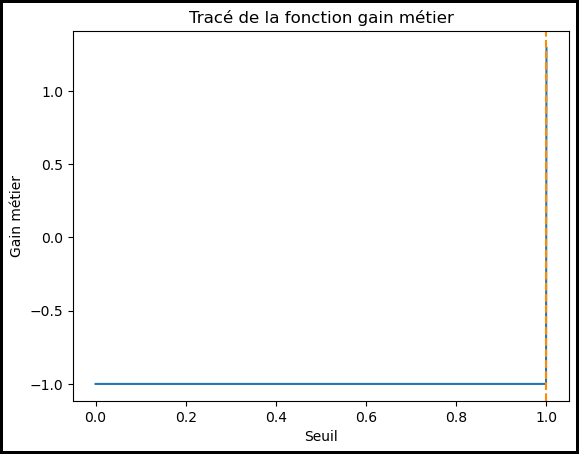

In [302]:
data_scores = affichage_gain_maximum(gbc_random_2, data_scores, 'Gradient Boosting Classifier Smote avec fBeta')

In [303]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


# Adaboost Classifier

## Avec xtrain

In [304]:
from sklearn.ensemble import AdaBoostClassifier

regr_ada_boo_xtrain = AdaBoostClassifier(n_estimators=100, random_state=0)
regr_ada_boo_xtrain  = regr_ada_boo_xtrain.fit(xtrain[features], ytrain)

In [305]:
ytest_ada_boo_xtrain  = regr_ada_boo_xtrain.predict(xtest[features])

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


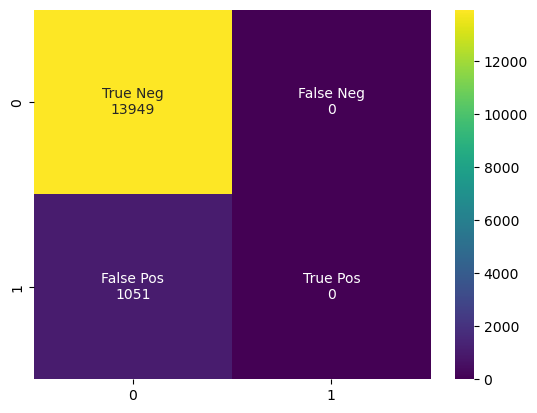

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [306]:
mesure_performance_modele(ytest, ytest_ada_boo_xtrain )

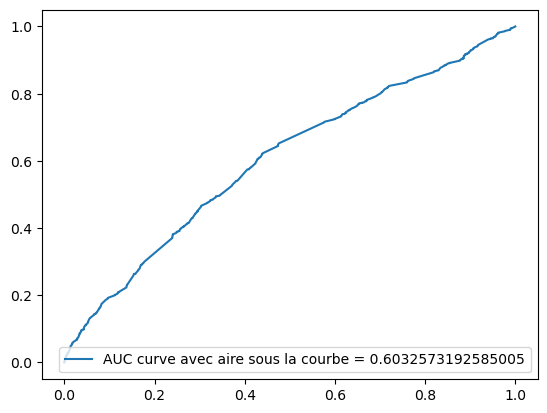

In [307]:
generate_auc_roc_curve(regr_ada_boo_xtrain, xtest[features])

### Amélioration du modèle

In [308]:
parametres_adaboost ={'n_estimators':[500,1000,2000],'learning_rate':[0.01,0.08,0.1],'random_state':[1]}

#### Avec le score AUC

In [309]:
adb_xtrain_auc =  AdaBoostClassifier()
adb_xtrain_auc_random = RandomizedSearchCV(estimator = adb_xtrain_auc, param_distributions = parametres_adaboost, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
adb_xtrain_auc_random.fit(xtrain[features], ytrain)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 9 candidates, totalling 45 fits


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.08, 0.1],
                                        'n_estimators': [500, 1000, 2000],
                                        'random_state': [1]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [310]:
modele_adb_xtrain_auc = GradientBoostingClassifier(**adb_xtrain_auc_random.best_params_)
modele_adb_xtrain_auc.fit(xtrain[features], ytrain)

GradientBoostingClassifier(learning_rate=0.08, n_estimators=500, random_state=1)

In [311]:
ytest_pred_adb_xtrain_auc = modele_adb_xtrain_auc.predict(xtest[features])

In [312]:
ytest_pred_adb_xtrain_auc

array([1., 1., 1., ..., 1., 1., 1.])

******Matrice de confusion********
[[    0 13949]
 [    0  1051]]


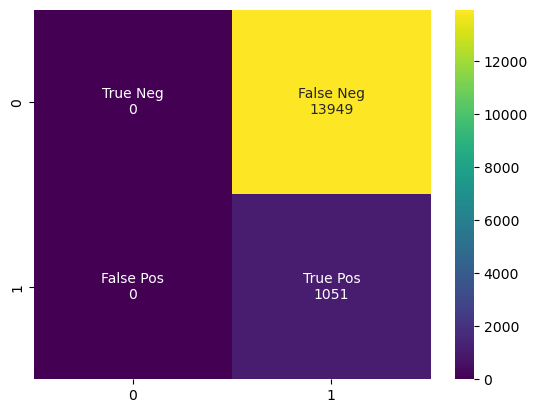

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
F1_Score =  0.13095757273690112
******Mesures de performance avec beta = 10********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.8838551207327227
******Mesures de performance avec beta = 5********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.6620472440944881


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [313]:
mesure_performance_modele(ytest, ytest_pred_adb_xtrain_auc)

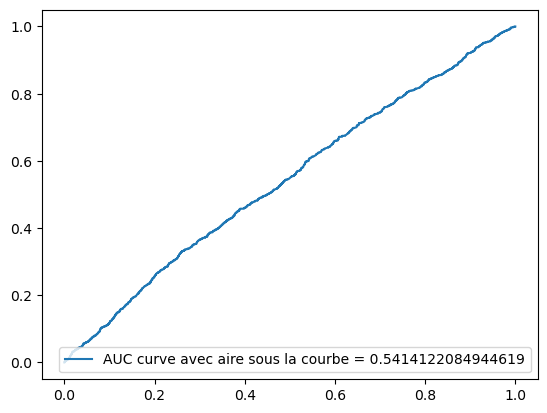

In [314]:
generate_auc_roc_curve( modele_adb_xtrain_auc, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.468
Valeur maximum de la fonction gain métier : 2.01


,Predicted 0,Predicted 1
Actual 0,12169,1780
Actual 1,766,285


TP :  285
TN :  12169
FP :  1780
FN :  766
**********************************************************
Precision : 0.13801452784503632
recall : 0.27117031398667935


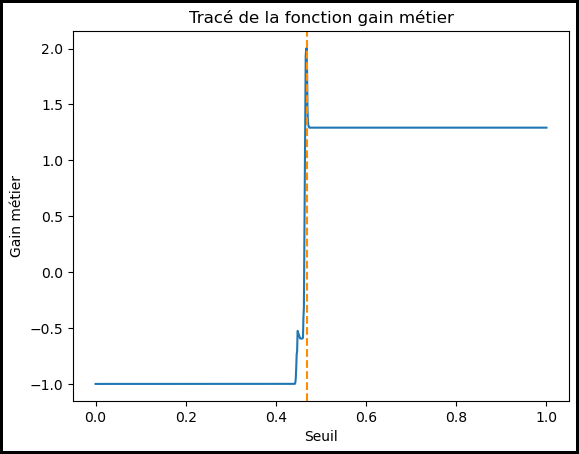

In [315]:
data_scores = affichage_gain_maximum(adb_xtrain_auc_random, data_scores, 'Adaboost Classifier Xtrain avec AUC')

In [316]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


#### Avec f1

In [317]:
adb_xtrain_f1 =  AdaBoostClassifier()
adb_xtrain_f1_random = RandomizedSearchCV(estimator = adb_xtrain_f1, param_distributions = parametres_adaboost, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
adb_xtrain_f1_random.fit(xtrain[features], ytrain)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 9 candidates, totalling 45 fits


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.08, 0.1],
                                        'n_estimators': [500, 1000, 2000],
                                        'random_state': [1]},
                   random_state=42, scoring='f1', verbose=2)

In [318]:
modele_adb_xtrain_f1 = GradientBoostingClassifier(**adb_xtrain_f1_random.best_params_)
modele_adb_xtrain_f1.fit(xtrain[features], ytrain)

GradientBoostingClassifier(n_estimators=2000, random_state=1)

In [319]:
ytest_pred_adb_xtrain_f1 = modele_adb_xtrain_f1.predict(xtest[features])

******Matrice de confusion********
[[    0 13949]
 [    0  1051]]


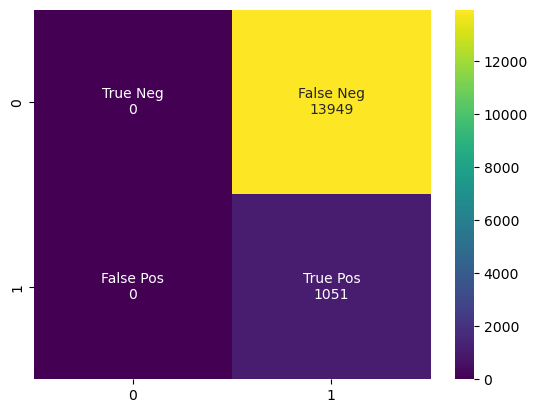

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
F1_Score =  0.13095757273690112
******Mesures de performance avec beta = 10********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.8838551207327227
******Mesures de performance avec beta = 5********
Accuracy =  0.07006666666666667
Precision =  0.03503333333333333
Recall =  0.5
Fbeta_Score =  0.6620472440944881


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [320]:
mesure_performance_modele(ytest, ytest_pred_adb_xtrain_f1)

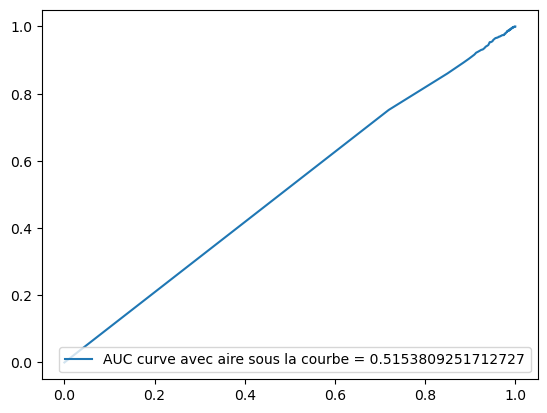

In [321]:
generate_auc_roc_curve( modele_adb_xtrain_f1, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.457
Valeur maximum de la fonction gain métier : 1.48


,Predicted 0,Predicted 1
Actual 0,13605,344
Actual 1,988,63


TP :  63
TN :  13605
FP :  344
FN :  988
**********************************************************
Precision : 0.1547911547911548
recall : 0.05994291151284491


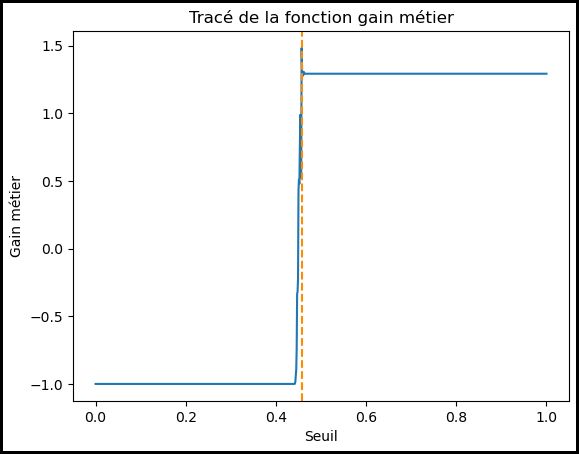

In [322]:
data_scores = affichage_gain_maximum(adb_xtrain_f1_random, data_scores, 'Adaboost Classifier Xtrain avec f1')

In [323]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


## Avec smote

In [324]:
regr_ada_boo = AdaBoostClassifier(n_estimators=100, random_state=0)
regr_ada_boo  = regr_ada_boo.fit(X_sm_train, y_sm_train)

In [325]:
ytest_ada_boo = regr_ada_boo.predict(xtest[features])

******Matrice de confusion********
[[8277 5672]
 [ 517  534]]


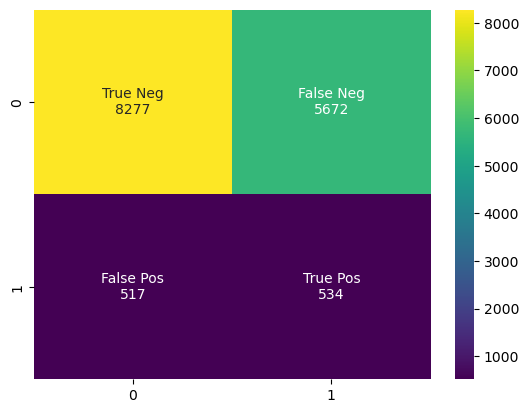

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.5874
Precision =  0.5136278390086816
Recall =  0.5507317024591214
F1_Score =  0.14716825134353037
******Mesures de performance avec beta = 10********
Accuracy =  0.5874
Precision =  0.5136278390086816
Recall =  0.5507317024591214
Fbeta_Score =  0.4845560886205596
******Mesures de performance avec beta = 5********
Accuracy =  0.5874
Precision =  0.5136278390086816
Recall =  0.5507317024591214
Fbeta_Score =  0.42744989378405834


In [326]:
mesure_performance_modele(ytest, ytest_ada_boo)

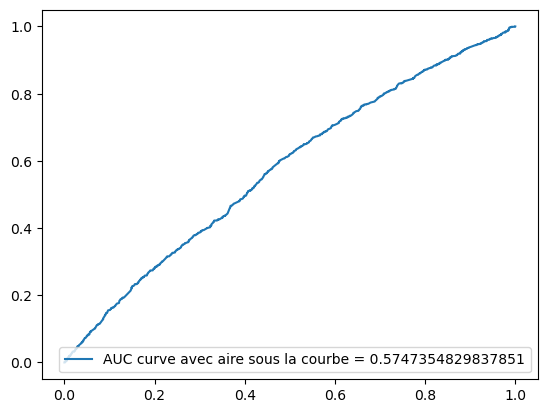

In [327]:
generate_auc_roc_curve(regr_ada_boo, xtest[features])

## Amélioration du modèle

### Avec le auc score

In [328]:
#parametres_adaboost ={'n_estimators':[500,1000,2000],'learning_rate':[0.001,0.01,0.1],'random_state':[1]}

In [329]:
#grid = GridSearchCV(estimator =regr_ada_boo, param_grid = parametres_adaboost, scoring = 'roc_auc', cv=5, probabilty = True)
#grid.fit(X_sm_train, y_sm_train)

adb =  AdaBoostClassifier()
adb_random = RandomizedSearchCV(estimator = adb, param_distributions = parametres_adaboost, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
adb_random.fit(X_sm_train, y_sm_train)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 9 candidates, totalling 45 fits


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.08, 0.1],
                                        'n_estimators': [500, 1000, 2000],
                                        'random_state': [1]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [330]:
adb_random.best_params_

{'random_state': 1, 'n_estimators': 2000, 'learning_rate': 0.1}

In [331]:
regr_ada_boo_2 = AdaBoostClassifier(n_estimators=2000, learning_rate = 0.1, random_state=1)
regr_ada_boo_2  = regr_ada_boo_2.fit(X_sm_train, y_sm_train)

In [332]:
ytest_ada_boo_2 = regr_ada_boo_2.predict(xtest[features])

******Matrice de confusion********
[[11836  2113]
 [  795   256]]


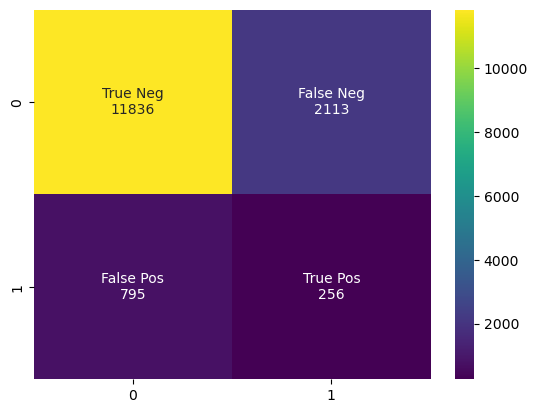

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
F1_Score =  0.1497076023391813
******Mesures de performance avec beta = 10********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
Fbeta_Score =  0.24059030976374585
******Mesures de performance avec beta = 5********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
Fbeta_Score =  0.23236978075687756


In [333]:
mesure_performance_modele(ytest, ytest_ada_boo_2)

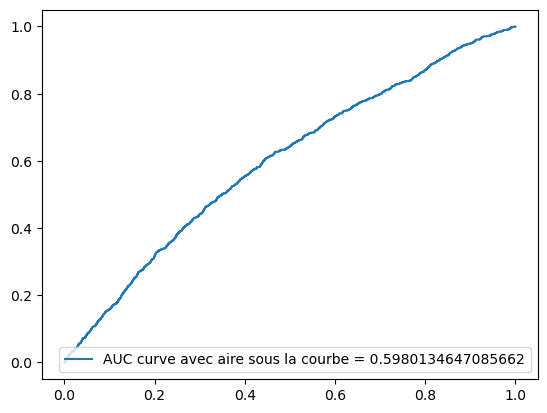

In [334]:
generate_auc_roc_curve(regr_ada_boo_2, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.5
Valeur maximum de la fonction gain métier : 1.59


,Predicted 0,Predicted 1
Actual 0,11836,2113
Actual 1,795,256


TP :  256
TN :  11836
FP :  2113
FN :  795
**********************************************************
Precision : 0.10806247361756015
recall : 0.24357754519505234


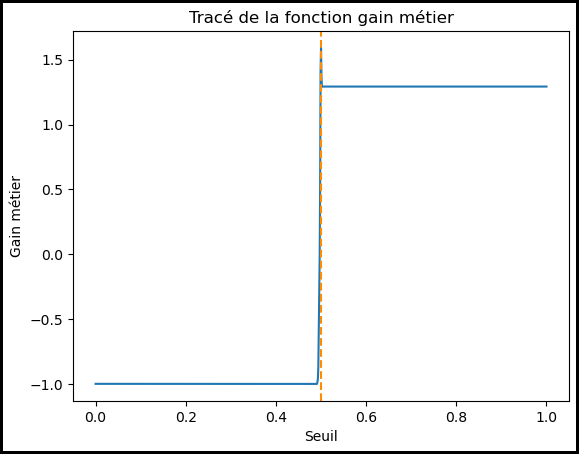

In [335]:
data_scores = affichage_gain_maximum(adb_random, data_scores , 'Adaboost Classifier Smote avec AUC')

In [336]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### Avec f1_score

In [337]:
adb_2 =  AdaBoostClassifier()
adb_random_2 = RandomizedSearchCV(estimator = adb_2, param_distributions = parametres_adaboost, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
adb_random_2.fit(X_sm_train, y_sm_train)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 9 candidates, totalling 45 fits


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.08, 0.1],
                                        'n_estimators': [500, 1000, 2000],
                                        'random_state': [1]},
                   random_state=42, scoring='f1', verbose=2)

In [338]:
adb_random_2.best_params_

{'random_state': 1, 'n_estimators': 2000, 'learning_rate': 0.1}

In [339]:
regr_ada_boo_3 = AdaBoostClassifier(n_estimators=2000, learning_rate = 0.1, random_state=1)
regr_ada_boo_3  = regr_ada_boo_3.fit(X_sm_train, y_sm_train)

In [340]:
ytest_ada_boo_3 = regr_ada_boo_3.predict(xtest[features])

******Matrice de confusion********
[[11836  2113]
 [  795   256]]


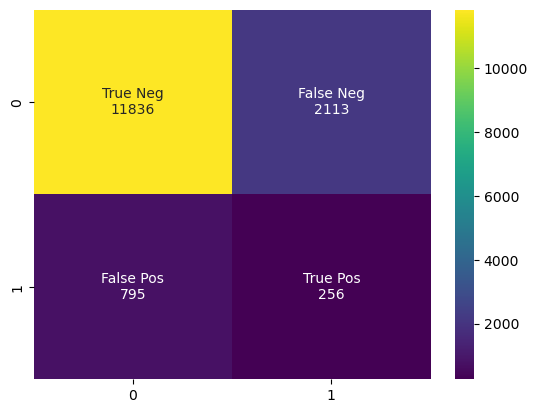

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
F1_Score =  0.1497076023391813
******Mesures de performance avec beta = 10********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
Fbeta_Score =  0.24059030976374585
******Mesures de performance avec beta = 5********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
Fbeta_Score =  0.23236978075687756


In [341]:
mesure_performance_modele(ytest, ytest_ada_boo_3)

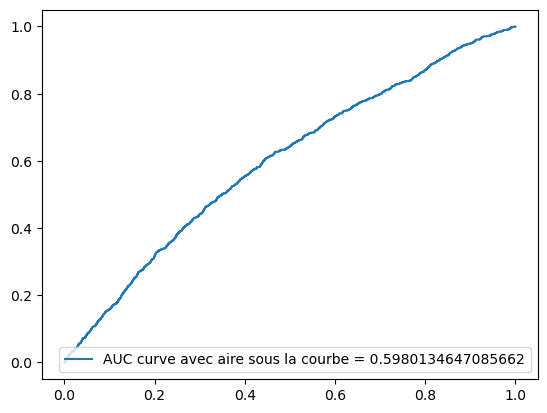

In [342]:
generate_auc_roc_curve(regr_ada_boo_3, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.5
Valeur maximum de la fonction gain métier : 1.59


,Predicted 0,Predicted 1
Actual 0,11836,2113
Actual 1,795,256


TP :  256
TN :  11836
FP :  2113
FN :  795
**********************************************************
Precision : 0.10806247361756015
recall : 0.24357754519505234


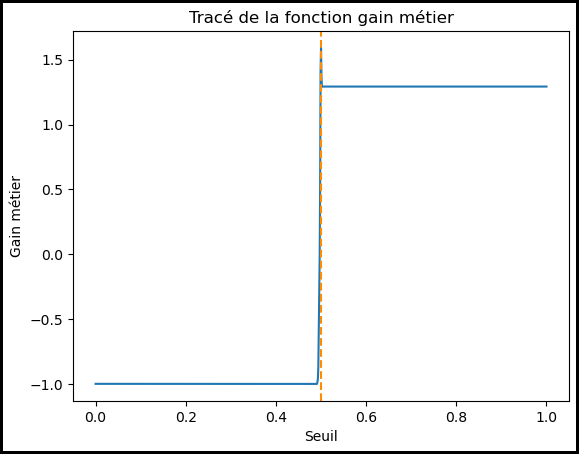

In [343]:
data_scores = affichage_gain_maximum(adb_random_2, data_scores, 'Adaboost Classifier Smote avec f1')

In [344]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### Avec fbeta_score

In [345]:
adb_3 =  AdaBoostClassifier()
adb_random_3 = RandomizedSearchCV(estimator = adb_3, param_distributions = parametres_adaboost, scoring = make_scorer(fbeta_score, beta=10), n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
adb_random_3.fit(X_sm_train, y_sm_train)

C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:292: UserWarning: The total space of parameters 9 is smaller than n_iter=10. Running 9 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 9 candidates, totalling 45 fits


RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(), n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.08, 0.1],
                                        'n_estimators': [500, 1000, 2000],
                                        'random_state': [1]},
                   random_state=42, scoring=make_scorer(fbeta_score, beta=10),
                   verbose=2)

In [346]:
adb_random_3.best_params_

{'random_state': 1, 'n_estimators': 2000, 'learning_rate': 0.1}

In [347]:
regr_ada_boo_4 = AdaBoostClassifier(n_estimators=2000, learning_rate = 0.1, random_state=1)
regr_ada_boo_4  = regr_ada_boo_4.fit(X_sm_train, y_sm_train) 

In [348]:
ytest_ada_boo_4 = regr_ada_boo_4.predict(xtest[features])

******Matrice de confusion********
[[11836  2113]
 [  795   256]]


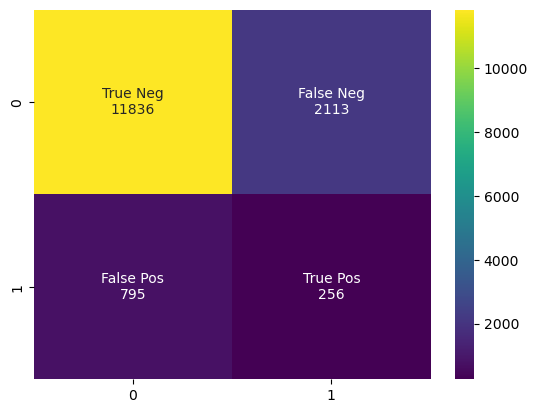

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
F1_Score =  0.1497076023391813
******Mesures de performance avec beta = 10********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
Fbeta_Score =  0.24059030976374585
******Mesures de performance avec beta = 5********
Accuracy =  0.8061333333333334
Precision =  0.5225610444249624
Recall =  0.5460485761676745
Fbeta_Score =  0.23236978075687756


In [349]:
mesure_performance_modele(ytest, ytest_ada_boo_4)

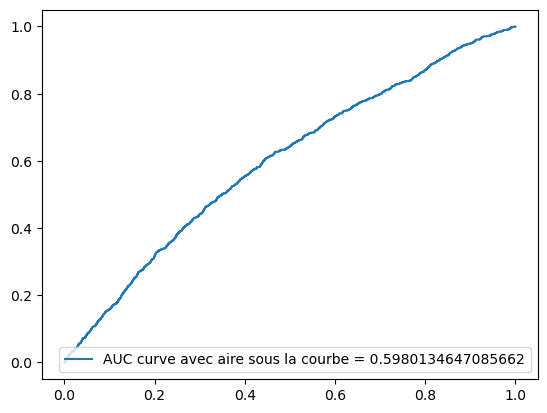

In [350]:
generate_auc_roc_curve(regr_ada_boo_4, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.5
Valeur maximum de la fonction gain métier : 1.59


,Predicted 0,Predicted 1
Actual 0,11836,2113
Actual 1,795,256


TP :  256
TN :  11836
FP :  2113
FN :  795
**********************************************************
Precision : 0.10806247361756015
recall : 0.24357754519505234


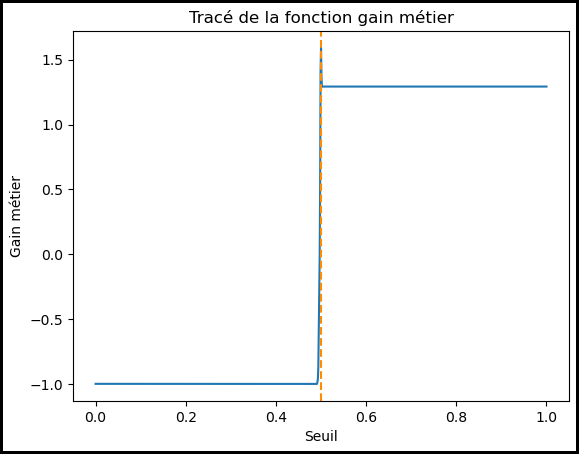

In [351]:
data_scores = affichage_gain_maximum(adb_random_3, data_scores, 'Adaboost Classifier Smote avec fBeta')

In [352]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


# LigthGBM

## Avec xtrain

In [353]:
model_lgbmc_xtrain = LGBMClassifier()

In [354]:
xtrain_2 = xtrain.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [355]:
#features_2 = features.rename(lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [356]:
xtrain_2.columns.tolist()

['index',
 'SK_ID_CURR',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FL

In [357]:
model_lgbmc_xtrain.fit(xtrain_2, ytrain)

LGBMClassifier()

In [358]:
ytest_lgbmc_xtrain = model_lgbmc_xtrain.predict(xtest)

### Mesures des performances du modèle

******Matrice de confusion********
[[12362  1587]
 [  937   114]]


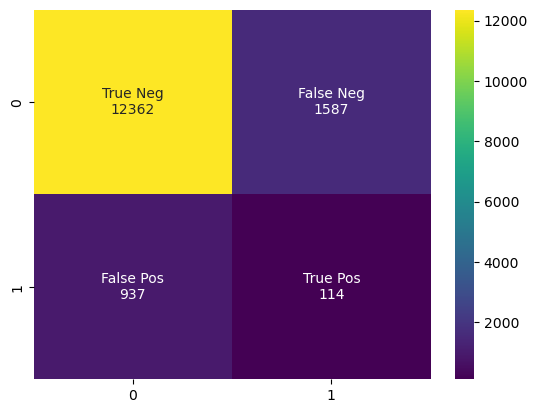

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.8317333333333333
Precision =  0.49828148752879936
Recall =  0.4973482645322273
F1_Score =  0.08284883720930233
******Mesures de performance avec beta = 10********
Accuracy =  0.8317333333333333
Precision =  0.49828148752879936
Recall =  0.4973482645322273
Fbeta_Score =  0.10780797932603627
******Mesures de performance avec beta = 5********
Accuracy =  0.8317333333333333
Precision =  0.49828148752879936
Recall =  0.4973482645322273
Fbeta_Score =  0.10594795539033457


In [359]:
mesure_performance_modele(ytest, ytest_lgbmc_xtrain)

In [360]:
def generate_auc_roc_curve_2(clf, xtest):
    ypred_proba = clf.predict_proba(xtest)[:, 1]
    fpr, tpr, thresholds = roc_curve(ytest, ypred_proba)
    auc = roc_auc_score(ytest, ypred_proba)
    plt.plot(fpr, tpr, label = "AUC curve avec aire sous la courbe = " +str(auc))
    plt.legend(loc=4)
    plt.show()
    pass

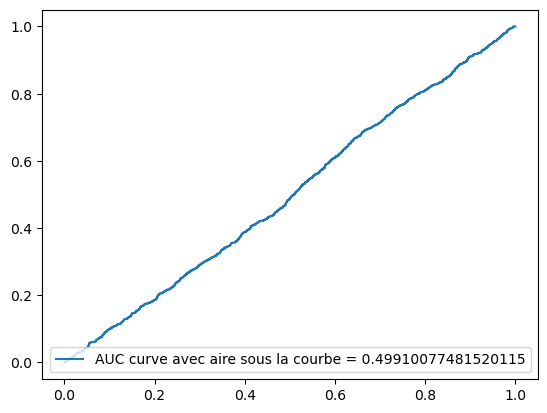

In [361]:
generate_auc_roc_curve_2(model_lgbmc_xtrain, xtest)

In [362]:
param_test ={'num_leaves': [6, 10, 30], 
             'min_child_samples': [100, 300, 500], 
             'min_child_weight': [1e-3, 1, 1e1, 1e2],
             'subsample': [0.2, 0.5, 0.8], 
             'colsample_bytree': [0.4, 0.6], 
             'reg_alpha': [0, 1, 2, 50],
             'reg_lambda': [0, 1, 20, 50], 
              'nthread': [4, 5, 10],
            'n_estimators' : [100, 500, 1000],
            'learning_rate' : [0.02, 0.05, 0.1],
             'num_leaves': [24, 34],
             'max_depth': [4, 7, 8, 10]
            }

### Amélioration avec AUC

In [363]:
lgbmc_xtrain =  LGBMClassifier()
lgbmc_xtrain_random = RandomizedSearchCV(estimator = lgbmc_xtrain, param_distributions = param_test, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbmc_xtrain_random.fit(xtrain_2, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.4, 0.6],
                                        'learning_rate': [0.02, 0.05, 0.1],
                                        'max_depth': [4, 7, 8, 10],
                                        'min_child_samples': [100, 300, 500],
                                        'min_child_weight': [0.001, 1, 10.0,
                                                             100.0],
                                        'n_estimators': [100, 500, 1000],
                                        'nthread': [4, 5, 10],
                                        'num_leaves': [24, 34],
                                        'reg_alpha': [0, 1, 2, 50],
                                        'reg_lambda': [0, 1, 20, 50],
                                        'subsample': [0.2, 0.5, 0.8]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [364]:
lgbmc_xtrain_random.best_params_

{'subsample': 0.5,
 'reg_lambda': 1,
 'reg_alpha': 2,
 'num_leaves': 24,
 'nthread': 4,
 'n_estimators': 1000,
 'min_child_weight': 0.001,
 'min_child_samples': 500,
 'max_depth': 4,
 'learning_rate': 0.02,
 'colsample_bytree': 0.6}

In [365]:
lgbmc_xtrain_auc = LGBMClassifier(subsample= 0.5, reg_lambda= 1, reg_alpha= 2,  num_leaves= 24, nthread= 4,
 n_estimators= 1000, min_child_weight= 0.001, min_child_samples= 500, max_depth = 4,learning_rate = 0.02, colsample_bytree= 0.6)

lgbmc_xtrain_auc  =lgbmc_xtrain_auc.fit(xtrain_2, ytrain)

In [366]:
ytest_lgbmc_xtrain_auc= lgbmc_xtrain_auc.predict(xtest)

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


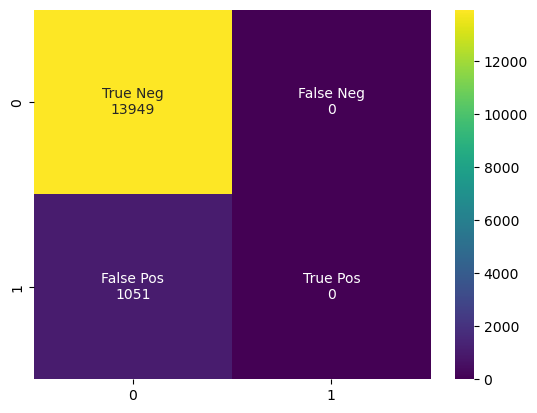

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [367]:
mesure_performance_modele(ytest, ytest_lgbmc_xtrain_auc)

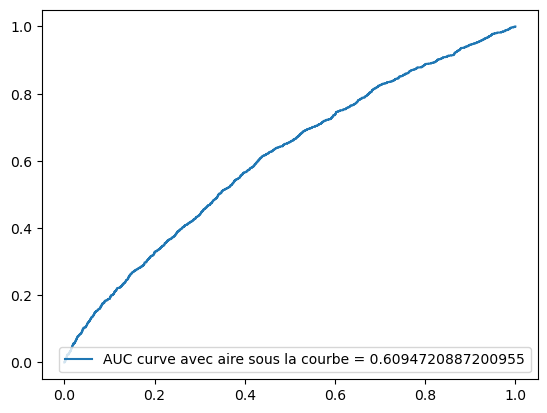

In [368]:
generate_auc_roc_curve_2(lgbmc_xtrain_auc, xtest)

In [369]:
def affichage_gain_maximum_2(rl_random, data_scores, Modele):
    ytest_pred_proba = rl_random.predict_proba(xtest)

    train_set_pred_reglog_1_auc_proba = pd.DataFrame({
        'SK_ID_CURR':
        xtest.index,
        'pred_proba':
        ytest_pred_proba[:, 1],
        'TARGET_True':
        ytest.astype(int)
    })
    seuils = np.linspace(0, 1, 1001)
    gains_modelises = [gain_modelise(seuil, train_set_pred_reglog_1_auc_proba) for seuil in seuils]

    # Quelle est la valeur de seuil qui conduit au max ?
    max_value_train = max(gains_modelises)
    max_index = gains_modelises.index(max_value_train)
    max_seuil = seuils[max_index]
    print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
    print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))
    
    liste = [(Modele, round(max_value_train, 2))]# ('Ridge', r2 )
    data_scores_new = pd.DataFrame(liste, columns = ['Modèle' , 'Score'])
    data_scores = data_scores.append(data_scores_new,ignore_index=True)
    data_scores.head()
    
        
    TP, TN, FP, FN,_ = gain_modelise(max_seuil, train_set_pred_reglog_1_auc_proba, True)
    display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))
    
    print ('TP : ', TP)
    print ('TN : ', TN)
    print ('FP : ', FP)
    print ('FN : ', FN)
    
    precision = TP/(TP + FP)
    recall = TP/(TP + FN)
    
    print("**********************************************************")
    print("Precision :", precision)
    print("recall :", recall)
    
    plt.figure(edgecolor='black', linewidth=4)
    plt.plot(seuils, gains_modelises)
    plt.xlabel('Seuil')
    plt.ylabel('Gain métier')
    plt.title('Tracé de la fonction gain métier')
    plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
    plt.show()
    
    return data_scores

Seuil qui conduit au maximum de la fonction gain métier : 0.07100000000000001
Valeur maximum de la fonction gain métier : 1.76


,Predicted 0,Predicted 1
Actual 0,11923,2026
Actual 1,778,273


TP :  273
TN :  11923
FP :  2026
FN :  778
**********************************************************
Precision : 0.11874728142670726
recall : 0.2597526165556613


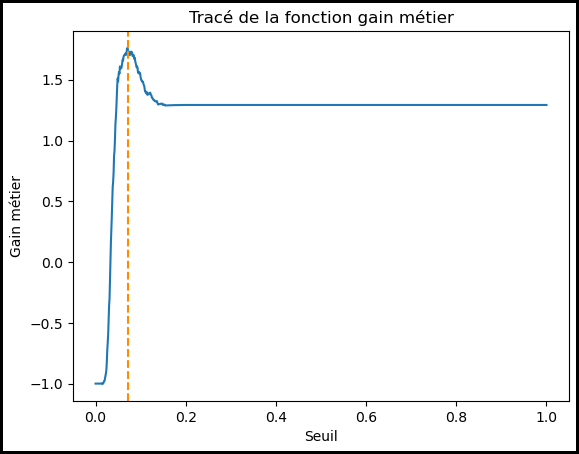

In [370]:
data_scores = affichage_gain_maximum_2(lgbmc_xtrain_random, data_scores, 'LigthGBM Xtrain avec AUC')

In [371]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


#### Optimisation de LGBM avec fonction de perte de l'algo = fonction de coût métier

Ancien gain métier (valeur de référence, avec fonction de perte = 'logloss')

In [372]:
#df_x_train = X_sm_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', ' ', x))
list_categorical_features = list(xtrain_2.select_dtypes(exclude = ['int64', 'float64']).columns)

list_categorical_features

['NAME_CONTRACT_TYPE_Cashloans',
 'NAME_CONTRACT_TYPE_Revolvingloans',
 'NAME_TYPE_SUITE_Children',
 'NAME_TYPE_SUITE_Family',
 'NAME_TYPE_SUITE_Groupofpeople',
 'NAME_TYPE_SUITE_Other_A',
 'NAME_TYPE_SUITE_Other_B',
 'NAME_TYPE_SUITE_Spousepartner',
 'NAME_TYPE_SUITE_Unaccompanied',
 'NAME_INCOME_TYPE_Businessman',
 'NAME_INCOME_TYPE_Commercialassociate',
 'NAME_INCOME_TYPE_Maternityleave',
 'NAME_INCOME_TYPE_Pensioner',
 'NAME_INCOME_TYPE_Stateservant',
 'NAME_INCOME_TYPE_Student',
 'NAME_INCOME_TYPE_Unemployed',
 'NAME_INCOME_TYPE_Working',
 'NAME_EDUCATION_TYPE_Academicdegree',
 'NAME_EDUCATION_TYPE_Highereducation',
 'NAME_EDUCATION_TYPE_Incompletehigher',
 'NAME_EDUCATION_TYPE_Lowersecondary',
 'NAME_EDUCATION_TYPE_Secondarysecondaryspecial',
 'NAME_FAMILY_STATUS_Civilmarriage',
 'NAME_FAMILY_STATUS_Married',
 'NAME_FAMILY_STATUS_Separated',
 'NAME_FAMILY_STATUS_Singlenotmarried',
 'NAME_FAMILY_STATUS_Unknown',
 'NAME_FAMILY_STATUS_Widow',
 'NAME_HOUSING_TYPE_Coopapartment',
 'NA

In [373]:
clf_ref_eval_metric = LGBMClassifier(verbose=100)
clf_ref_eval_metric.fit(xtrain_2,
                        ytrain,
                        eval_metric=None,
                        verbose=100,
                        categorical_feature=list_categorical_features)

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')


[LightGBM] [Info] Number of positive: 2452, number of negative: 32548
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.945402
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.536261
[LightGBM] [Debug] init for col-wise cost 0.027619 seconds, init for row-wise cost 0.058211 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.075014 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48613
[LightGBM] [Info] Number of data points in the train set: 35000, number of used features: 477
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.070057 -> initscore=-2.585812
[LightGBM] [Info] Start training from score -2.585812
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
[LightGBM] [Debug] Trained a tree with leaves = 31

LGBMClassifier(verbose=100)

Détermination du seuil pour l'optimum sur le train set

In [374]:
y_split_train_pred_proba_lgbm_2 = clf_ref_eval_metric.predict_proba(xtrain_2)

train_set_pred_proba_lgbm_2 = pd.DataFrame({
    'SK_ID_CURR':
    xtrain_2.index,
    'pred_proba':
    y_split_train_pred_proba_lgbm_2[:, 1],
    'TARGET_True':
    ytrain.astype(int)
})

In [375]:
seuils = np.linspace(0, 1, 1001)
gains_modelises = [gain_modelise(seuil,train_set_pred_proba_lgbm_2, verbose = False) for seuil in seuils]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train = max(gains_modelises)
max_index = gains_modelises.index(max_value_train)
max_seuil = seuils[max_index]
print("Seuil qui conduit au maximum de la fonction gain métier :", max_seuil)
print("Valeur maximum de la fonction gain métier :", round(max_value_train, 2))

Seuil qui conduit au maximum de la fonction gain métier : 0.149
Valeur maximum de la fonction gain métier : 7.13


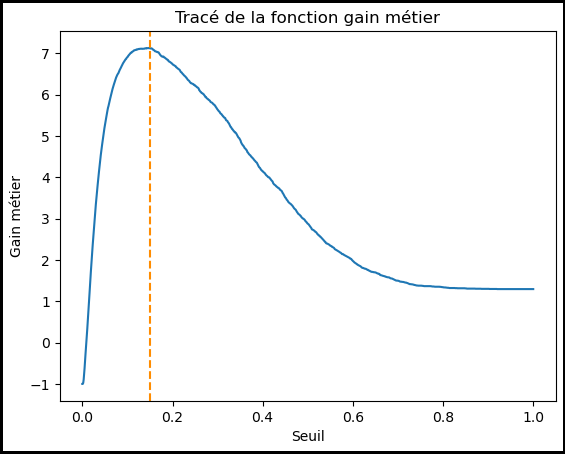

In [376]:
plt.figure(edgecolor='black', linewidth=4)
plt.plot(seuils, gains_modelises)
plt.xlabel('Seuil')
plt.ylabel('Gain métier')
plt.title('Tracé de la fonction gain métier')
plt.axline((max_seuil, 0), (max_seuil, 1), c='darkorange', ls='dashed')
plt.show()

In [377]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(max_seuil,train_set_pred_proba_lgbm_2, verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,31064,1484
Actual 1,262,2190


Calcul de l'optimum sur le validation set

In [378]:
y_split_valid_pred_proba_test_2 = clf_ref_eval_metric.predict_proba(xtest)

validation_set_pred_proba_test_2 = pd.DataFrame({
    'SK_ID_CURR':
    xtest.index,
    'pred_proba':
    y_split_valid_pred_proba_test_2[:, 1],
    'TARGET_True':
    ytest.astype(int)
})

In [379]:
print(
    f"Pour la valeur de seuil de {max_seuil} (trouvée grace au train set), "
    f"l'optimum de la fonction de coût pour le validation set est de {round(gain_modelise(max_seuil,validation_set_pred_proba_test_2, verbose=False), 2)}."
)
print(
    f"Pour rappel : cet optimum est de {round(max_value_train,2)} sur le train set."
)

Pour la valeur de seuil de 0.149 (trouvée grace au train set), l'optimum de la fonction de coût pour le validation set est de -0.17.
Pour rappel : cet optimum est de 7.13 sur le train set.


In [380]:
# Quelle est la matrice de confusion à l'optimum ?
TP, TN, FP, FN, _ = gain_modelise(max_seuil, validation_set_pred_proba_test_2,verbose=True)
display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

,Predicted 0,Predicted 1
Actual 0,4369,9580
Actual 1,312,739


Nouveau gain métier (avec fonction de perte customisée)

Fonction de perte customisée

In [381]:
my_verbose = True
cycle = 1
seuil_optimum = -999999.9
last_y_pred_pd = 0
external_gain_metier_max = -999999.9


def my_eval_metric(y_true, y_pred, test_unitaire=False):
    """C'est la fonction de perte de LGBM baséee sur la fonction coût métier.
    Args :
    - y_true : array-like of shape = [n_samples]. The target values.
    - y_pred : array-like of shape = [n_samples] or shape = [n_samples * n_classes] The predicted values. 
            In case of custom objective, predicted values are returned before any transformation, e.g. they are raw margin 
            instead of probability of positive class for binary task in this case.
    Returns : 
    - nom de la métrique (string).
    - loss value (float).
    - is_higher_better (booléen).
    Note : contrairement à ce qui est décrit dans la documentation de LGBM, y_pred est une proba (certe farfelue). 
        C'est le même score que celui retourné par la méthode predict_proba(raw_score=False).
    """

    global seuil_optimum, last_y_pred_pd, external_gain_metier_max
    y_pred_pd = pd.Series(y_pred)

    # Maximisation du gain_metier : on teste les seuils de proba et on retient celui qui donne le meilleur gain métier.
    gain_metier_max = -999999.9
    seuils = np.linspace(0.070, 0.110, 41) if not test_unitaire else [0]
    for seuil in seuils:
        # Calcul des TP / TN / FP / FN
        # conversion des raw margins en booléen (0 ou 1)
        y_pred_bool = (y_pred_pd > seuil).astype(int)
        TP = ((y_true == 1) & (y_pred_bool == 1)).sum()
        TN = ((y_true == 0) & (y_pred_bool == 0)).sum()
        FP = ((y_true == 0) & (y_pred_bool == 1)).sum()
        FN = ((y_true == 1) & (y_pred_bool == 0)).sum()
        # Calcul du gain métier
        gain = gain_metier(TP, TN, FP, FN)
        # copie des valeurs optimales
        if gain > gain_metier_max:
            gain_metier_max = gain
            seuil_optimum = seuil
            TN_optimum = TN
            FP_optimum = FP
            FN_optimum = FN
            TP_optimum = TP

    # print verbose
    if my_verbose:
        if test_unitaire:
            display(y_pred_pd)
            display(y_pred_bool)
        global cycle
        str_verbose = f"cycle = {cycle}, seuil_optimum = {round(seuil_optimum, 3)}, gain_metier_max = {round(gain_metier_max, 4)}"
        print(str_verbose)
        cycle += 1
        display(y_pred_pd.head(5))
        display(
            pd.DataFrame([[TN_optimum, FP_optimum], [FN_optimum, TP_optimum]],
                         columns=['Predicted 0', 'Predicted 1'],
                         index=['Actual 0', 'Actual 1']))

    # return
    external_gain_metier_max = gain_metier_max
    loss = -gain_metier_max
    is_higher_better = False

    return "ma_fonction_coût", loss, is_higher_better

In [382]:
# Test unitaire 1 : la fonction de coût classe tous les candidats en classe 1
my_verbose = True
cycle = 1
string_verbose = ""
y_true = np.array([0, 1, 1, 0, 1])
y_pred = np.array([4, 2, 3, 2, 1.5])
my_eval_metric(y_true, y_pred, test_unitaire=True)

0    4.0
1    2.0
2    3.0
3    2.0
4    1.5
dtype: float64

0    1
1    1
2    1
3    1
4    1
dtype: int32

cycle = 1, seuil_optimum = 0, gain_metier_max = -1.0


0    4.0
1    2.0
2    3.0
3    2.0
4    1.5
dtype: float64

,Predicted 0,Predicted 1
Actual 0,0,2
Actual 1,0,3


('ma_fonction_coût', 1.0, False)

In [383]:
# Test unitaire 2 : la fonction de coût classe tous les candidats solvables en classe 0
my_verbose = True
cycle = 1
string_verbose = ""
y_true = np.array([0, 1, 1, 0, 1])
y_pred = np.array([-4, -2, -3, -2, -1.5])
my_eval_metric(y_true, y_pred, test_unitaire=True)

0   -4.0
1   -2.0
2   -3.0
3   -2.0
4   -1.5
dtype: float64

0    0
1    0
2    0
3    0
4    0
dtype: int32

cycle = 1, seuil_optimum = 0, gain_metier_max = -57.0


0   -4.0
1   -2.0
2   -3.0
3   -2.0
4   -1.5
dtype: float64

,Predicted 0,Predicted 1
Actual 0,2,0
Actual 1,3,0


('ma_fonction_coût', 57.0, False)

In [384]:
#list_categorical_features = list(X_sm_train.select_dtypes(exclude = ['int64', 'float64']).columns)

In [385]:
#list_categorical_features

Fit du classifieur LGBM

In [386]:
# fit d'un classifieur avec les paramètres par défaut de LGBM et la fonction de coût my_eval_metric
my_verbose = True
cycle = 1
clf_my_eval_metric = LGBMClassifier(verbose=100, n_estimators=100)


# attention : j'ai dû mettre un eval_set pour que eval_metric soit pris en compte (c'est aberrant, mais ça évite un bug) - à surveiller de près lors de la cross-validation
clf_my_eval_metric.fit(xtrain_2,
                       ytrain,
                       eval_metric=my_eval_metric,
                       verbose=100,
                       categorical_feature= list_categorical_features,
                       eval_set=[(xtrain_2, ytrain)])

C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\sklearn.py:736: UserWarning: 'verbose' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose' argument is deprecated and will be removed in a future release of LightGBM. "
C:\Users\laeti\Anaconda3\lib\site-packages\lightgbm\basic.py:2065: UserWarning: Using categorical_feature in Dataset.
  _log_warning('Using categorical_feature in Dataset.')


[LightGBM] [Info] Number of positive: 2452, number of negative: 32548
[LightGBM] [Debug] Dataset::GetMultiBinFromSparseFeatures: sparse rate 0.945402
[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.536261
[LightGBM] [Debug] init for col-wise cost 0.029089 seconds, init for row-wise cost 0.078284 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.089396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48613
[LightGBM] [Info] Number of data points in the train set: 35000, number of used features: 477
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.070057 -> initscore=-2.585812
[LightGBM] [Info] Start training from score -2.585812
[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 7
cycle = 1, seuil_optimum = 0.071, gain_metier_max = 3.0303


0    0.068345
1    0.066167
2    0.069773
3    0.066167
4    0.069773
dtype: float64

,Predicted 0,Predicted 1
Actual 0,26656,5892
Actual 1,1255,1197


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
cycle = 2, seuil_optimum = 0.072, gain_metier_max = 3.2389


0    0.066593
1    0.067296
2    0.070622
3    0.062520
4    0.070622
dtype: float64

,Predicted 0,Predicted 1
Actual 0,25416,7132
Actual 1,1058,1394


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
cycle = 3, seuil_optimum = 0.076, gain_metier_max = 3.348


0    0.060521
1    0.063265
2    0.068099
3    0.058757
4    0.068099
dtype: float64

,Predicted 0,Predicted 1
Actual 0,25418,7130
Actual 1,1020,1432


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 4, seuil_optimum = 0.078, gain_metier_max = 3.4369


0    0.059271
1    0.059620
2    0.068805
3    0.055356
4    0.065410
dtype: float64

,Predicted 0,Predicted 1
Actual 0,25779,6769
Actual 1,1025,1427


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 5, seuil_optimum = 0.085, gain_metier_max = 3.544


0    0.060715
1    0.057422
2    0.067926
3    0.052652
4    0.064571
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27884,4664
Actual 1,1198,1254


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 6, seuil_optimum = 0.088, gain_metier_max = 3.6563


0    0.054952
1    0.055609
2    0.072194
3    0.049727
4    0.066273
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27957,4591
Actual 1,1166,1286


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 7, seuil_optimum = 0.089, gain_metier_max = 3.7831


0    0.049667
1    0.053214
2    0.070086
3    0.047110
4    0.064326
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27711,4837
Actual 1,1097,1355


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
cycle = 8, seuil_optimum = 0.088, gain_metier_max = 3.8477


0    0.046901
1    0.051877
2    0.067452
3    0.045297
4    0.065329
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27327,5221
Actual 1,1036,1416


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 9, seuil_optimum = 0.092, gain_metier_max = 3.9814


0    0.042595
1    0.049650
2    0.068093
3    0.043339
4    0.069298
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27715,4833
Actual 1,1028,1424


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
cycle = 10, seuil_optimum = 0.091, gain_metier_max = 4.05


0    0.038504
1    0.049695
2    0.064518
3    0.041007
4    0.065664
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27395,5153
Actual 1,972,1480


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 11, seuil_optimum = 0.089, gain_metier_max = 4.1446


0    0.039017
1    0.047225
2    0.066186
3    0.040364
4    0.067360
dtype: float64

,Predicted 0,Predicted 1
Actual 0,26956,5592
Actual 1,895,1557


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 12, seuil_optimum = 0.089, gain_metier_max = 4.2277


0    0.035277
1    0.046413
2    0.063392
3    0.038615
4    0.064519
dtype: float64

,Predicted 0,Predicted 1
Actual 0,26847,5701
Actual 1,855,1597


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
cycle = 13, seuil_optimum = 0.093, gain_metier_max = 4.2894


0    0.035002
1    0.046056
2    0.063812
3    0.037014
4    0.062302
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27403,5145
Actual 1,889,1563


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 14, seuil_optimum = 0.101, gain_metier_max = 4.39


0    0.031760
1    0.044718
2    0.066752
3    0.034940
4    0.058899
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28415,4133
Actual 1,955,1497


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 15, seuil_optimum = 0.098, gain_metier_max = 4.442


0    0.031638
1    0.042796
2    0.065101
3    0.036739
4    0.058680
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28007,4541
Actual 1,896,1556


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 16, seuil_optimum = 0.096, gain_metier_max = 4.524


0    0.028722
1    0.042512
2    0.065214
3    0.035208
4    0.056288
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27624,4924
Actual 1,829,1623


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 17, seuil_optimum = 0.097, gain_metier_max = 4.5811


0    0.028819
1    0.040810
2    0.069475
3    0.034955
4    0.055081
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27744,4804
Actual 1,821,1631


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 18, seuil_optimum = 0.092, gain_metier_max = 4.6629


0    0.028583
1    0.038455
2    0.067420
3    0.034672
4    0.054749
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27100,5448
Actual 1,728,1724


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 19, seuil_optimum = 0.095, gain_metier_max = 4.73


0    0.025844
1    0.038032
2    0.069497
3    0.035585
4    0.056160
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27445,5103
Actual 1,739,1713


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 20, seuil_optimum = 0.096, gain_metier_max = 4.7997


0    0.023499
1    0.037255
2    0.070817
3    0.033700
4    0.053245
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27489,5059
Actual 1,719,1733


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 21, seuil_optimum = 0.093, gain_metier_max = 4.8757


0    0.022754
1    0.036091
2    0.073306
3    0.033944
4    0.055154
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27115,5433
Actual 1,655,1797


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 22, seuil_optimum = 0.1, gain_metier_max = 4.9083


0    0.022640
1    0.034175
2    0.073403
3    0.033775
4    0.055228
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27969,4579
Actual 1,729,1723


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 23, seuil_optimum = 0.099, gain_metier_max = 4.9531


0    0.020469
1    0.033392
2    0.071789
3    0.033002
4    0.056326
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27826,4722
Actual 1,699,1753


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 24, seuil_optimum = 0.099, gain_metier_max = 5.0091


0    0.020277
1    0.032659
2    0.071906
3    0.031792
4    0.054308
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27832,4716
Actual 1,680,1772


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 25, seuil_optimum = 0.097, gain_metier_max = 5.078


0    0.019579
1    0.033072
2    0.072951
3    0.031195
4    0.052501
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27613,4935
Actual 1,634,1818


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 26, seuil_optimum = 0.097, gain_metier_max = 5.1229


0    0.019129
1    0.032323
2    0.073074
3    0.030487
4    0.052591
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27610,4938
Actual 1,618,1834


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 27, seuil_optimum = 0.097, gain_metier_max = 5.1994


0    0.019451
1    0.031262
2    0.074233
3    0.030994
4    0.053444
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27578,4970
Actual 1,588,1864


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 8
cycle = 28, seuil_optimum = 0.106, gain_metier_max = 5.2306


0    0.019104
1    0.030712
2    0.088048
3    0.030447
4    0.052317
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28427,4121
Actual 1,662,1790


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 29, seuil_optimum = 0.106, gain_metier_max = 5.3


0    0.017381
1    0.030315
2    0.083064
3    0.030054
4    0.053200
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28410,4138
Actual 1,636,1816


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
cycle = 30, seuil_optimum = 0.106, gain_metier_max = 5.3414


0    0.016888
1    0.029487
2    0.083525
3    0.029000
4    0.051691
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28415,4133
Actual 1,622,1830


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
cycle = 31, seuil_optimum = 0.105, gain_metier_max = 5.3717


0    0.015925
1    0.029266
2    0.084794
3    0.028782
4    0.051352
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28331,4217
Actual 1,603,1849


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 32, seuil_optimum = 0.103, gain_metier_max = 5.4034


0    0.014396
1    0.029427
2    0.085234
3    0.027787
4    0.049617
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28112,4436
Actual 1,570,1882


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 33, seuil_optimum = 0.101, gain_metier_max = 5.4343


0    0.014329
1    0.028097
2    0.086726
3    0.030331
4    0.050235
dtype: float64

,Predicted 0,Predicted 1
Actual 0,27910,4638
Actual 1,539,1913


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 34, seuil_optimum = 0.108, gain_metier_max = 5.4571


0    0.014236
1    0.027595
2    0.087446
3    0.030598
4    0.049357
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28540,4008
Actual 1,594,1858


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 35, seuil_optimum = 0.109, gain_metier_max = 5.5163


0    0.014173
1    0.027154
2    0.086858
3    0.029598
4    0.050025
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28627,3921
Actual 1,582,1870


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 36, seuil_optimum = 0.108, gain_metier_max = 5.526


0    0.014230
1    0.026570
2    0.085101
3    0.030990
4    0.049407
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28521,4027
Actual 1,568,1884


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 37, seuil_optimum = 0.11, gain_metier_max = 5.5766


0    0.014202
1    0.025700
2    0.084944
3    0.030791
4    0.049312
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28718,3830
Actual 1,570,1882


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 38, seuil_optimum = 0.109, gain_metier_max = 5.6117


0    0.013403
1    0.025232
2    0.083489
3    0.029736
4    0.049850
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28601,3947
Actual 1,546,1906


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 39, seuil_optimum = 0.11, gain_metier_max = 5.6494


0    0.013288
1    0.025078
2    0.087303
3    0.029556
4    0.049245
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28683,3865
Actual 1,541,1911


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 40, seuil_optimum = 0.11, gain_metier_max = 5.6766


0    0.017586
1    0.024914
2    0.081166
3    0.029544
4    0.049227
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28698,3850
Actual 1,533,1919


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 41, seuil_optimum = 0.11, gain_metier_max = 5.734


0    0.017231
1    0.024415
2    0.080519
3    0.029295
4    0.048820
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28689,3859
Actual 1,512,1940


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 42, seuil_optimum = 0.11, gain_metier_max = 5.7654


0    0.017234
1    0.023142
2    0.080531
3    0.029300
4    0.048828
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28679,3869
Actual 1,500,1952


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 43, seuil_optimum = 0.11, gain_metier_max = 5.8083


0    0.018479
1    0.023029
2    0.082019
3    0.029158
4    0.048065
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28729,3819
Actual 1,490,1962


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 44, seuil_optimum = 0.11, gain_metier_max = 5.8549


0    0.018489
1    0.023041
2    0.080454
3    0.029523
4    0.048654
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28742,3806
Actual 1,475,1977


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 45, seuil_optimum = 0.11, gain_metier_max = 5.8774


0    0.017864
1    0.022956
2    0.083545
3    0.030722
4    0.048519
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28751,3797
Actual 1,468,1984


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 46, seuil_optimum = 0.109, gain_metier_max = 5.8963


0    0.017833
1    0.022573
2    0.083410
3    0.029321
4    0.048438
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28687,3861
Actual 1,455,1997


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 47, seuil_optimum = 0.11, gain_metier_max = 5.9466


0    0.017082
1    0.022799
2    0.084195
3    0.028531
4    0.048963
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28783,3765
Actual 1,447,2005


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 48, seuil_optimum = 0.11, gain_metier_max = 5.9674


0    0.016999
1    0.022393
2    0.085549
3    0.028026
4    0.049781
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28806,3742
Actual 1,442,2010


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 49, seuil_optimum = 0.11, gain_metier_max = 5.9863


0    0.016971
1    0.022356
2    0.085418
3    0.027980
4    0.049702
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28812,3736
Actual 1,436,2016


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 50, seuil_optimum = 0.11, gain_metier_max = 6.0103


0    0.017026
1    0.022452
2    0.085758
3    0.028098
4    0.049859
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28806,3742
Actual 1,427,2025


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 51, seuil_optimum = 0.11, gain_metier_max = 6.0429


0    0.016561
1    0.022433
2    0.086858
3    0.027564
4    0.050523
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28810,3738
Actual 1,416,2036


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 52, seuil_optimum = 0.11, gain_metier_max = 6.0543


0    0.016062
1    0.021682
2    0.086708
3    0.027514
4    0.050433
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28830,3718
Actual 1,414,2038


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 53, seuil_optimum = 0.11, gain_metier_max = 6.0737


0    0.016190
1    0.020909
2    0.087350
3    0.027435
4    0.050821
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28858,3690
Actual 1,410,2042


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 15
cycle = 54, seuil_optimum = 0.11, gain_metier_max = 6.1151


0    0.016140
1    0.020578
2    0.089546
3    0.028171
4    0.050869
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28853,3695
Actual 1,395,2057


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 55, seuil_optimum = 0.11, gain_metier_max = 6.1349


0    0.015424
1    0.020653
2    0.089848
3    0.028272
4    0.051048
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28872,3676
Actual 1,390,2062


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 56, seuil_optimum = 0.109, gain_metier_max = 6.1469


0    0.015576
1    0.020478
2    0.086424
3    0.027125
4    0.051533
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28794,3754
Actual 1,378,2074


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 57, seuil_optimum = 0.11, gain_metier_max = 6.1549


0    0.015055
1    0.020420
2    0.086193
3    0.025357
4    0.051390
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28892,3656
Actual 1,385,2067


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 58, seuil_optimum = 0.11, gain_metier_max = 6.19


0    0.015102
1    0.019794
2    0.086440
3    0.024528
4    0.051543
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28915,3633
Actual 1,375,2077


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 59, seuil_optimum = 0.109, gain_metier_max = 6.2177


0    0.015087
1    0.019775
2    0.086363
3    0.024505
4    0.051495
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28842,3706
Actual 1,358,2094


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 60, seuil_optimum = 0.11, gain_metier_max = 6.2517


0    0.015322
1    0.019452
2    0.085914
3    0.024107
4    0.052268
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28921,3627
Actual 1,354,2098


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 61, seuil_optimum = 0.11, gain_metier_max = 6.2683


0    0.015296
1    0.019419
2    0.085778
3    0.024066
4    0.051024
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28939,3609
Actual 1,350,2102


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 62, seuil_optimum = 0.11, gain_metier_max = 6.3046


0    0.015336
1    0.019224
2    0.085984
3    0.024128
4    0.051152
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28966,3582
Actual 1,340,2112


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 63, seuil_optimum = 0.11, gain_metier_max = 6.3177


0    0.015166
1    0.019116
2    0.086956
3    0.023993
4    0.051752
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28972,3576
Actual 1,336,2116


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 64, seuil_optimum = 0.109, gain_metier_max = 6.358


0    0.014614
1    0.018567
2    0.087425
3    0.024390
4    0.052042
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28913,3635
Actual 1,316,2136


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 65, seuil_optimum = 0.109, gain_metier_max = 6.3814


0    0.014608
1    0.018559
2    0.087391
3    0.023020
4    0.052021
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28925,3623
Actual 1,309,2143


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 66, seuil_optimum = 0.109, gain_metier_max = 6.3846


0    0.014677
1    0.018265
2    0.087769
3    0.023126
4    0.052255
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28946,3602
Actual 1,310,2142


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 67, seuil_optimum = 0.11, gain_metier_max = 6.4031


0    0.014808
1    0.017699
2    0.088495
3    0.023331
4    0.051551
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29031,3517
Actual 1,312,2140


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
cycle = 68, seuil_optimum = 0.11, gain_metier_max = 6.438


0    0.014837
1    0.017734
2    0.088658
3    0.023377
4    0.051650
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29043,3505
Actual 1,301,2151


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 69, seuil_optimum = 0.109, gain_metier_max = 6.4691


0    0.013416
1    0.017889
2    0.089377
3    0.023580
4    0.052103
dtype: float64

,Predicted 0,Predicted 1
Actual 0,28992,3556
Actual 1,285,2167


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 70, seuil_optimum = 0.11, gain_metier_max = 6.4869


0    0.013386
1    0.017850
2    0.089192
3    0.023528
4    0.051991
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29084,3464
Actual 1,288,2164


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 71, seuil_optimum = 0.11, gain_metier_max = 6.5169


0    0.013338
1    0.017786
2    0.088900
3    0.023446
4    0.051814
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29109,3439
Actual 1,280,2172


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 72, seuil_optimum = 0.11, gain_metier_max = 6.5277


0    0.013344
1    0.017794
2    0.088935
3    0.023455
4    0.051835
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29107,3441
Actual 1,276,2176


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 73, seuil_optimum = 0.11, gain_metier_max = 6.5443


0    0.013374
1    0.016752
2    0.089119
3    0.023508
4    0.051947
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29125,3423
Actual 1,272,2180


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 74, seuil_optimum = 0.11, gain_metier_max = 6.5609


0    0.013450
1    0.015492
2    0.090279
3    0.023836
4    0.052230
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29133,3415
Actual 1,267,2185


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 75, seuil_optimum = 0.11, gain_metier_max = 6.5966


0    0.013283
1    0.015538
2    0.090528
3    0.023906
4    0.052380
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29148,3400
Actual 1,256,2196


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 76, seuil_optimum = 0.11, gain_metier_max = 6.6151


0    0.013382
1    0.015424
2    0.091148
3    0.023287
4    0.052754
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29163,3385
Actual 1,251,2201


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 77, seuil_optimum = 0.11, gain_metier_max = 6.6349


0    0.015696
1    0.015453
2    0.091305
3    0.023330
4    0.052849
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29182,3366
Actual 1,246,2206


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 78, seuil_optimum = 0.11, gain_metier_max = 6.652


0    0.015645
1    0.015402
2    0.091029
3    0.023679
4    0.052682
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29202,3346
Actual 1,242,2210


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 79, seuil_optimum = 0.11, gain_metier_max = 6.6906


0    0.015685
1    0.015084
2    0.091244
3    0.023740
4    0.052812
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29237,3311
Actual 1,232,2220


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 80, seuil_optimum = 0.11, gain_metier_max = 6.6966


0    0.015736
1    0.015017
2    0.090874
3    0.023636
4    0.052978
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29248,3300
Actual 1,231,2221


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 81, seuil_optimum = 0.11, gain_metier_max = 6.7254


0    0.015654
1    0.015026
2    0.090921
3    0.023534
4    0.053007
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29269,3279
Actual 1,223,2229


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 82, seuil_optimum = 0.11, gain_metier_max = 6.732


0    0.015677
1    0.015048
2    0.091043
3    0.023568
4    0.053081
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29282,3266
Actual 1,222,2230


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 16
cycle = 83, seuil_optimum = 0.11, gain_metier_max = 6.7486


0    0.015638
1    0.015011
2    0.090837
3    0.023170
4    0.052956
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29310,3238
Actual 1,219,2233


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 84, seuil_optimum = 0.11, gain_metier_max = 6.7654


0    0.015644
1    0.015016
2    0.090868
3    0.023179
4    0.052975
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29319,3229
Actual 1,214,2238


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 85, seuil_optimum = 0.11, gain_metier_max = 6.7863


0    0.015589
1    0.014910
2    0.092775
3    0.021508
4    0.049887
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29312,3236
Actual 1,206,2246


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 86, seuil_optimum = 0.11, gain_metier_max = 6.8254


0    0.015650
1    0.014624
2    0.091137
3    0.020902
4    0.050077
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29319,3229
Actual 1,193,2259


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 87, seuil_optimum = 0.11, gain_metier_max = 6.838


0    0.015659
1    0.014633
2    0.091187
3    0.019087
4    0.045982
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29323,3225
Actual 1,189,2263


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 88, seuil_optimum = 0.11, gain_metier_max = 6.8631


0    0.015689
1    0.014661
2    0.091345
3    0.019123
4    0.046066
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29341,3207
Actual 1,182,2270


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 89, seuil_optimum = 0.11, gain_metier_max = 6.8826


0    0.015710
1    0.013921
2    0.091457
3    0.019148
4    0.046125
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29369,3179
Actual 1,178,2274


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 90, seuil_optimum = 0.11, gain_metier_max = 6.8886


0    0.015214
1    0.013917
2    0.091429
3    0.019142
4    0.046110
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29380,3168
Actual 1,177,2275


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 13
cycle = 91, seuil_optimum = 0.11, gain_metier_max = 6.9211


0    0.015185
1    0.013891
2    0.109352
3    0.019106
4    0.046026
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29404,3144
Actual 1,168,2284


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 9
cycle = 92, seuil_optimum = 0.11, gain_metier_max = 6.9246


0    0.015166
1    0.013873
2    0.109225
3    0.019081
4    0.045969
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29416,3132
Actual 1,168,2284


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 11
cycle = 93, seuil_optimum = 0.11, gain_metier_max = 6.9506


0    0.015092
1    0.012727
2    0.111032
3    0.019430
4    0.045754
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29417,3131
Actual 1,159,2293


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 94, seuil_optimum = 0.11, gain_metier_max = 6.9689


0    0.015040
1    0.011911
2    0.110689
3    0.019363
4    0.045602
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29431,3117
Actual 1,154,2298


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 95, seuil_optimum = 0.11, gain_metier_max = 6.9737


0    0.015093
1    0.011953
2    0.110152
3    0.019431
4    0.045757
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29428,3120
Actual 1,152,2300


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 14
cycle = 96, seuil_optimum = 0.11, gain_metier_max = 6.9957


0    0.015055
1    0.011922
2    0.109896
3    0.019595
4    0.045643
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29455,3093
Actual 1,147,2305


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 97, seuil_optimum = 0.11, gain_metier_max = 7.0003


0    0.013617
1    0.011935
2    0.110009
3    0.019617
4    0.045694
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29461,3087
Actual 1,146,2306


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 98, seuil_optimum = 0.11, gain_metier_max = 7.012


0    0.013642
1    0.011958
2    0.110195
3    0.019654
4    0.045777
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29472,3076
Actual 1,143,2309


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 10
cycle = 99, seuil_optimum = 0.11, gain_metier_max = 7.0237


0    0.013655
1    0.011969
2    0.110287
3    0.019672
4    0.045817
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29483,3065
Actual 1,140,2312


[LightGBM] [Debug] Trained a tree with leaves = 31 and depth = 12
cycle = 100, seuil_optimum = 0.11, gain_metier_max = 7.026


0    0.013696
1    0.012005
2    0.110588
3    0.019731
4    0.045951
dtype: float64

,Predicted 0,Predicted 1
Actual 0,29481,3067
Actual 1,139,2313


[100]	training's binary_logloss: 0.127424	training's ma_fonction_coût: -7.026


LGBMClassifier(verbose=100)

Analyse du classifieur (les y_pred sont des "probas")

In [387]:
#boost = clf_my_eval_metric.booster_
print("seuil_optimum (proba) :", round(seuil_optimum, 3))

seuil_optimum (proba) : 0.11


Nouveau gain métier

Vérification sur xtrain

In [388]:
y_split_train_pred_proba = clf_my_eval_metric.predict_proba(xtrain_2)
y_split_train_pred_proba

array([[0.98630391, 0.01369609],
       [0.98799491, 0.01200509],
       [0.88941231, 0.11058769],
       ...,
       [0.9622117 , 0.0377883 ],
       [0.93363862, 0.06636138],
       [0.99434118, 0.00565882]])

In [389]:
y_split_train_pred_proba_lgbm = clf_my_eval_metric.predict_proba(xtrain_2)

train_set_pred_proba_lgbm = pd.DataFrame({
    'SK_ID_CURR':
    xtrain_2.index,
    'pred_proba':
    y_split_train_pred_proba[:, 1],
    'TARGET_True':
    ytrain.astype(int)
})

print("Les 20 scores les plus élevés :")
display(train_set_pred_proba_lgbm.sort_values(by='pred_proba').tail(20))

Les 20 scores les plus élevés :


,SK_ID_CURR,pred_proba,TARGET_True
148217,148217,0.792242,1
77952,77952,0.795547,1
68567,68567,0.796625,1
250737,250737,0.798815,1
218872,218872,0.800027,1
20921,20921,0.801559,1
48917,48917,0.805053,1
28414,28414,0.807614,1
163958,163958,0.809811,1
185196,185196,0.812555,1


In [390]:
print("seuil_optimum : ", round(seuil_optimum, 3))

TP, TN, FP, FN, gain = gain_modelise(seuil_optimum,train_set_pred_proba_lgbm, verbose=True)

print("Gain métier :", round(gain, 3))

display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

seuil_optimum :  0.11
Gain métier : 7.026


,Predicted 0,Predicted 1
Actual 0,29481,3067
Actual 1,139,2313


Le résultat est raccord avec les résultats obtenus après le 100è cycle/boost/arbre du fit.
c'est le même résultat que pour l'ancien gain métier.

Calcul sur xtest

In [391]:
y_split_valid_pred_proba_lgbm_test = clf_my_eval_metric.predict_proba(xtest)

validation_set_pred_proba_lgbm = pd.DataFrame({
    'SK_ID_CURR':
    xtest.index,
    'pred_proba':
    y_split_valid_pred_proba_lgbm_test[:, 1],
    'TARGET_True':
    ytest.astype(int)
})

display(validation_set_pred_proba_lgbm)

,SK_ID_CURR,pred_proba,TARGET_True
318877,318877,0.192937,0
236226,236226,0.354628,0
263553,263553,0.093108,0
142303,142303,0.163812,0
170492,170492,0.169962,0
...,...,...,...
255374,255374,0.367098,0
215459,215459,0.512765,0
298728,298728,0.131091,0
116662,116662,0.120648,1


In [392]:
print("seuil_optimum (proba) : ", round(seuil_optimum, 3))

TP, TN, FP, FN, gain = gain_modelise(seuil_optimum, validation_set_pred_proba_lgbm,verbose=True)

print("Gain métier :", round(gain, 3))

display(
    pd.DataFrame([[TN, FP], [FN, TP]],
                 columns=['Predicted 0', 'Predicted 1'],
                 index=['Actual 0', 'Actual 1']))

seuil_optimum (proba) :  0.11
Gain métier : -0.641


,Predicted 0,Predicted 1
Actual 0,2259,11690
Actual 1,172,879


### Amélioration avec f1

In [395]:
lgbmc_xtrain_f1 =  LGBMClassifier()
lgbmc_xtrain_f1_random = RandomizedSearchCV(estimator = lgbmc_xtrain_f1, param_distributions = param_test, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbmc_xtrain_f1_random.fit(xtrain_2, ytrain)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=10 will be ignored. Current value: num_threads=-1


RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.4, 0.6],
                                        'learning_rate': [0.02, 0.05, 0.1],
                                        'max_depth': [4, 7, 8, 10],
                                        'min_child_samples': [100, 300, 500],
                                        'min_child_weight': [0.001, 1, 10.0,
                                                             100.0],
                                        'n_estimators': [100, 500, 1000],
                                        'nthread': [4, 5, 10],
                                        'num_leaves': [24, 34],
                                        'reg_alpha': [0, 1, 2, 50],
                                        'reg_lambda': [0, 1, 20, 50],
                                        'subsample': [0.2, 0.5, 0.8]},
                   random_state=42, scoring='f1', verbose=2)

In [396]:
lgbmc_xtrain_f1_random.best_params_

{'subsample': 0.2,
 'reg_lambda': 0,
 'reg_alpha': 1,
 'num_leaves': 34,
 'nthread': 10,
 'n_estimators': 500,
 'min_child_weight': 100.0,
 'min_child_samples': 300,
 'max_depth': 8,
 'learning_rate': 0.1,
 'colsample_bytree': 0.4}

In [397]:
lgbmc_xtrain_f1_2 = LGBMClassifier(subsample= 0.2, reg_lambda= 0, reg_alpha= 1,  num_leaves= 34, nthread= 10,
 n_estimators= 500, min_child_weight= 100.0, min_child_samples= 300, max_depth = 8,learning_rate = 0.1, colsample_bytree= 0.4)

lgbmc_xtrain_f1_2  =lgbmc_xtrain_f1_2.fit(xtrain_2, ytrain)

In [398]:
ytest_lgbmc_xtrain_f1 = lgbmc_xtrain_f1_2.predict(xtest)

******Matrice de confusion********
[[13949     0]
 [ 1051     0]]


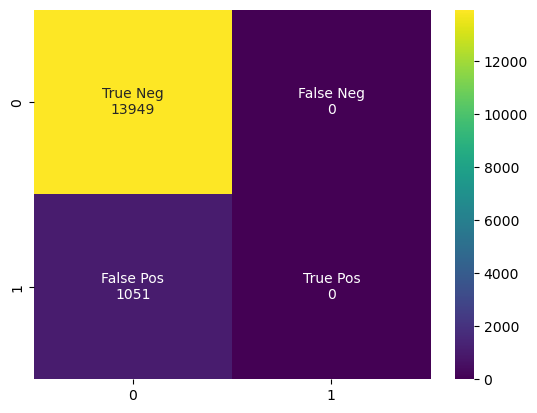

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
F1_Score =  0.0
******Mesures de performance avec beta = 10********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0
******Mesures de performance avec beta = 5********
Accuracy =  0.9299333333333333
Precision =  0.46496666666666664
Recall =  0.5
Fbeta_Score =  0.0


C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\laeti\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [399]:
mesure_performance_modele(ytest, ytest_lgbmc_xtrain_f1)

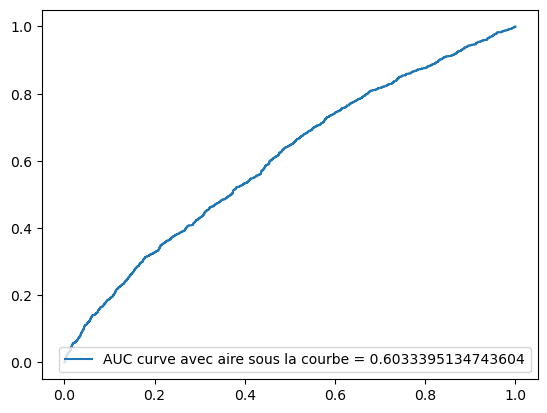

In [400]:
generate_auc_roc_curve_2(lgbmc_xtrain_f1_2, xtest)

Seuil qui conduit au maximum de la fonction gain métier : 0.068
Valeur maximum de la fonction gain métier : 1.82


,Predicted 0,Predicted 1
Actual 0,11467,2482
Actual 1,723,328


TP :  328
TN :  11467
FP :  2482
FN :  723
**********************************************************
Precision : 0.11672597864768683
recall : 0.3120837297811608


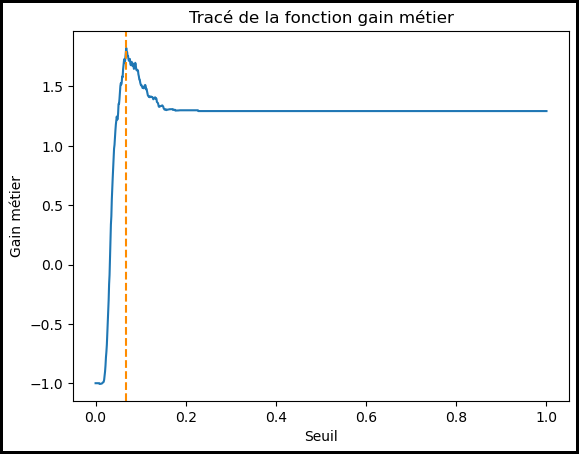

In [401]:
data_scores = affichage_gain_maximum_2(lgbmc_xtrain_f1_random, data_scores, 'LightGBM Xtrain avec f1')

In [402]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


## Avec smote

In [403]:
model_lgbmc = LGBMClassifier()

In [404]:
#df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
X_sm_train_2 = X_sm_train.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))


In [405]:
model_lgbmc.fit(X_sm_train_2, y_sm_train)

LGBMClassifier()

In [406]:
#ytrain_lgbmc= model_lgbmc.predict(X_sm_train)
ytest_lgbmc = model_lgbmc.predict(xtest[features])

******Matrice de confusion********
[[   15 13934]
 [    1  1050]]


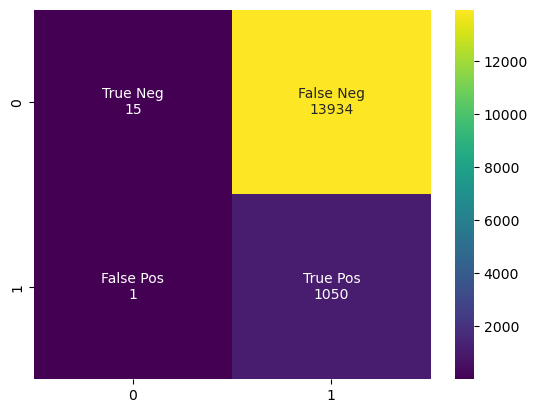

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.071
Precision =  0.503787373198078
Recall =  0.500061935558507
F1_Score =  0.13096351730589334
******Mesures de performance avec beta = 10********
Accuracy =  0.071
Precision =  0.503787373198078
Recall =  0.500061935558507
Fbeta_Score =  0.8831318077345858
******Mesures de performance avec beta = 5********
Accuracy =  0.071
Precision =  0.503787373198078
Recall =  0.500061935558507
Fbeta_Score =  0.661673816621828


In [407]:
mesure_performance_modele(ytest, ytest_lgbmc)

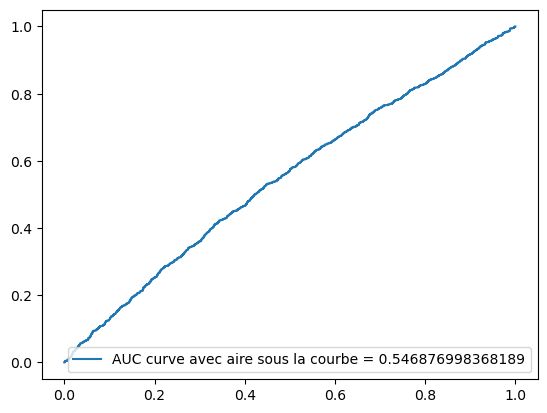

In [408]:
generate_auc_roc_curve(model_lgbmc, xtest[features])

## Amélioration du modèle

In [ ]:
'''#from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

param_test ={'num_leaves': [6, 10, 30], 
             'min_child_samples': [100, 300, 500], 
             'min_child_weight': [1e-3, 1, 1e1, 1e2],
             'subsample': [0.2, 0.5, 0.8], 
             'colsample_bytree': [0.4, 0.6], 
             'reg_alpha': [0, 1, 2, 50],
             'reg_lambda': [0, 1, 20, 50], 
              'nthread': [4, 5, 10],
            'n_estimators' : [100, 500, 1000],
            'learning_rate' : [0.02, 0.05, 0.1],
             'num_leaves': [24, 34],
             'max_depth': [4, 7, 8, 10]
            }'''

### Avec le score AUC

In [409]:
lgbmc =  LGBMClassifier()
lgbmc_random = RandomizedSearchCV(estimator = lgbmc, param_distributions = param_test, scoring = 'roc_auc', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbmc_random.fit(X_sm_train_2, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.4, 0.6],
                                        'learning_rate': [0.02, 0.05, 0.1],
                                        'max_depth': [4, 7, 8, 10],
                                        'min_child_samples': [100, 300, 500],
                                        'min_child_weight': [0.001, 1, 10.0,
                                                             100.0],
                                        'n_estimators': [100, 500, 1000],
                                        'nthread': [4, 5, 10],
                                        'num_leaves': [24, 34],
                                        'reg_alpha': [0, 1, 2, 50],
                                        'reg_lambda': [0, 1, 20, 50],
                                        'subsample': [0.2, 0.5, 0.8]},
                   random_state=42, scoring='roc_auc', verbose=2)

In [410]:
lgbmc_random.best_params_

{'subsample': 0.8,
 'reg_lambda': 50,
 'reg_alpha': 1,
 'num_leaves': 34,
 'nthread': 4,
 'n_estimators': 1000,
 'min_child_weight': 10.0,
 'min_child_samples': 300,
 'max_depth': 10,
 'learning_rate': 0.1,
 'colsample_bytree': 0.4}

In [411]:
lgbmc_1 = LGBMClassifier(subsample= 0.8, reg_lambda= 50, reg_alpha= 1,  num_leaves= 34, nthread= 4,
 n_estimators= 1000, min_child_weight= 10, min_child_samples= 300, max_depth = 10,learning_rate = 0.1, colsample_bytree= 0.4)

lgbmc_1  =lgbmc_1.fit(X_sm_train_2, y_sm_train)

In [412]:
#ytrain_lgbmc_1 = lgbmc_1.predict(X_sm_train)
ytest_lgbmc_1= lgbmc_1.predict(xtest[features])

******Matrice de confusion********
[[   25 13924]
 [    1  1050]]


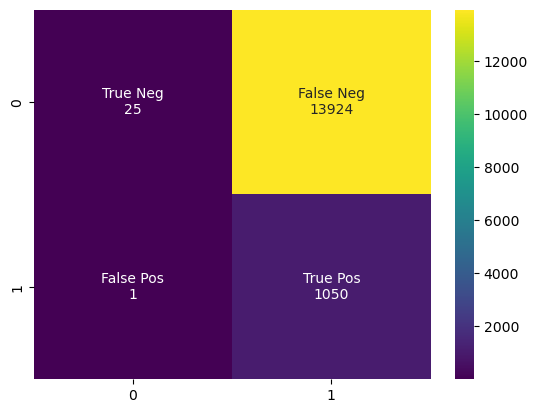

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
F1_Score =  0.13104524180967236
******Mesures de performance avec beta = 10********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
Fbeta_Score =  0.8832053566967036
******Mesures de performance avec beta = 5********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
Fbeta_Score =  0.6618342262842736


In [413]:
mesure_performance_modele(ytest, ytest_lgbmc_1)

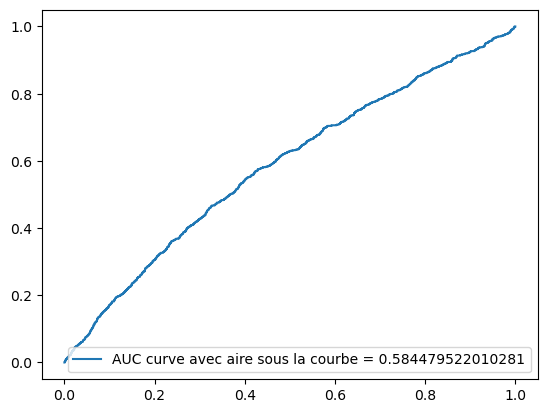

In [414]:
generate_auc_roc_curve(lgbmc_1, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.962
Valeur maximum de la fonction gain métier : 1.6


,Predicted 0,Predicted 1
Actual 0,10624,3325
Actual 1,672,379


TP :  379
TN :  10624
FP :  3325
FN :  672
**********************************************************
Precision : 0.10232181425485962
recall : 0.36060894386298764


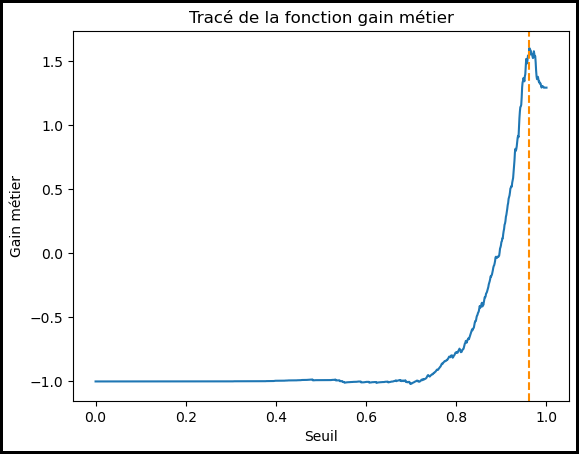

In [415]:
data_scores = affichage_gain_maximum(lgbmc_random, data_scores, 'LigthGBM Smote avec AUC')

In [416]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### Avec f1

In [417]:
lgbmc_2 =  LGBMClassifier()
lgbmc_2_random = RandomizedSearchCV(estimator = lgbmc_2, param_distributions = param_test, scoring = 'f1', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbmc_2_random.fit(X_sm_train_2, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.4, 0.6],
                                        'learning_rate': [0.02, 0.05, 0.1],
                                        'max_depth': [4, 7, 8, 10],
                                        'min_child_samples': [100, 300, 500],
                                        'min_child_weight': [0.001, 1, 10.0,
                                                             100.0],
                                        'n_estimators': [100, 500, 1000],
                                        'nthread': [4, 5, 10],
                                        'num_leaves': [24, 34],
                                        'reg_alpha': [0, 1, 2, 50],
                                        'reg_lambda': [0, 1, 20, 50],
                                        'subsample': [0.2, 0.5, 0.8]},
                   random_state=42, scoring='f1', verbose=2)

In [418]:
lgbmc_2_random.best_params_

{'subsample': 0.8,
 'reg_lambda': 50,
 'reg_alpha': 1,
 'num_leaves': 34,
 'nthread': 4,
 'n_estimators': 1000,
 'min_child_weight': 10.0,
 'min_child_samples': 300,
 'max_depth': 10,
 'learning_rate': 0.1,
 'colsample_bytree': 0.4}

In [419]:
lgbmc_2 = LGBMClassifier(subsample= 0.8, reg_lambda= 50, reg_alpha= 1,  num_leaves= 34, nthread= 4,
 n_estimators= 1000, min_child_weight= 10, min_child_samples= 300, max_depth = 10,learning_rate = 0.1, colsample_bytree= 0.4)

lgbmc_2  =lgbmc_2.fit(X_sm_train_2, y_sm_train)

In [420]:
ytest_lgbmc_2= lgbmc_2.predict(xtest[features])

******Matrice de confusion********
[[   25 13924]
 [    1  1050]]


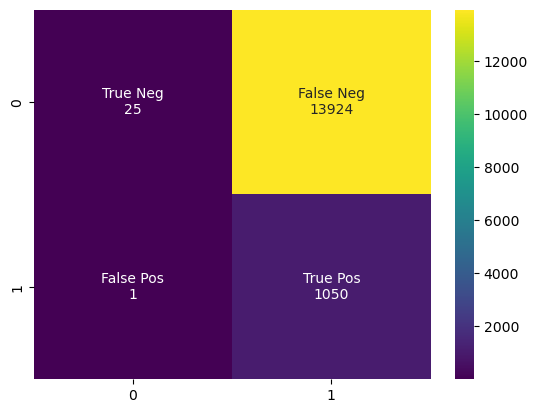

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
F1_Score =  0.13104524180967236
******Mesures de performance avec beta = 10********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
Fbeta_Score =  0.8832053566967036
******Mesures de performance avec beta = 5********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
Fbeta_Score =  0.6618342262842736


In [421]:
mesure_performance_modele(ytest, ytest_lgbmc_2)

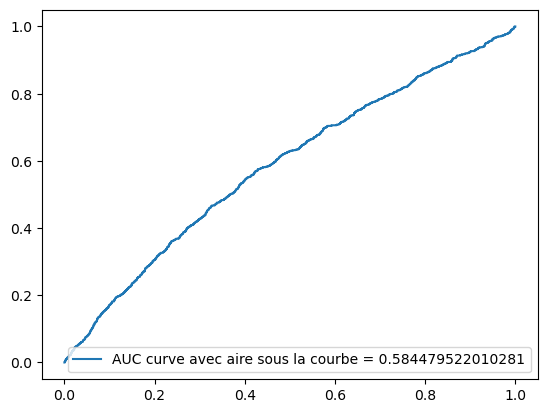

In [422]:
generate_auc_roc_curve(lgbmc_2, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.962
Valeur maximum de la fonction gain métier : 1.6


,Predicted 0,Predicted 1
Actual 0,10624,3325
Actual 1,672,379


TP :  379
TN :  10624
FP :  3325
FN :  672
**********************************************************
Precision : 0.10232181425485962
recall : 0.36060894386298764


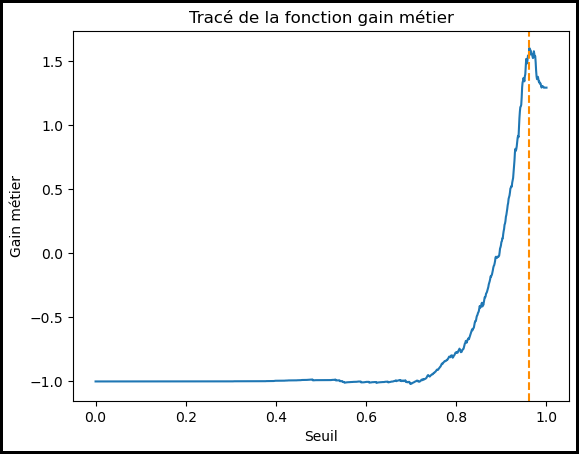

In [423]:
data_scores = affichage_gain_maximum(lgbmc_2_random, data_scores, 'LigthGBM Smote avec f1' )

In [424]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


### Avec fbeta_score

In [425]:
lgbmc_3 =  LGBMClassifier()
lgbmc_3_random = RandomizedSearchCV(estimator = lgbmc_3, param_distributions = param_test, scoring = make_scorer(fbeta_score, beta=10), n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
lgbmc_3_random.fit(X_sm_train_2, y_sm_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


RandomizedSearchCV(cv=5, estimator=LGBMClassifier(), n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.4, 0.6],
                                        'learning_rate': [0.02, 0.05, 0.1],
                                        'max_depth': [4, 7, 8, 10],
                                        'min_child_samples': [100, 300, 500],
                                        'min_child_weight': [0.001, 1, 10.0,
                                                             100.0],
                                        'n_estimators': [100, 500, 1000],
                                        'nthread': [4, 5, 10],
                                        'num_leaves': [24, 34],
                                        'reg_alpha': [0, 1, 2, 50],
                                        'reg_lambda': [0, 1, 20, 50],
                                        'subsample': [0.2, 0.5, 0.8]},
                   random_state=42, scoring=make_scorer(fbeta_score, beta=10),
       

In [426]:
lgbmc_3_random.best_params_

{'subsample': 0.8,
 'reg_lambda': 50,
 'reg_alpha': 1,
 'num_leaves': 34,
 'nthread': 4,
 'n_estimators': 1000,
 'min_child_weight': 10.0,
 'min_child_samples': 300,
 'max_depth': 10,
 'learning_rate': 0.1,
 'colsample_bytree': 0.4}

In [427]:
lgbmc_3 = LGBMClassifier(subsample= 0.8, reg_lambda= 50, reg_alpha= 1,  num_leaves= 34, nthread= 4,
 n_estimators= 1000, min_child_weight= 10, min_child_samples= 300, max_depth = 10,learning_rate = 0.1, colsample_bytree= 0.4)

lgbmc_3  = lgbmc_3.fit(X_sm_train_2, y_sm_train) 

In [428]:
ytest_lgbmc_3= lgbmc_3.predict(xtest[features])

******Matrice de confusion********
[[   25 13924]
 [    1  1050]]


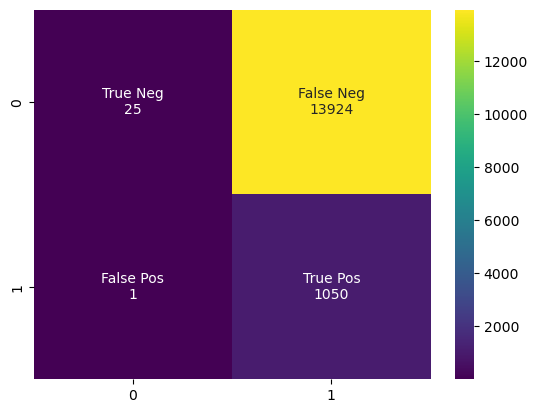

************************************
******Mesures de performance avec f1_score********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
F1_Score =  0.13104524180967236
******Mesures de performance avec beta = 10********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
Fbeta_Score =  0.8832053566967036
******Mesures de performance avec beta = 5********
Accuracy =  0.07166666666666667
Precision =  0.5158300027740391
Recall =  0.5004203841928176
Fbeta_Score =  0.6618342262842736


In [429]:
mesure_performance_modele(ytest, ytest_lgbmc_3)

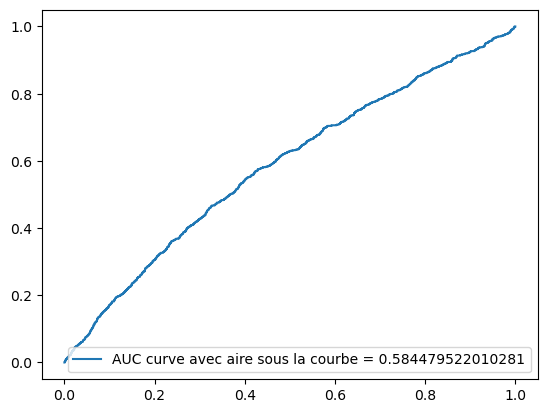

In [430]:
generate_auc_roc_curve(lgbmc_3, xtest[features])

Seuil qui conduit au maximum de la fonction gain métier : 0.962
Valeur maximum de la fonction gain métier : 1.6


,Predicted 0,Predicted 1
Actual 0,10624,3325
Actual 1,672,379


TP :  379
TN :  10624
FP :  3325
FN :  672
**********************************************************
Precision : 0.10232181425485962
recall : 0.36060894386298764


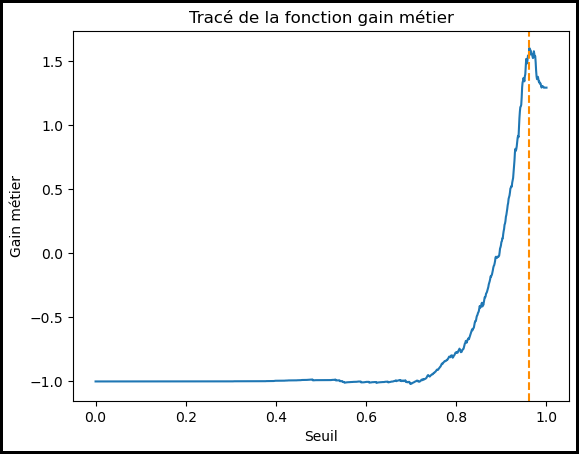

In [431]:
data_scores = affichage_gain_maximum(lgbmc_3_random, data_scores, 'LigthGBM Smote avec fBeta')

In [432]:
data_scores

,Modèle,Score
0,Regression logistique xtrain avec AUC,1.29
1,Regression logistique xtrain avec f1,1.29
2,Regression logistique Smote avec AUC,1.29
3,Regression logistique Smote avec f1,1.29
4,Regression logistique Smote avec fBeta,1.29
5,Random Forest Xtrain avec AUC,1.30
6,Random Forest Xtrain avec f1,1.31
7,Random Forest Smote avec AUC,1.30
8,Random Forest Smote avec f1,1.29
9,Random Forest Smote avec AUC,1.31


# Le modèle avec le meilleur gain

In [433]:
data_scores_new = data_scores.set_index('Modèle')

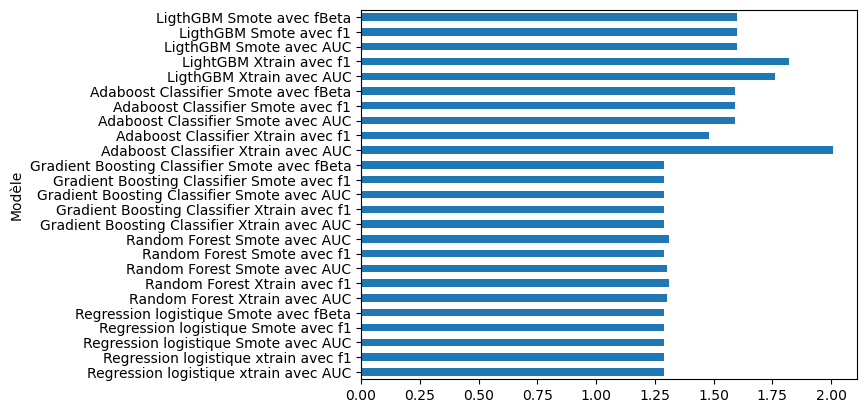

In [434]:
ax = data_scores_new['Score'].plot.barh(x='Modèle')

# LIME

In [435]:
import lime
from lime import lime_tabular

import random
import warnings

warnings.filterwarnings("ignore")

In [436]:
#df_2 = copy.deepcopy(X_sm_train)
#df_2.to_numpy()
explainer = lime_tabular.LimeTabularExplainer( xtrain[features].values, mode="classification",
                                              class_names= data_new['TARGET'].unique(),
                                              feature_names= X_sm_train.columns.tolist(),
                                             )

explainer

In [ ]:
#adb_xtrain_auc_random

In [549]:
idx = random.randint(1, len(xtest))
class_names= data_new['TARGET'].unique()
feature_names= features #xtrain[features].columns.tolist()
xtest_2 =  copy.deepcopy(xtest)
xtest_2  = xtest_2[features].to_numpy()
ytest_2 =  copy.deepcopy(ytest)
ytest_2  = ytest_2.to_numpy()



print("Prediction : ", adb_random_3.predict(xtest_2[idx].reshape(1,-1))[0]) # adb_xtrain_auc_random.predict(xtest_2[idx].reshape(1,-1))[0])
print("Actual :     ", ytest_2[idx])

explanation = explainer.explain_instance(xtest_2[idx], adb_random_3.predict_proba,  #adb_xtrain_auc_random.predict_proba,
                                         num_features=len(features))#X_sm_train.columns.tolist()))

explanation.show_in_notebook()

Prediction :  0.0
Actual :      0.0


Ci-dessous, nous expliquons un autre échantillon aléatoire de l'ensemble de données de test pour lequel le modèle fait la mauvaise prédiction. Nous récupérons des indices d'échantillons à partir de données de test pour lesquelles le modèle se trompe. Nous en sélectionnons ensuite au hasard un index. Nous passons ensuite l'échantillon avec cet index à la méthode explicit_instance() pour générer un objet d'explication. Veuillez noter que nous n'affichons que les 10 principales fonctionnalités qui contribuent le plus à la prédiction.

In [550]:
preds = adb_random_3.predict(xtest_2) #adb_xtrain_auc_random.predict(xtest_2)

false_preds = np.argwhere((preds != ytest_2)).flatten()

idx  = random.choice(false_preds)

print("Prediction : ", adb_random_3.predict(xtest_2[idx].reshape(1,-1))[0]) #adb_xtrain_auc_random.predict(xtest_2[idx].reshape(1,-1))[0])
print("Actual :     ", ytest_2[idx])

explanation = explainer.explain_instance(xtest_2[idx], adb_random_3.predict_proba) #adb_xtrain_auc_random.predict_proba)

explanation.show_in_notebook()

Prediction :  0.0
Actual :      1.0


Ci-dessous, nous avons tracé un graphique à barres de l'importance globale des caractéristiques en fonction des poids dérivés de l'adaboost classifier. Nous pouvons l'utiliser pour le comparer avec le graphique à barres généré pour les échantillons de données individuels.

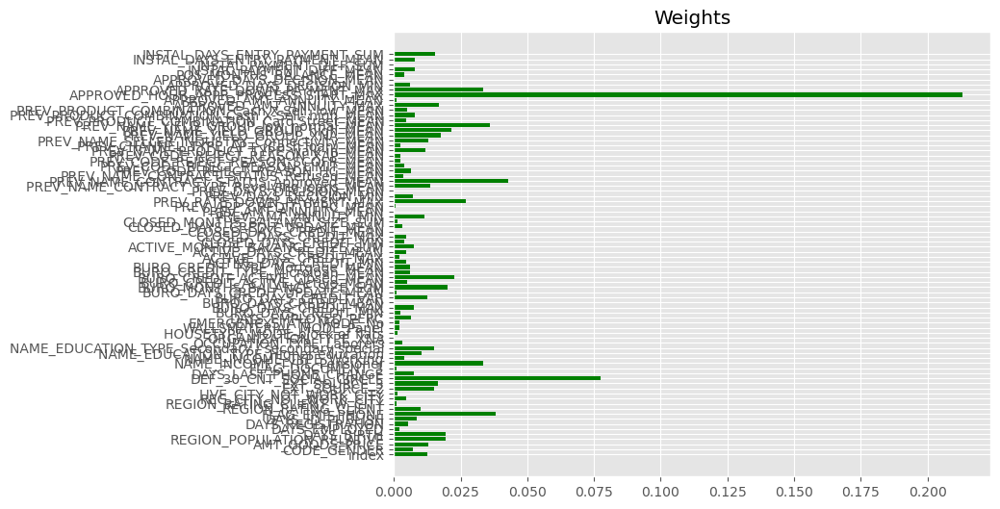

In [551]:
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(adb_random_3.best_estimator_.feature_importances_)), adb_random_3.best_estimator_.feature_importances_, color=["red" if feature_importances<0 else "green" for feature_importances in adb_random_3.best_estimator_.feature_importances_])
    plt.yticks(range(len(adb_random_3.best_estimator_.feature_importances_)),feature_names);#
    plt.title("Weights")

In [440]:
print( "Explication Prédiction Locale : ","1" if explanation.local_pred<0.5 else "0")
print("Explication Probabilité de Prédiction Globale : ", explanation.predict_proba)
print("Explication Prédiction Globale : ", class_names[np.argmax(explanation.predict_proba)])

Explication Prédiction Locale :  1
Explication Probabilité de Prédiction Globale :  [0.53346134 0.46653866]
Explication Prédiction Globale :  1.0


L'objet d'explication a une autre méthode nommée as_html() qui renvoie l'explication sous forme de code HTML stocké dans une chaîne. Nous pouvons transmettre cette chaîne à la méthode HTML d' IPython pour générer une sortie HTML.

In [441]:
from IPython.display import HTML

html_data = explanation.as_html()
HTML(data=html_data)

# Dashboard

In [442]:
data_new.to_csv('C:/Users/laeti/fichier_client.csv', index=False)

In [443]:
data_new['CODE_GENDER']

0         0
1         1
2         0
3         1
4         0
         ..
356250    1
356251    1
356252    1
356253    0
356254    1
Name: CODE_GENDER, Length: 356251, dtype: int64

In [444]:
import plotly.express as px  # interactive charts
import streamlit as st  # 🎈 data web app development

## Merger les tables pour récupérer les identifiants clients.

In [445]:
data1 = data_application_train.drop_duplicates()

In [446]:
data1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [447]:
 set(data1.columns).intersection(set(data_bureau.columns))

{'AMT_ANNUITY', 'SK_ID_CURR'}

In [448]:
data3 = data_bureau.drop_duplicates()

In [449]:
data4 = data1.drop_duplicates()

In [450]:
dataf_2 = pd.merge(data4,data3, on = ['AMT_ANNUITY','SK_ID_CURR'], how='left')

In [451]:
dataf_2.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
for i in range(dataf_2.shape[0]):
    if dataf_2.at[i,'SK_ID_CURR']== 100001:
        print(True)

In [452]:
dataf_2 = dataf_2.drop_duplicates()

In [453]:
data5 = data_bureau_balance.drop_duplicates()

In [454]:
set(dataf_2.columns).intersection(set(data5.columns))

{'SK_ID_BUREAU'}

In [455]:
dataf_3 =  pd.merge(dataf_2 , data5, on = ['SK_ID_BUREAU'], how='left')

In [ ]:
for i in range(dataf_3.shape[0]):
    if dataf_3.at[i,'SK_ID_CURR']== 100002:
        print(True)

In [456]:
data6 = data_POS_CASH_balance.drop_duplicates()

In [457]:
set(dataf_3.columns).intersection(set(data6.columns))

{'MONTHS_BALANCE', 'SK_ID_CURR'}

In [458]:
dataf_3 = dataf_3.drop_duplicates()

In [459]:
dataf_4 = pd.merge(dataf_3 ,data6, on = ['MONTHS_BALANCE','SK_ID_CURR'], how='left')

In [ ]:
for i in range(dataf_4.shape[0]):
    if dataf_4.at[i,'SK_ID_CURR']== 100002:
        print(True)

In [460]:
data7 = data_credit_card_balance.drop_duplicates()

In [461]:
dataf_4 = dataf_4.drop_duplicates()

In [462]:
set(dataf_4.columns).intersection(set(data7.columns))

{'MONTHS_BALANCE',
 'NAME_CONTRACT_STATUS',
 'SK_DPD',
 'SK_DPD_DEF',
 'SK_ID_CURR',
 'SK_ID_PREV'}

In [463]:
dataf_5 = pd.merge(dataf_4 ,data7, on = ['MONTHS_BALANCE',
                                         'NAME_CONTRACT_STATUS',
                                         'SK_DPD',
                                         'SK_DPD_DEF',
                                         'SK_ID_CURR',
                                         'SK_ID_PREV'], how='left')

In [ ]:
for i in range(dataf_5.shape[0]):
    if dataf_5.at[i,'SK_ID_CURR']== 100001:
        print(True)

In [464]:
data8 = data_previous_application.drop_duplicates()

In [465]:
dataf_5 = dataf_5.drop_duplicates()

In [466]:
set(dataf_5.columns).intersection(set(data8.columns))

{'AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'HOUR_APPR_PROCESS_START',
 'NAME_CONTRACT_STATUS',
 'NAME_CONTRACT_TYPE',
 'NAME_TYPE_SUITE',
 'SK_ID_CURR',
 'SK_ID_PREV',
 'WEEKDAY_APPR_PROCESS_START'}

In [467]:
dataf_6 = pd.merge(dataf_5 ,data8, on = ['AMT_ANNUITY',
                                         'AMT_CREDIT',
                                         'AMT_GOODS_PRICE',
                                         'HOUR_APPR_PROCESS_START',
                                         'NAME_CONTRACT_STATUS',
                                         'NAME_CONTRACT_TYPE',
                                         'NAME_TYPE_SUITE',
                                         'SK_ID_CURR',
                                         'SK_ID_PREV',
                                         'WEEKDAY_APPR_PROCESS_START'], how='left')

In [ ]:
for i in range(dataf_6.shape[0]):
    if dataf_6.at[i,'SK_ID_CURR']== 100002:
        print(True)

In [468]:
data9 = data_installments_payments.drop_duplicates()

In [469]:
dataf_6 = dataf_6.drop_duplicates()

In [470]:
set(dataf_6.columns).intersection(set(data9.columns))

{'SK_ID_CURR', 'SK_ID_PREV'}

In [471]:
data_final_1 = pd.merge(dataf_6 ,data9, on = ['SK_ID_CURR', 'SK_ID_PREV'], how='left')

In [ ]:
for i in range(data_final_1.shape[0]):
    if data_final_1.at[i,'SK_ID_CURR']== 100002:
        print(True)

In [472]:
data_final_1 = data_final_1.drop_duplicates()

In [473]:
data_final_1.shape

(311557, 195)

## Merger avec le xtest

In [ ]:
xtrain.head()

In [ ]:
xtest.head()

In [474]:
xtest_3 = xtest.drop_duplicates()

In [558]:
xtest_3.shape

(15000, 544)

In [ ]:
data_final_1['CODE_GENDER'].dtypes

In [ ]:
data_final_1['CODE_GENDER'].unique()

In [475]:
data_final_1 = data_final_1[data_final_1['CODE_GENDER'] != 'XNA']# CODE_GENDER : code sexes des clients.

In [476]:
data_final_1['CODE_GENDER'].unique()

array(['M', 'F'], dtype=object)

Text(0.5, 1.0, 'Sexe')

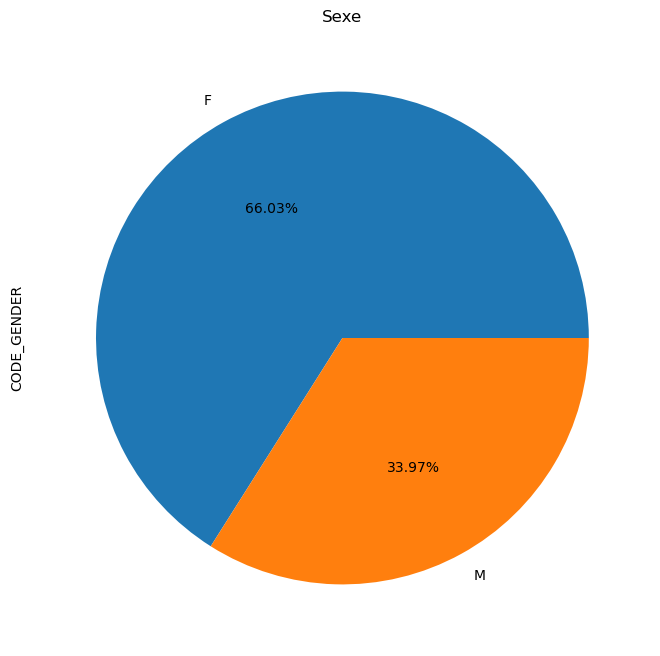

In [477]:
#Diagramme circulaire des sexes
df_data_final_1 = data_final_1['CODE_GENDER'].value_counts()
ax=df_data_final_1.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("Sexe")

In [478]:
# Categorical features with Binary encode (0 or 1; two categories)

data_final_1['CODE_GENDER'], uniques = pd.factorize(data_final_1['CODE_GENDER'])

Text(0.5, 1.0, 'Sexe')

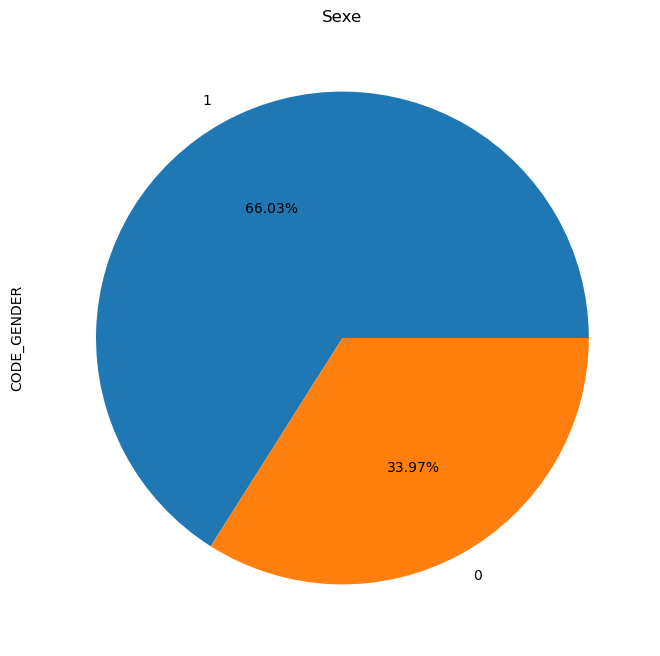

In [479]:
#Diagramme circulaire des sexes
df_data_final_1 = data_final_1['CODE_GENDER'].value_counts()
ax=df_data_final_1.plot(kind='pie',autopct='%.2f%%',figsize=(12,8))
ax.set_title("Sexe")

Donc 1 ce sont les femmes et 2 les hommes.

In [480]:
data_final_1['DAYS_EMPLOYED']=data_final_1['DAYS_EMPLOYED'].astype(float)

In [481]:
data_final_1['DAYS_REGISTRATION'].dtypes

dtype('float64')

In [482]:
xtest_3['DAYS_REGISTRATION'].dtypes

dtype('float64')

In [483]:
colonnes = ['AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'AMT_INCOME_TOTAL',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'CNT_CHILDREN',
 'CNT_FAM_MEMBERS',
 'CODE_GENDER',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'DAYS_REGISTRATION',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'FLAG_CONT_MOBILE',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_EMAIL',
 'FLAG_EMP_PHONE',
 'FLAG_MOBIL',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'FLAG_PHONE',
 'FLAG_WORK_PHONE',
 'HOUR_APPR_PROCESS_START',
 'LIVE_CITY_NOT_WORK_CITY',
 'LIVE_REGION_NOT_WORK_REGION',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'REGION_POPULATION_RELATIVE',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'SK_ID_CURR']


In [484]:
for col in colonnes : 
    if data_final_1[col].dtypes != xtest_3[col].dtypes:
        print(col)

FLAG_OWN_CAR
FLAG_OWN_REALTY


In [485]:
data_final_1['FLAG_OWN_CAR'].dtypes

dtype('O')

In [486]:
xtest_3['FLAG_OWN_CAR'].dtypes

dtype('int64')

In [487]:
data_final_1['FLAG_OWN_REALTY'].dtypes

dtype('O')

In [488]:
xtest_3['FLAG_OWN_REALTY'].dtypes

dtype('int64')

In [489]:
# Categorical features with Binary encode (0 or 1; two categories)

data_final_1['FLAG_OWN_CAR'], uniques = pd.factorize(data_final_1['FLAG_OWN_CAR'])

In [490]:
data_final_1['FLAG_OWN_REALTY'], uniques = pd.factorize(data_final_1['FLAG_OWN_REALTY'])

In [491]:
data_final_1['FLAG_OWN_CAR'].dtypes

dtype('int64')

In [492]:
set(data_final_1.columns).intersection(set(xtest_3.columns))

{'AMT_ANNUITY',
 'AMT_CREDIT',
 'AMT_GOODS_PRICE',
 'AMT_INCOME_TOTAL',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'CNT_CHILDREN',
 'CNT_FAM_MEMBERS',
 'CODE_GENDER',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'DAYS_REGISTRATION',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'FLAG_CONT_MOBILE',
 'FLAG_DOCUMENT_10',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_13',
 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15',
 'FLAG_DOCUMENT_16',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_18',
 'FLAG_DOCUMENT_19',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FLAG_DOCUMENT_6',
 'FLAG_DOCUMENT_7',
 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9',
 'FLAG_EMAIL',
 'FLAG_EMP_PHONE',
 'FLAG_MOBIL',
 'FLAG_OWN_CAR',

In [493]:
xtest_final = pd.merge(data_final_1 ,xtest_3[['SK_ID_CURR']], on = ['SK_ID_CURR'], how='inner')

In [494]:
xtest_final.shape

(12946, 195)

In [495]:
xtest_final.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,100022,0,Revolving loans,1,0,0,0,112500.0,157500.0,7875.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,100023,0,Cash loans,1,0,0,1,90000.0,544491.0,17563.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,100029,0,Cash loans,0,1,1,2,135000.0,247500.0,12703.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,100061,0,Cash loans,1,0,0,2,225000.0,314055.0,16164.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100159,0,Cash loans,1,0,0,0,225000.0,1515415.5,41800.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [496]:
col_filter = [col for col in xtest_final.columns if xtest_final[col].isnull().sum()*100.0/xtest_final.shape[0] > 98]
col_filter

['SK_ID_BUREAU',
 'CREDIT_ACTIVE',
 'CREDIT_CURRENCY',
 'DAYS_CREDIT',
 'CREDIT_DAY_OVERDUE',
 'DAYS_CREDIT_ENDDATE',
 'DAYS_ENDDATE_FACT',
 'AMT_CREDIT_MAX_OVERDUE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'AMT_CREDIT_SUM_LIMIT',
 'AMT_CREDIT_SUM_OVERDUE',
 'CREDIT_TYPE',
 'DAYS_CREDIT_UPDATE',
 'MONTHS_BALANCE',
 'STATUS',
 'SK_ID_PREV',
 'CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'NAME_CONTRACT_STATUS',
 'SK_DPD',
 'SK_DPD_DEF',
 'AMT_BALANCE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'AMT_DRAWINGS_ATM_CURRENT',
 'AMT_DRAWINGS_CURRENT',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'AMT_DRAWINGS_POS_CURRENT',
 'AMT_INST_MIN_REGULARITY',
 'AMT_PAYMENT_CURRENT',
 'AMT_PAYMENT_TOTAL_CURRENT',
 'AMT_RECEIVABLE_PRINCIPAL',
 'AMT_RECIVABLE',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_ATM_CURRENT',
 'CNT_DRAWINGS_CURRENT',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'CNT_DRAWINGS_POS_CURRENT',
 'CNT_INSTALMENT_MATURE_CUM',
 'AMT_APPLICATION',
 'AMT_DOWN_PAYMENT',
 'FLAG_LAST_APPL_PER_CONTRACT',
 'NFLA

In [497]:
xtest_final.drop(col_filter,1, inplace=True)

In [498]:
xtest_final.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100022,0,Revolving loans,1,0,0,0,112500.0,157500.0,7875.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100023,0,Cash loans,1,0,0,1,90000.0,544491.0,17563.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
2,100029,0,Cash loans,0,1,1,2,135000.0,247500.0,12703.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100061,0,Cash loans,1,0,0,2,225000.0,314055.0,16164.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,5.0
4,100159,0,Cash loans,1,0,0,0,225000.0,1515415.5,41800.5,...,0,0,0,0,0.0,0.0,0.0,0.0,2.0,0.0


In [499]:
xtest[features]

,index,CODE_GENDER,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_EMP_PHONE,REGION_RATING_CLIENT,...,APPROVED_AMT_ANNUITY_MEAN,APPROVED_HOUR_APPR_PROCESS_START_MAX,APPROVED_RATE_DOWN_PAYMENT_MAX,APPROVED_DAYS_DECISION_MIN,APPROVED_DAYS_DECISION_MEAN,POS_MONTHS_BALANCE_MEAN,INSTAL_PAYMENT_DIFF_MEAN,INSTAL_PAYMENT_DIFF_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM
318877,11366,1,1242000.0,0.002134,-22611,-5619.0,-4321.0,-3232,1,3,...,50780.130000,13.0,0.142108,-1572.0,-826.333333,-23.454545,-29210.282561,-1197621.585,-594.317073,-24367.0
236226,236226,0,225000.0,0.010006,-16199,-3651.0,-5845.0,-5683,1,2,...,14540.197500,12.0,0.413160,-2820.0,-2680.000000,-84.166667,633.236786,8865.315,-2536.500000,-35511.0
263553,263553,0,454500.0,0.006671,-10310,-2406.0,-8735.0,-2897,1,2,...,13068.675000,19.0,0.000000,-1142.0,-1142.000000,-32.500000,0.000000,0.000,-967.818182,-10646.0
142303,142303,0,225000.0,0.010966,-9404,-542.0,-6338.0,-2060,1,2,...,11476.271250,15.0,0.104273,-1487.0,-942.000000,-28.571429,0.000000,0.000,-806.565775,-21233.0
170492,170492,1,225000.0,0.019689,-16112,-4954.0,-10854.0,-3696,1,2,...,15397.188750,15.0,0.109908,-2912.0,-1181.500000,-40.264706,0.000000,0.000,-568.392857,-31830.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255374,255374,1,679500.0,0.006671,-16633,-787.0,-2407.0,-164,1,2,...,6546.397500,14.0,0.764860,-2692.0,-1534.000000,-44.272727,0.000000,0.000,-1327.222222,-11945.0
215459,215459,1,360000.0,0.009334,-14108,-7273.0,-8224.0,-1485,1,2,...,6800.805000,17.0,0.000000,-424.0,-424.000000,-44.565217,523.138846,6800.805,-225.307692,-2929.0
298728,298728,1,2025000.0,0.024610,-19829,-2472.0,-1363.0,-3327,1,2,...,33325.056000,19.0,0.108909,-2270.0,-1077.000000,-35.107692,790.105263,45036.000,-1075.842105,-61323.0
116662,116662,1,180000.0,0.018801,-8815,-684.0,-483.0,-1434,1,2,...,11476.271250,15.0,0.104273,-1487.0,-942.000000,-28.571429,0.000000,0.000,-806.565775,-21233.0


In [500]:
xtrain.head()

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
318909,-1.334098,-0.932980,0.717786,1.390339,-0.663752,-0.578301,3.056135,3.065071,1.954346,3.499957,...,0.582196,-0.533397,1.520609,-0.412669,0.540497,-0.520203,-0.349703,0.576167,0.680184,-0.831685
186300,0.528704,0.362263,0.717786,-0.719249,-0.663752,-0.578301,-0.662134,-1.181905,-1.078160,-1.160776,...,-0.276157,-0.468509,0.013317,-0.370783,-0.204172,-0.409622,0.449874,0.372947,0.453538,-0.409548
245497,1.159184,1.024965,-1.393172,-0.719249,-0.663752,-0.578301,-0.030028,-0.341922,-0.425619,-0.208849,...,-0.349958,-0.729716,0.219184,-0.510351,-0.343918,-0.709569,-4.722974,-3.335575,0.587983,-0.906180
302074,1.761761,1.665511,0.717786,-0.719249,-0.663752,-0.578301,-0.848047,-0.314519,-0.391242,-0.555004,...,-0.222816,-0.675574,0.136839,-0.398178,-0.223287,-0.657345,-4.011614,-2.765124,0.469177,-0.831685
106241,-0.323968,-0.539416,-1.393172,-0.719249,1.506587,0.791154,1.011087,0.979764,-0.030288,0.471099,...,-0.219016,-0.382595,-0.152748,-0.398581,-0.231442,-0.385224,0.474274,0.190346,0.361121,-0.359885


In [501]:
import pickle
from pickle import *

In [502]:
f = open("xyzrt","wb")
x = xtrain[features]
y = ytest_2
z = xtest_2
r = adb_xtrain_auc_random  
t = xtest_final
dump(x,f)
dump(y,f)
dump(z,f)
dump(r,f)
dump(t,f)
f.close()

In [ ]:
for i in range(xtest_final.shape[0]):
    if xtest_final.at[i,'SK_ID_CURR']== 100005:
        print(True)

 # API

In [503]:
import copy
xtest_final_2 = copy.deepcopy(xtest_final)

In [504]:
len(set(xtest_final['SK_ID_CURR'].unique()).intersection(set(xtest['SK_ID_CURR'].unique())))

12925

In [505]:
len(set(xtest_final['SK_ID_CURR'].unique()))

12925

In [567]:
 y_proba = adb_random_3.predict_proba(xtest[features]) #adb_xtrain_auc_random.predict_proba(xtest[features])#

train_set_proba = pd.DataFrame({
        'SK_ID_CURR':
        xtest.index,
        'pred_proba':
        y_proba[:, 1],
        'TARGET_True':
        ytest.astype(int)
    })
seuils_1 = np.linspace(0, 1, 1001)
gains_modelises_1 = [gain_modelise(seuil, train_set_proba) for seuil in seuils_1]

# Quelle est la valeur de seuil qui conduit au max ?
max_value_train_1 = max(gains_modelises_1)
max_index_1 = gains_modelises_1.index(max_value_train_1)
max_seuil_1 = seuils[max_index_1]

In [568]:
train_set_proba = train_set_proba.reset_index()

In [569]:
train_set_proba.head()

,index,SK_ID_CURR,pred_proba,TARGET_True
0,318877,318877,0.498864,0
1,236226,236226,0.498892,0
2,263553,263553,0.498497,0
3,142303,142303,0.497554,0
4,170492,170492,0.499445,0


In [509]:
ind = train_set_proba[train_set_proba['SK_ID_CURR']==318877].index.values.astype(int)[0]

In [510]:
ind

0

In [570]:
max_seuil_1

0.5

In [512]:
train_set_proba['TARGET_True'].isnull().sum()

0

In [513]:
train_set_proba['TARGET_True'].unique()

array([0, 1])

In [514]:
xtest_final_100 = xtest_final.sample(100)

In [515]:
xtest_final_100.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
1684,146187,0,Cash loans,1,0,0,0,81000.0,168102.0,16753.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,7.0
8870,343719,0,Cash loans,0,1,1,2,139500.0,143910.0,16272.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,8.0
9990,373885,0,Cash loans,1,0,0,0,90000.0,717003.0,23260.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
5195,241539,0,Cash loans,1,0,0,1,144000.0,592560.0,31153.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
10304,382240,0,Cash loans,0,1,1,0,135000.0,248760.0,26919.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [516]:
xtest_final_100['NAME_EDUCATION_TYPE'].unique()

array(['Secondary / secondary special', 'Higher education',
       'Incomplete higher', 'Lower secondary'], dtype=object)

In [557]:
xtest = xtest.drop_duplicates()
xtest.shape

(15000, 544)

In [559]:
'SK_ID_CURR' in features

False

In [560]:
id = xtest_4['SK_ID_CURR']

In [517]:
xtest_4 = copy.deepcopy(xtest)

In [518]:
xtest_4 = xtest_4.reset_index()

In [561]:
xtest_4 = xtest_4[features]
xtest_4['SK_ID_CURR'] = id

In [562]:
xtest_4.shape

(15000, 81)

In [519]:
xtest_4.head()

,level_0,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
0,318877,11366,182486,1,1,0,0,315000.0,1438731.0,61087.5,...,49961.932683,2048439.240,22500.000,297000.0000,79172.215244,3246060.825,-27.0,-594.317073,-24367.0,41.0
1,236226,236226,373620,0,1,1,2,225000.0,225000.0,26703.0,...,11226.972857,157177.620,7.830,26125.2900,10593.736071,148312.305,-2366.0,-2536.500000,-35511.0,14.0
2,263553,263553,405153,0,1,0,0,202500.0,490495.5,30006.0,...,14190.516818,156095.685,13068.675,25408.9350,14190.516818,156095.685,-811.0,-967.818182,-10646.0,11.0
3,142303,142303,264998,0,1,0,0,112500.0,254700.0,25834.5,...,12726.201316,334393.200,2323.575,37035.4725,12404.115000,324801.225,-65.0,-806.565775,-21233.0,25.0
4,170492,170492,297598,1,0,0,0,157500.0,343800.0,12478.5,...,12507.856071,700439.940,0.450,67500.0000,12507.856071,700439.940,-8.0,-568.392857,-31830.0,56.0


In [520]:
 xtest_final_100['Target_bool'] =xtest_final_100['TARGET'].isnull()        

In [521]:
ind_liste = xtest_final_100['TARGET'].index.values.astype(int)
for i in range(len(ind_liste)): 
    ind_2 = ind_liste[i]
    if xtest_final_100.at[ind_2, 'Target_bool']== True:
        num_client = xtest_final_100.at[ind_2, 'SK_ID_CURR']
        for j in range(data_application_test.shape[0]):
            if data_application_test.at[j,'SK_ID_CURR']== num_client:
                print(j)
                print(num_client)
                #xtest_final_100.at[ind_2, 'TARGET']= data_application_train[j,'TARGET']

In [522]:
y_pred_data = adb_xtrain_auc_random.predict(xtest_4[features])

In [523]:
np.unique(y_pred_data)

array([0.])

In [524]:
ind_liste

array([ 1684,  8870,  9990,  5195, 10304, 10373,  2201,  5963,  8101,
       12304,  3687,  9884,  2503, 10967,  8787,  2563,  1379,  3648,
       12339,   370, 10198,  7753,   190,  7450, 12843,  7909,  2662,
        4687,  5902,  1786,  2072,  6351,  4587,  5859,   313,   355,
        9192, 11135,   640,  2818, 12169,  5303,  5594,  7365,  6806,
        6213,  1222,   285,  5747,  8506,  9889,  5300,  7765,  2018,
        7627, 11887,  3354,  5335, 10851, 10794,  5916,  2257,  2445,
         831, 11544,  7679,  7524,  4240, 12323,  9845,  4244,  2440,
        8855,  2847,  8699,   461,  1329,  4549,  2764,  4008,  2801,
        8015,  1944, 11600,  8004,  4571,  5815,  3982,  6075,   553,
        8531,  8999,  3000, 12728,  2812, 10383,  6380, 11005,  8919,
        9417])

In [554]:
xtest_4.shape

(15000, 545)

In [571]:
f = open("xyzrtuvgps","wb")
x = xtrain[features]
y = ytest_2
z = xtest_4
r = adb_random_3 #adb_xtrain_auc_random
t = xtest_final#xtest_final_100
u = max_seuil_1
v = train_set_proba
g =  features
p = xtest[features]
s = xtest_2
dump(x,f)
dump(y,f)
dump(z,f)
dump(r,f)
dump(t,f)
dump(u,f)
dump(v,f)
dump(g,f)
dump(p,f)
dump(s,f)
f.close()

In [572]:
f = open("x","wb")
x = xtrain[features]
dump(x,f)
f.close()

In [534]:
f = open("y","wb")
y = ytest_2
dump(y,f)
f.close()

In [564]:
f = open("z","wb")
z = xtest_4
dump(z,f)
f.close()

In [553]:
f = open("r","wb")
r = adb_random_3 #adb_xtrain_auc_random
dump(r,f)
f.close()

In [537]:
f = open("t","wb")
t = xtest_final
dump(t,f)
f.close()

In [573]:
f = open("u","wb")
u = max_seuil_1
dump(u,f)
f.close()

In [539]:
f = open("v","wb")
v = train_set_proba
dump(v,f)
f.close()

In [540]:
f = open("g","wb")
g =  features
dump(g,f)
f.close()

In [566]:
f = open("p","wb")
p = xtest[features]
dump(p,f)
f.close()

In [542]:
f = open("s","wb")
s = xtest_2
dump(s,f)
f.close()

In [526]:
xtest.head()

,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
318877,11366,182486,1,1,0,0,315000.0,1438731.0,61087.5,1242000.0,...,49961.932683,2048439.240,22500.000,297000.0000,79172.215244,3246060.825,-27.0,-594.317073,-24367.0,41.0
236226,236226,373620,0,1,1,2,225000.0,225000.0,26703.0,225000.0,...,11226.972857,157177.620,7.830,26125.2900,10593.736071,148312.305,-2366.0,-2536.500000,-35511.0,14.0
263553,263553,405153,0,1,0,0,202500.0,490495.5,30006.0,454500.0,...,14190.516818,156095.685,13068.675,25408.9350,14190.516818,156095.685,-811.0,-967.818182,-10646.0,11.0
142303,142303,264998,0,1,0,0,112500.0,254700.0,25834.5,225000.0,...,12726.201316,334393.200,2323.575,37035.4725,12404.115000,324801.225,-65.0,-806.565775,-21233.0,25.0
170492,170492,297598,1,0,0,0,157500.0,343800.0,12478.5,225000.0,...,12507.856071,700439.940,0.450,67500.0000,12507.856071,700439.940,-8.0,-568.392857,-31830.0,56.0


In [527]:
data_un_client = xtest_4[xtest_4['SK_ID_CURR'] ==100911]

In [528]:
data_un_client

,level_0,index,SK_ID_CURR,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,INSTAL_AMT_INSTALMENT_MEAN,INSTAL_AMT_INSTALMENT_SUM,INSTAL_AMT_PAYMENT_MIN,INSTAL_AMT_PAYMENT_MAX,INSTAL_AMT_PAYMENT_MEAN,INSTAL_AMT_PAYMENT_SUM,INSTAL_DAYS_ENTRY_PAYMENT_MAX,INSTAL_DAYS_ENTRY_PAYMENT_MEAN,INSTAL_DAYS_ENTRY_PAYMENT_SUM,INSTAL_COUNT
12066,796,796,100911,0,0,1,0,360000.0,270000.0,13500.0,...,9688.381364,746005.365,4035.51,47879.595,9688.381364,746005.365,-54.0,-489.675325,-37705.0,77.0


In [529]:
 y_pred = adb_xtrain_auc_random.predict(data_un_client[features])

In [530]:
y_pred

array([0.])

In [548]:
f = open("model","wb")
model = adb_random_3 #clf_ref_eval_metric #adb_xtrain_auc_random #adb_xtrain_auc_random
dump(model,f)
f.close()

In [532]:
# Save the trained model as a pickle string.
saved_model = pickle.dumps(adb_xtrain_auc_random)